In [35]:
pip install seaborn --upgrade

   ---------------------------------------- 0.0/294.8 kB ? eta -:--:--
   - -------------------------------------- 10.2/294.8 kB ? eta -:--:--
   -------- ------------------------------ 61.4/294.8 kB 812.7 kB/s eta 0:00:01
   ----------------------- ---------------- 174.1/294.8 kB 1.5 MB/s eta 0:00:01
   -------------------------------------- - 286.7/294.8 kB 2.0 MB/s eta 0:00:01
   ---------------------------------------- 294.8/294.8 kB 1.8 MB/s eta 0:00:00
  Attempting uninstall: seaborn
    Found existing installation: seaborn 0.12.2
    Uninstalling seaborn-0.12.2:
      Successfully uninstalled seaborn-0.12.2
Note: you may need to restart the kernel to use updated packages.


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import scipy.stats as stats
from sklearn.datasets import make_classification
from sklearn.manifold import TSNE
from statsmodels.graphics.mosaicplot import mosaic
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import plotly.express as px
from umap import UMAP

In [2]:
data = pd.read_csv("C:\Aniruddh\Python\Jupyter\RCC\CSV FILES\Cleaned data\RCC_cleaned_data.csv")
data

,AGE,SEX,DM,HTN,CKD,INCIDENTAL,PAIN,HEMATURIA,MASS,LOW,...,T,N,M,IVC INV,MAX DIA,APPROACH,HISTOPATHOLOGY,GRADE,MONTHS,RECURRENCE
0,32,M,0,0,0,0,1,0,0,0.0,...,2,0,1,0,8.0,2,clear cell,2.0,95,0
1,45,F,0,0,0,0,1,1,0,0.0,...,4,1,1,0,4.9,1,clear cell,2.0,95,0
2,47,M,0,0,0,1,0,0,0,0.0,...,3b,0,1,1,9.0,1,clear cell,3.0,95,0
3,58,M,0,0,0,0,0,1,0,0.0,...,3a,0,0,0,7.0,2,clear cell,2.0,95,1
4,22,M,0,0,0,0,1,0,0,0.0,...,2b,0,0,0,10.4,1,clear cell,2.0,94,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
690,64,M,0,0,0,0,1,0,0,0.0,...,3a,0,0,0,8.0,1,clear cell,4.0,18,0
691,49,M,0,0,0,0,0,1,0,0.0,...,2a,0,0,0,10.0,1,clear cell,3.0,18,0
692,73,M,0,1,0,0,0,1,0,0.0,...,3b,0,0,1,7.5,2,clear cell,1.0,18,0
693,65,F,0,0,0,0,1,0,0,0.0,...,3a,0,0,0,10.0,1,clear cell,1.0,18,0


In [3]:
obj_cols = []
num_cont_cols = []
num_cat_cols = []
for col in data.columns:
    print(f"{col}: {data[col].dtype}, {data[col].nunique()}")
    if data[col].dtype == object:
        obj_cols.append(col)
    else:
        if data[col].nunique() <= 4:
            num_cat_cols.append(col)
        else:
            num_cont_cols.append(col)

AGE: int64, 67
SEX: object, 2
DM: int64, 2
HTN: int64, 2
CKD: int64, 2
INCIDENTAL: int64, 2
PAIN: int64, 2
HEMATURIA: int64, 2
MASS: int64, 2
LOW: float64, 2
FEVER: int64, 2
SITE: object, 3
T: object, 9
N: int64, 2
M: int64, 2
IVC INV: int64, 2
MAX DIA: float64, 97
APPROACH: int64, 3
HISTOPATHOLOGY: object, 2
GRADE: float64, 4
MONTHS: int64, 78
RECURRENCE: int64, 2


In [4]:
def column_print():
    print("Object columns:")
    for col in obj_cols:
        print(f"{col}: {data[col].dtype}, {data[col].nunique()}")
    print()
    print("Numeric categorical columns:")
    for col in num_cat_cols:
        print(f"{col}: {data[col].dtype}, {data[col].nunique()}")
    print()
    print("Numeric continuous columns:")
    for col in num_cont_cols:
        print(f"{col}: {data[col].dtype}, {data[col].nunique()}")

In [5]:
column_print()

Object columns:
SEX: object, 2
SITE: object, 3
T: object, 9
HISTOPATHOLOGY: object, 2

Numeric categorical columns:
DM: int64, 2
HTN: int64, 2
CKD: int64, 2
INCIDENTAL: int64, 2
PAIN: int64, 2
HEMATURIA: int64, 2
MASS: int64, 2
LOW: float64, 2
FEVER: int64, 2
N: int64, 2
M: int64, 2
IVC INV: int64, 2
APPROACH: int64, 3
GRADE: float64, 4
RECURRENCE: int64, 2

Numeric continuous columns:
AGE: int64, 67
MAX DIA: float64, 97
MONTHS: int64, 78


In [6]:
np.ptp(data['AGE'])

77

C:\Users\aniru\AppData\Local\Temp\ipykernel_7360\625444323.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x='AGE', data=data, palette='viridis')


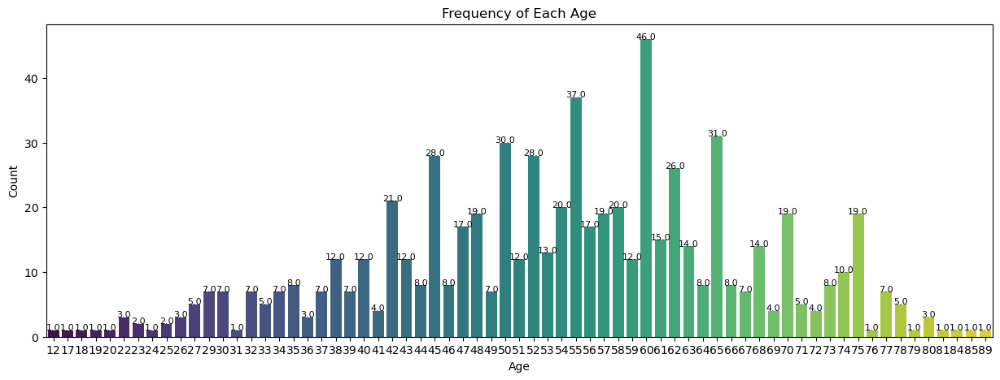

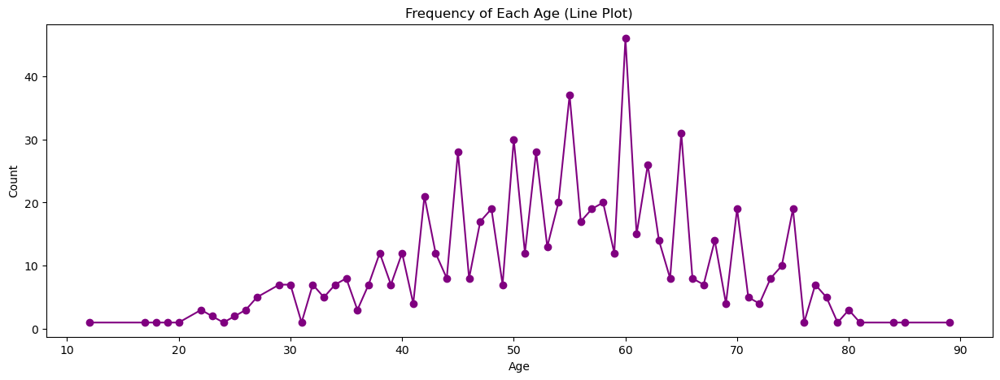

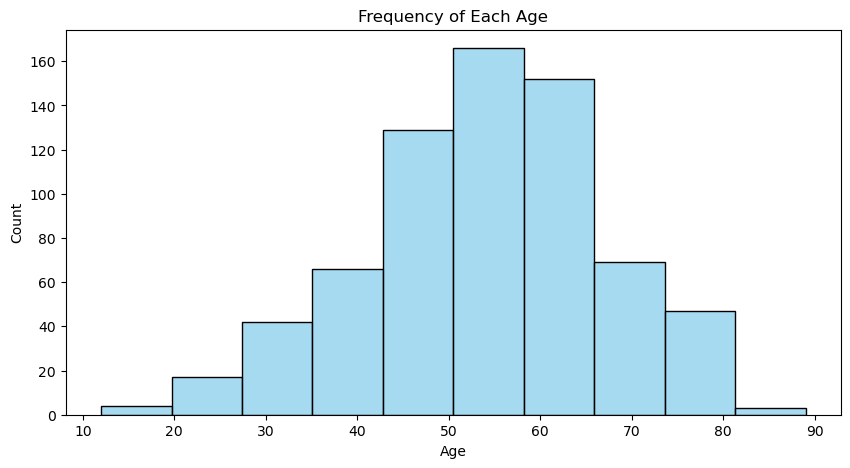

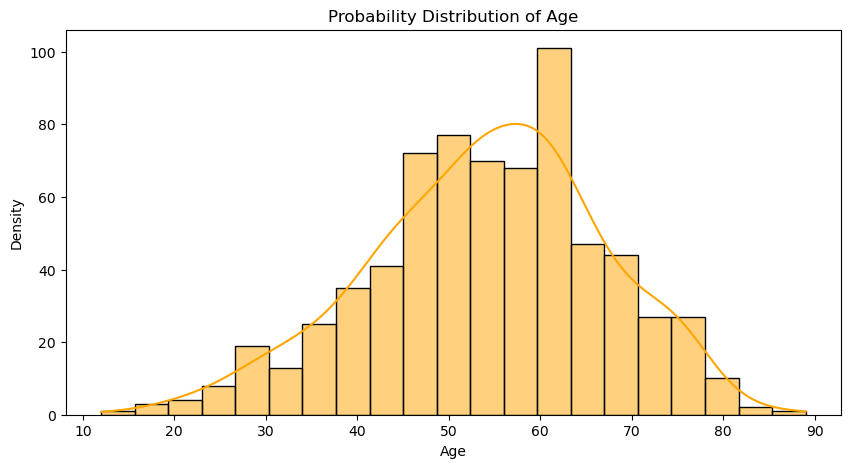

In [7]:
# Plotting the frequency of each age using a bar plot
plt.figure(figsize=(15, 5))
# sns.countplot(x='AGE', data=data, palette='viridis')

ax = sns.countplot(x='AGE', data=data, palette='viridis')
# Add frequency labels on top of each bar
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='baseline', fontsize=8, color='black')

plt.title('Frequency of Each Age')
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()

plt.figure(figsize=(15, 5))
# sns.lineplot(x=data['AGE'], y=data['AGE'].value_counts().sort_index(), data=df, marker='o', color='purple')
plt.plot(data['AGE'].value_counts().sort_index(), marker='o', color='purple')
plt.title('Frequency of Each Age (Line Plot)')
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()

# Plotting the frequency of each age using a line plot
plt.figure(figsize=(10, 5))
sns.histplot(data['AGE'], kde=False, color='skyblue', bins=10)
plt.title('Frequency of Each Age')
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()

# Plotting the probability distribution (kernel density estimation)
plt.figure(figsize=(10, 5))
sns.histplot(data['AGE'], kde=True, color='orange')
plt.title('Probability Distribution of Age')
plt.xlabel('Age')
plt.ylabel('Density')
plt.show()

C:\Users\aniru\AppData\Local\Temp\ipykernel_7360\1080274198.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x='AGE', data=data, palette='viridis')


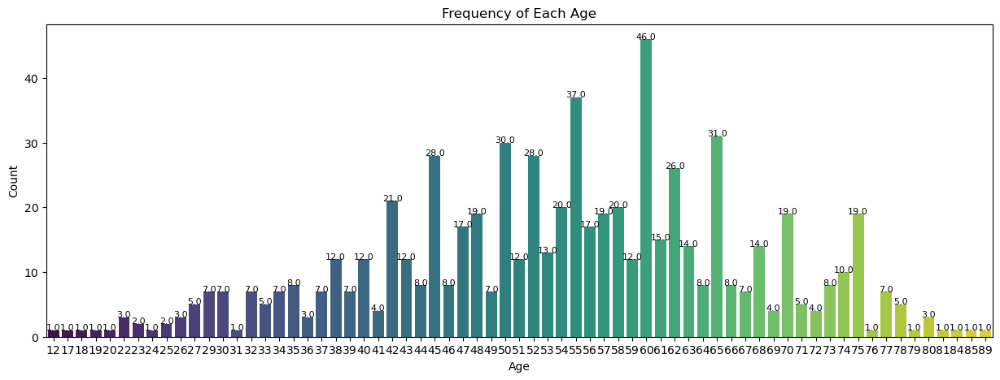

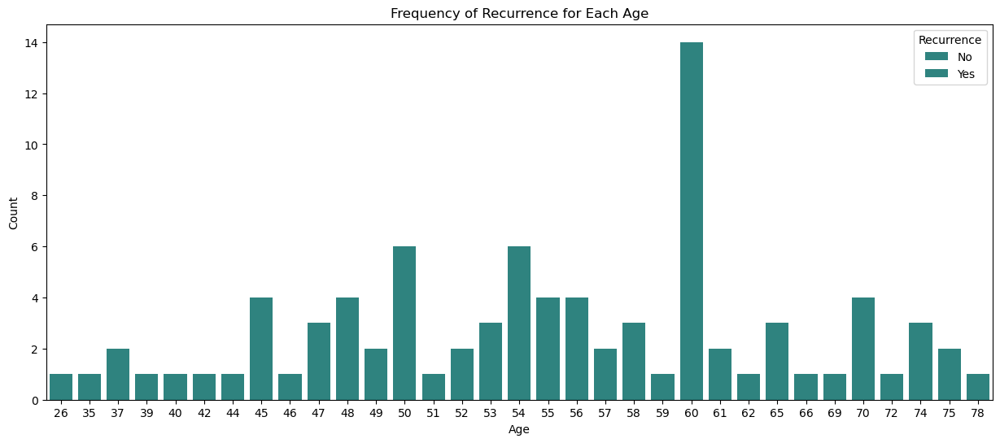

In [8]:
# Plotting the frequency of each age using a bar plot
plt.figure(figsize=(15, 5))
# sns.countplot(x='AGE', data=data, palette='viridis')

ax = sns.countplot(x='AGE', data=data, palette='viridis')
# Add frequency labels on top of each bar
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='baseline', fontsize=8, color='black')

plt.title('Frequency of Each Age')
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()

# Plotting the frequency of recurrence for each age
plt.figure(figsize=(15, 6))
sns.countplot(x='AGE', data=data[data['RECURRENCE'] == 1].astype({'RECURRENCE': str}), hue='RECURRENCE', palette='viridis')
plt.title('Frequency of Recurrence for Each Age')
plt.xlabel('Age')
plt.ylabel('Count')
plt.legend(title='Recurrence', labels=['No', 'Yes'])
plt.show()

C:\Users\aniru\AppData\Local\Temp\ipykernel_7360\2537483718.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x='MAX DIA', data=data, palette='viridis')


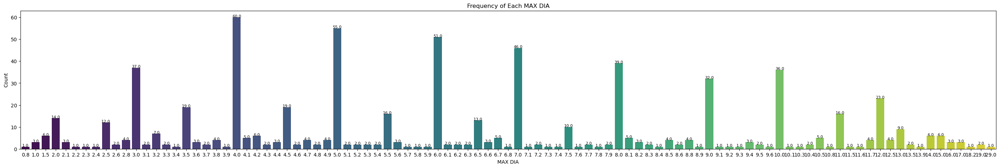

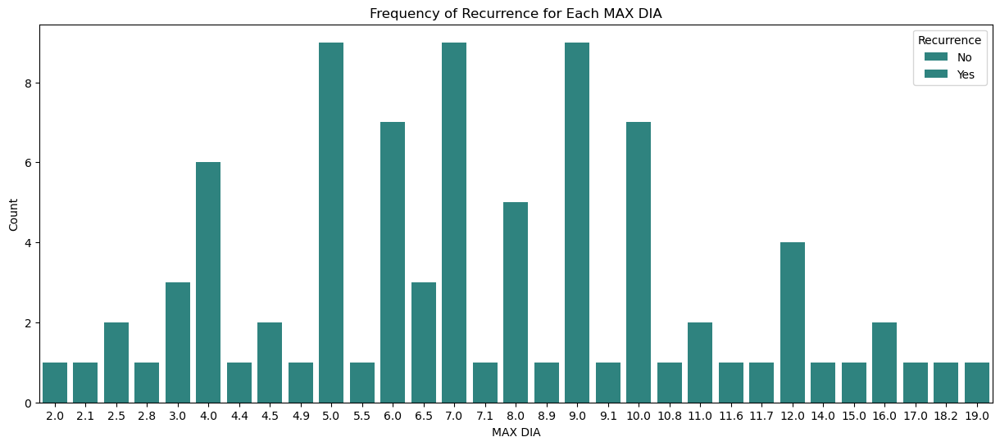

In [9]:
# Plotting the frequency of each age using a bar plot
plt.figure(figsize=(35, 5))
# sns.countplot(x='AGE', data=data, palette='viridis')

ax = sns.countplot(x='MAX DIA', data=data, palette='viridis')
# Add frequency labels on top of each bar
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='baseline', fontsize=8, color='black')

plt.title('Frequency of Each MAX DIA')
plt.xlabel('MAX DIA')
plt.ylabel('Count')
plt.show()

# Plotting the frequency of recurrence for each age
plt.figure(figsize=(15, 6))
sns.countplot(x='MAX DIA', data = data[data['RECURRENCE'] == 1].astype({'RECURRENCE': str}), hue='RECURRENCE', palette='viridis')
plt.title('Frequency of Recurrence for Each MAX DIA')
plt.xlabel('MAX DIA')
plt.ylabel('Count')
plt.legend(title='Recurrence', labels=['No', 'Yes'])
plt.show()

C:\Users\aniru\AppData\Local\Temp\ipykernel_7360\4175920698.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x='MONTHS', data=data, palette='viridis')


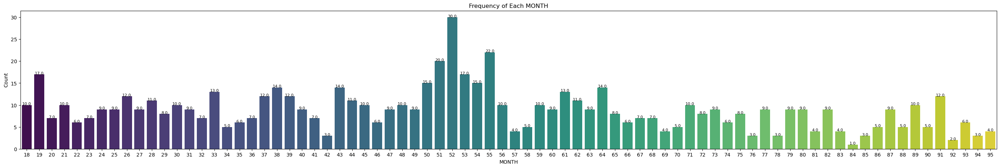

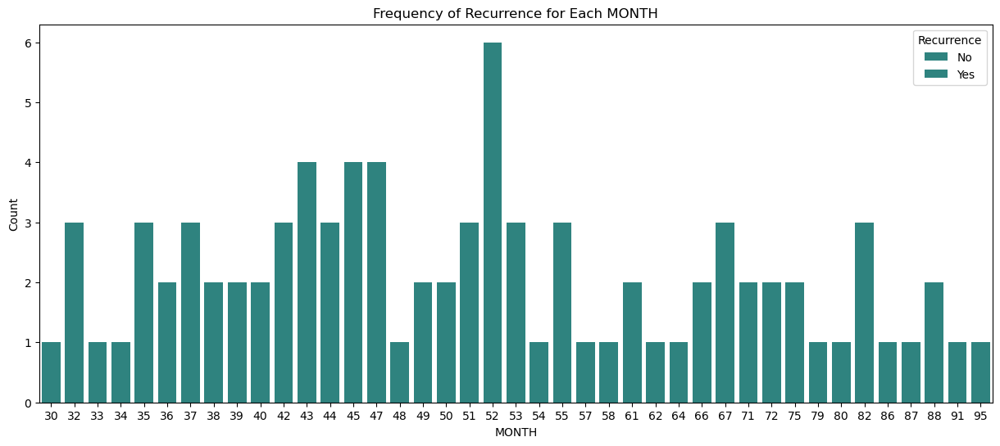

In [10]:
# Plotting the frequency of each age using a bar plot
plt.figure(figsize=(35, 5))
# sns.countplot(x='AGE', data=data, palette='viridis')

ax = sns.countplot(x='MONTHS', data=data, palette='viridis')
# Add frequency labels on top of each bar
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='baseline', fontsize=8, color='black')

plt.title('Frequency of Each MONTH')
plt.xlabel('MONTH')
plt.ylabel('Count')
plt.show()

# Plotting the frequency of recurrence for each age
plt.figure(figsize=(15, 6))
sns.countplot(x='MONTHS', data = data[data['RECURRENCE'] == 1].astype({'RECURRENCE': str}), hue='RECURRENCE', palette='viridis')
plt.title('Frequency of Recurrence for Each MONTH')
plt.xlabel('MONTH')
plt.ylabel('Count')
plt.legend(title='Recurrence', labels=['No', 'Yes'])
plt.show()

In [11]:
def bar_plot(col):
    # Plotting the frequency of each age using a bar plot
    plt.figure(figsize=(10, 5))

    ax = sns.countplot(x=col, data=data, palette='viridis')
    non_nans = data[col].notna().sum()
    # Add frequency labels on top of each bar
    for p in ax.patches:
        ax.annotate(f'{p.get_height(), round(p.get_height() / non_nans, 3)}',
                    (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='baseline', fontsize=8, color='black')

    plt.title(f'Frequency of Each {col}')
    plt.xlabel(f"{col}")
    plt.ylabel('Count')
    plt.show()

In [12]:
def pie_chart1(col):
    # Count the occurrences of each category in the column
    category_counts = data[col].value_counts()

    # Plotting the pie chart
    plt.figure(figsize=(8, 8))
    plt.pie(category_counts, labels=category_counts.index, autopct='%1.1f%%', colors=sns.color_palette('viridis'), startangle=90)
    plt.legend(category_counts.index, title=col, loc='center left', bbox_to_anchor=(1, 0.5))
    plt.title(f'Distribution of {col}')
    plt.show()

def pie_chart2(col):
    category_counts = data[col].value_counts()
    plt.figure(figsize=(8, 8))
    wedges, texts, autotexts = plt.pie(category_counts, labels=None, autopct='', colors=sns.color_palette('viridis'), startangle=90)
    
    # Create a legend with percentages
    legend_labels = [f'{label} ({percentage:.1f}%)' for label, percentage in zip(category_counts.index, category_counts / category_counts.sum() * 100)]
    plt.legend(wedges, legend_labels, title=col, loc='center left', bbox_to_anchor=(1, 0.5))
    
    plt.title(f'Distribution of {col}')
    plt.show()

In [13]:
def pie_chart_with_explode(col, explode_category=None, explode_factor=0.1):
    category_counts = data[col].value_counts()
    explode = [explode_factor if label == explode_category else 0 for label in category_counts.index]
    
    plt.figure(figsize=(8, 8))
    wedges, texts, autotexts = plt.pie(category_counts, labels=None, autopct='', explode=explode, colors=sns.color_palette('viridis'), startangle=90)
    
    # Create a legend with percentages
    legend_labels = [f'{label} ({percentage:.1f}%)' for label, percentage in zip(category_counts.index, category_counts / category_counts.sum() * 100)]
    plt.legend(wedges, legend_labels, title=col, loc='center left', bbox_to_anchor=(1, 0.5))
    
    plt.title(f'Distribution of {col}')
    plt.show()

def pie_chart_with_inverse_explode(col):
    # Count the occurrences of each category in the column
    category_counts = data[col].value_counts()

    # Calculate explosion factors inversely proportional to category counts
    explode_factors = (1 - category_counts / category_counts.max()) * 0.3

    # Create a pie chart with the calculated explode factors
    plt.figure(figsize=(8, 8))
    wedges, texts, autotexts = plt.pie(category_counts, labels=None, autopct='', explode=explode_factors, colors=sns.color_palette('viridis'), startangle=90)

    # Create a legend with percentages
    legend_labels = [f'{label} ({percentage:.1f}%)' for label, percentage in zip(category_counts.index, category_counts / category_counts.sum() * 100)]
    plt.legend(wedges, legend_labels, title=col, loc='center left', bbox_to_anchor=(1, 0.5))

    # Set the title for the pie chart
    plt.title(f'Distribution of {col}')

    # Display the pie chart
    plt.show()

C:\Users\aniru\AppData\Local\Temp\ipykernel_7360\2545943831.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=col, data=data, palette='viridis')


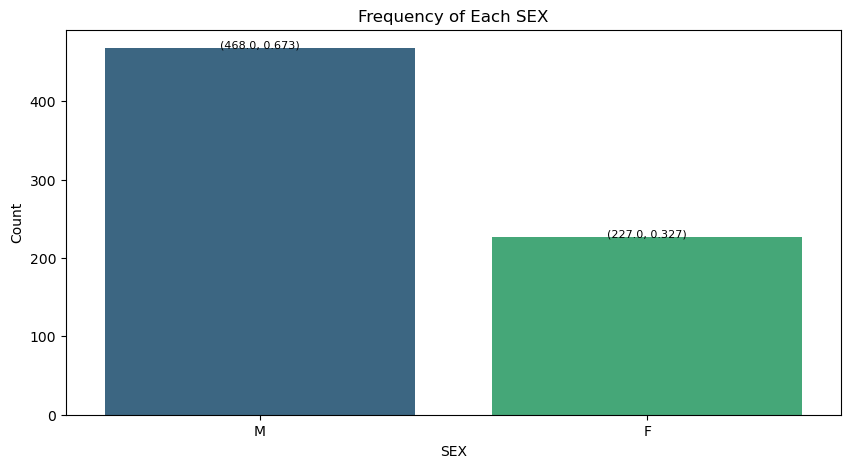

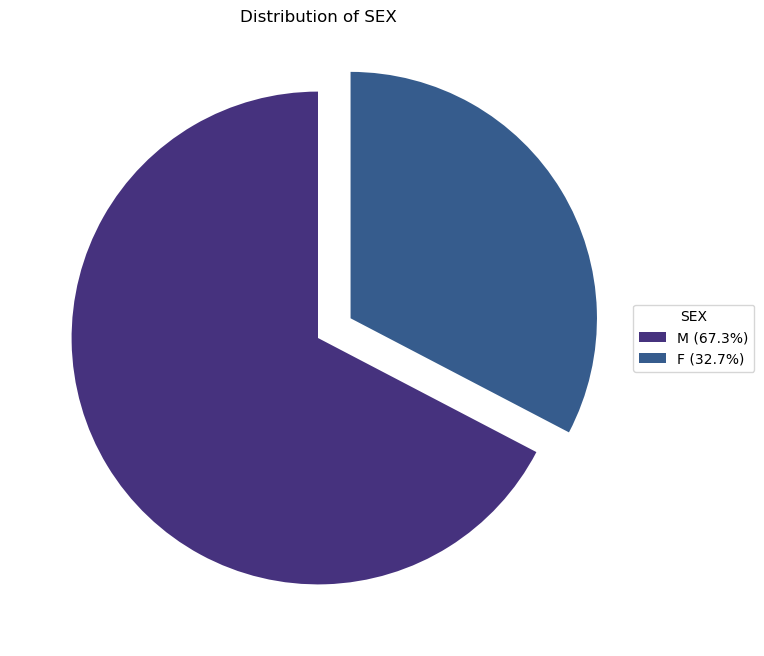

C:\Users\aniru\AppData\Local\Temp\ipykernel_7360\2545943831.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=col, data=data, palette='viridis')


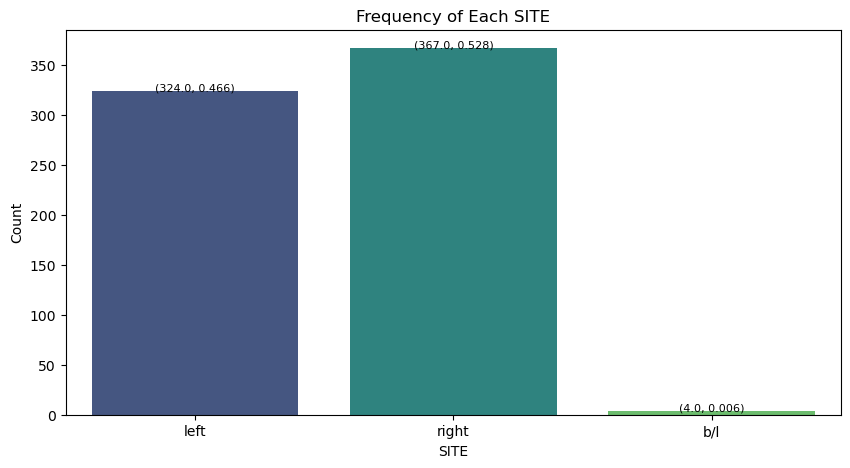

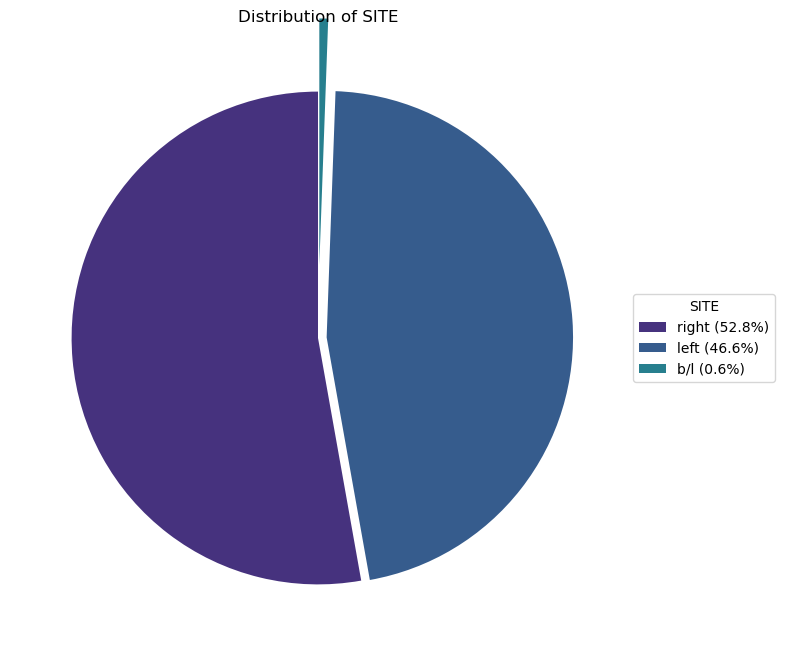

C:\Users\aniru\AppData\Local\Temp\ipykernel_7360\2545943831.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=col, data=data, palette='viridis')


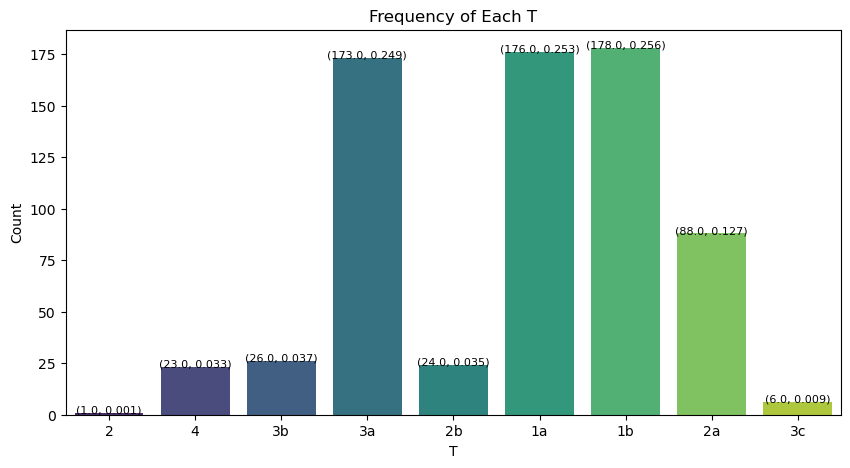

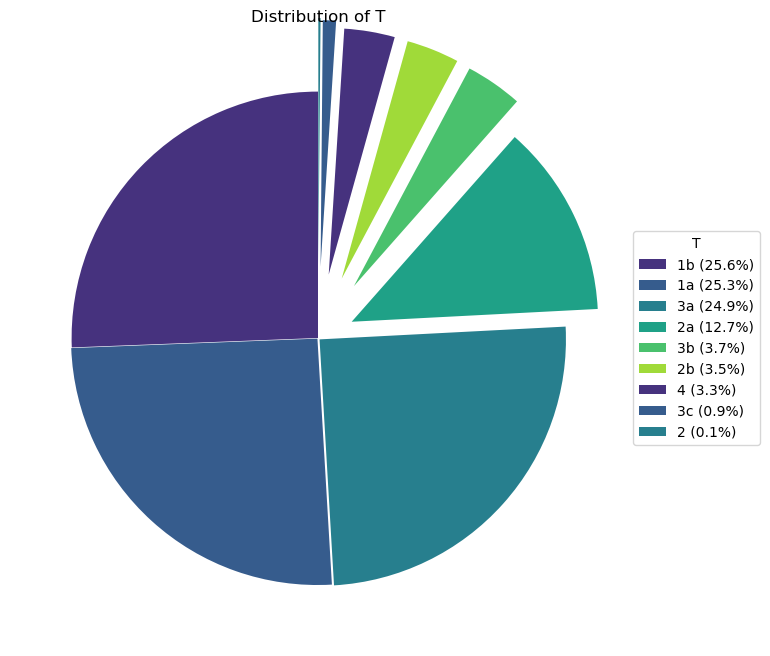

C:\Users\aniru\AppData\Local\Temp\ipykernel_7360\2545943831.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=col, data=data, palette='viridis')


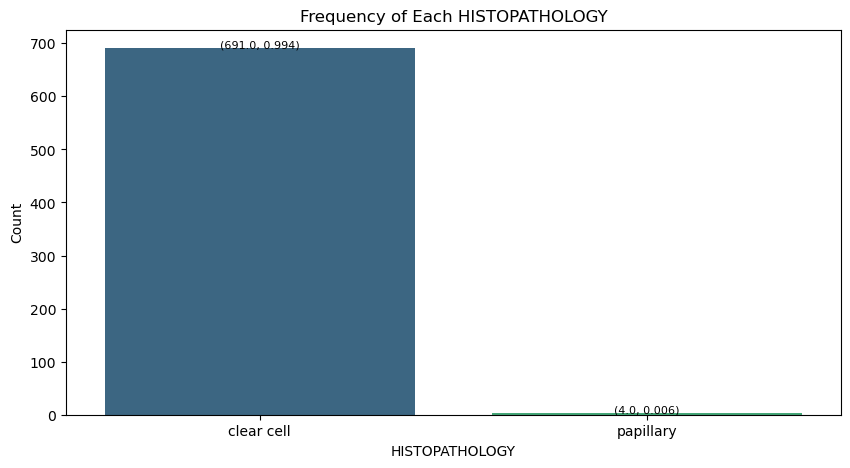

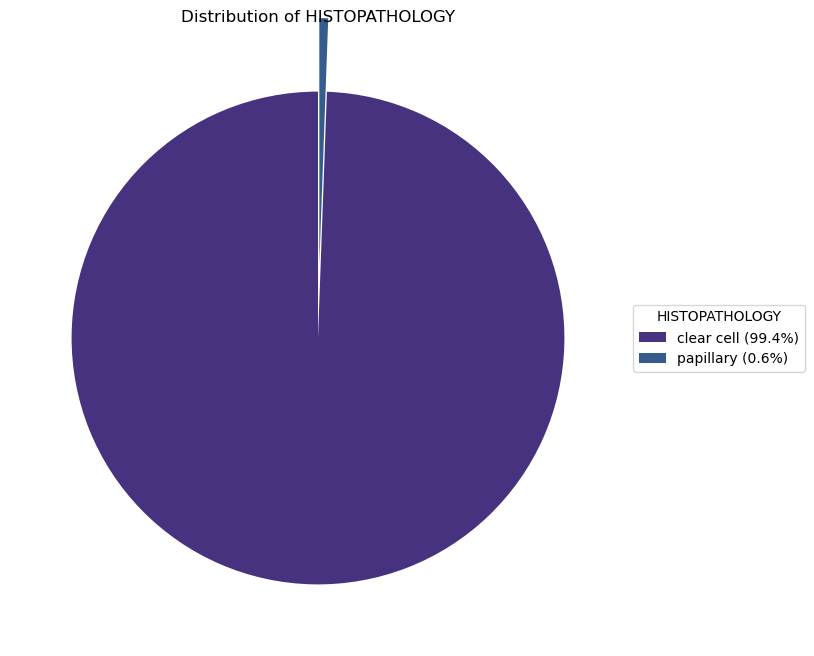

In [14]:
for col in obj_cols:
    bar_plot(col)
#     pie_chart1(col)
    pie_chart_with_inverse_explode(col)

C:\Users\aniru\AppData\Local\Temp\ipykernel_7360\2545943831.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=col, data=data, palette='viridis')


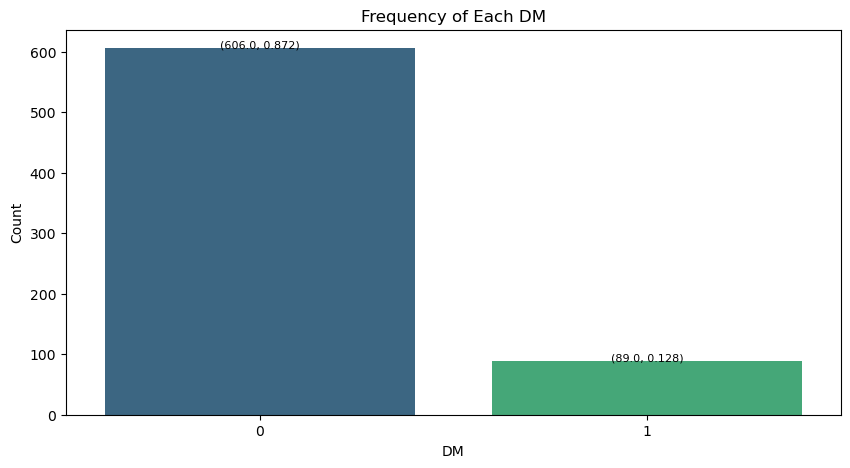

C:\Users\aniru\AppData\Local\Temp\ipykernel_7360\2545943831.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=col, data=data, palette='viridis')


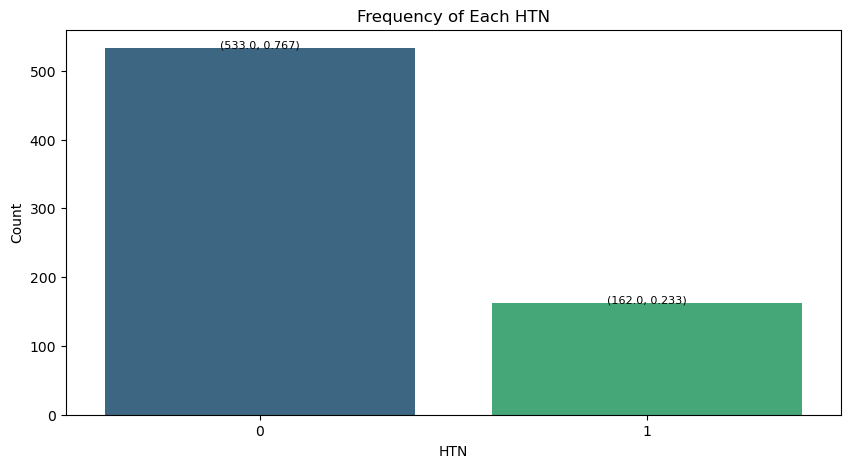

C:\Users\aniru\AppData\Local\Temp\ipykernel_7360\2545943831.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=col, data=data, palette='viridis')


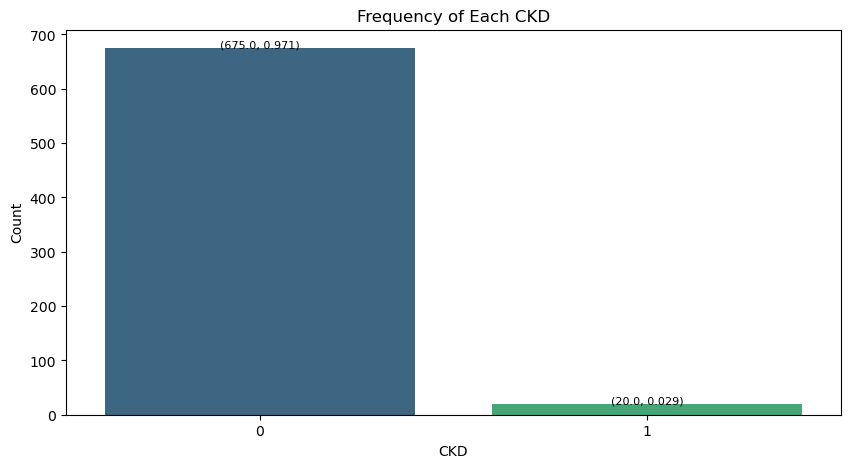

C:\Users\aniru\AppData\Local\Temp\ipykernel_7360\2545943831.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=col, data=data, palette='viridis')


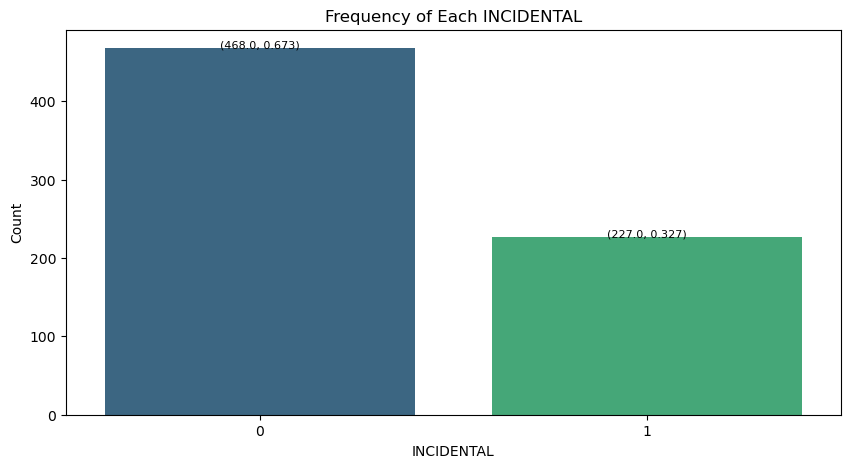

C:\Users\aniru\AppData\Local\Temp\ipykernel_7360\2545943831.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=col, data=data, palette='viridis')


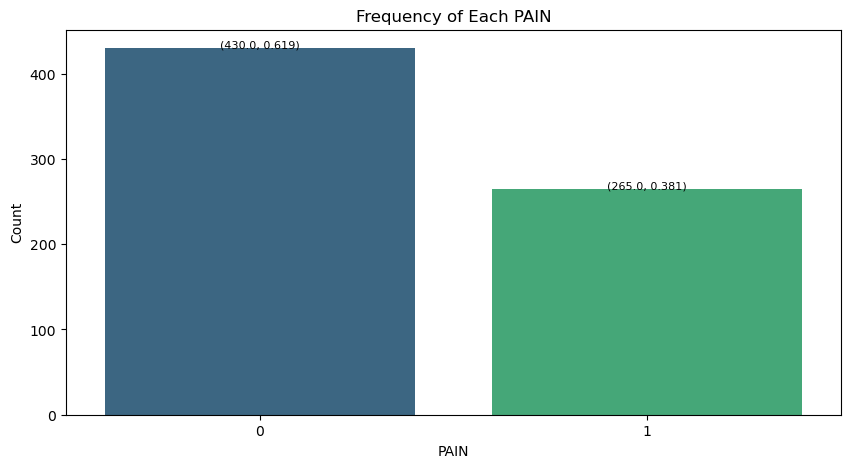

C:\Users\aniru\AppData\Local\Temp\ipykernel_7360\2545943831.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=col, data=data, palette='viridis')


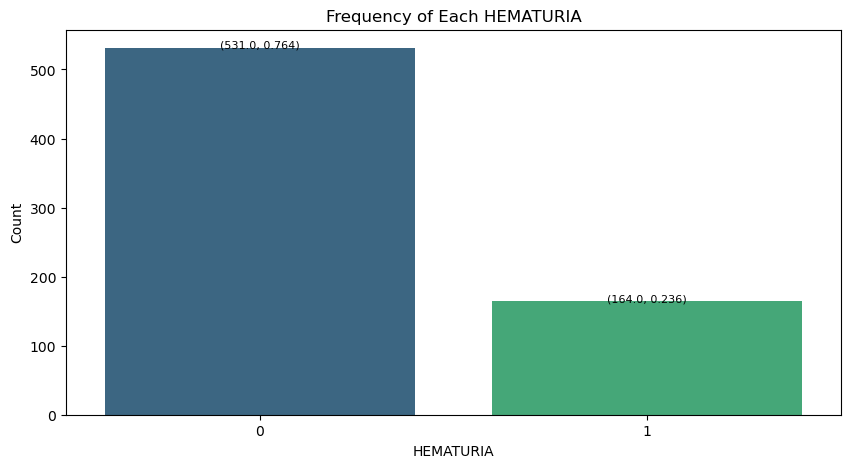

C:\Users\aniru\AppData\Local\Temp\ipykernel_7360\2545943831.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=col, data=data, palette='viridis')


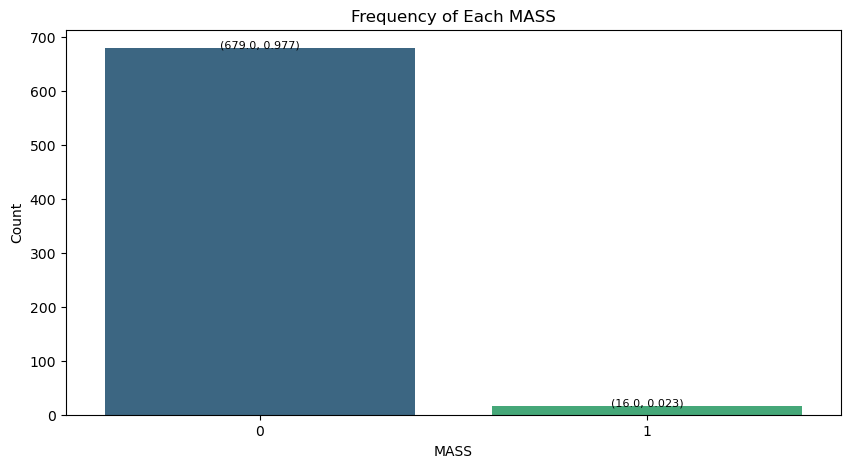

C:\Users\aniru\AppData\Local\Temp\ipykernel_7360\2545943831.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=col, data=data, palette='viridis')


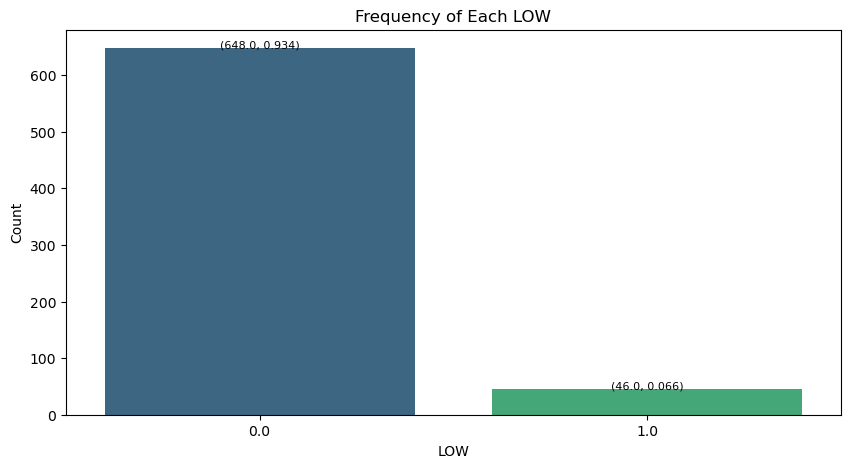

C:\Users\aniru\AppData\Local\Temp\ipykernel_7360\2545943831.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=col, data=data, palette='viridis')


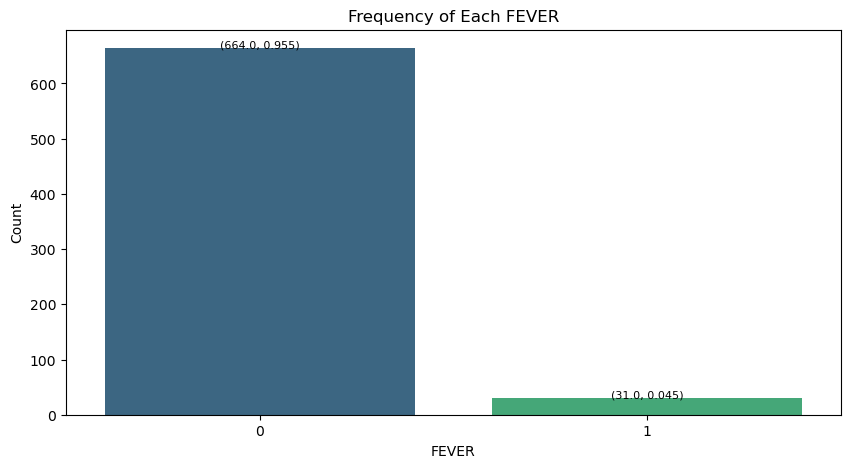

C:\Users\aniru\AppData\Local\Temp\ipykernel_7360\2545943831.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=col, data=data, palette='viridis')


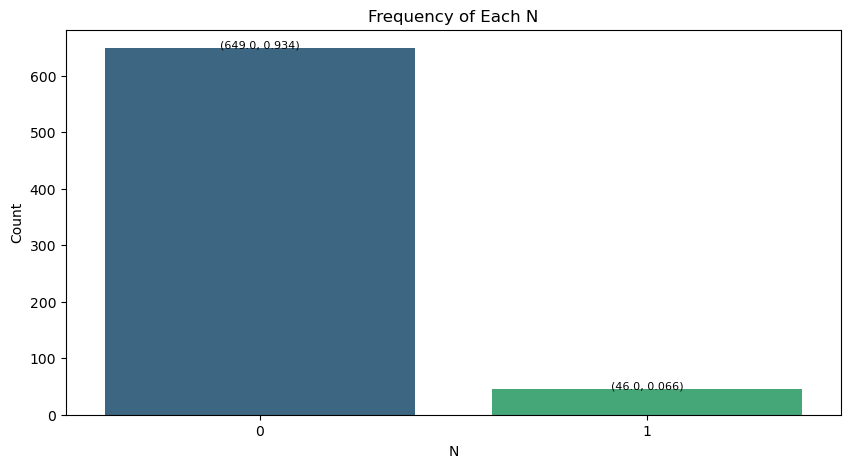

C:\Users\aniru\AppData\Local\Temp\ipykernel_7360\2545943831.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=col, data=data, palette='viridis')


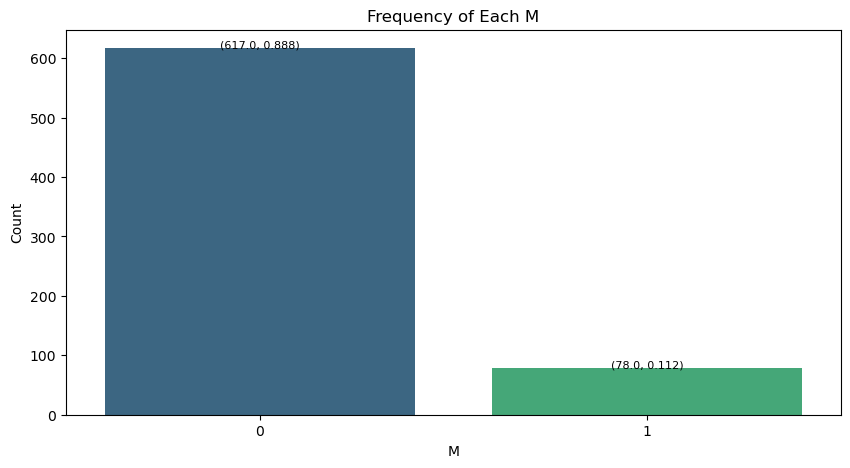

C:\Users\aniru\AppData\Local\Temp\ipykernel_7360\2545943831.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=col, data=data, palette='viridis')


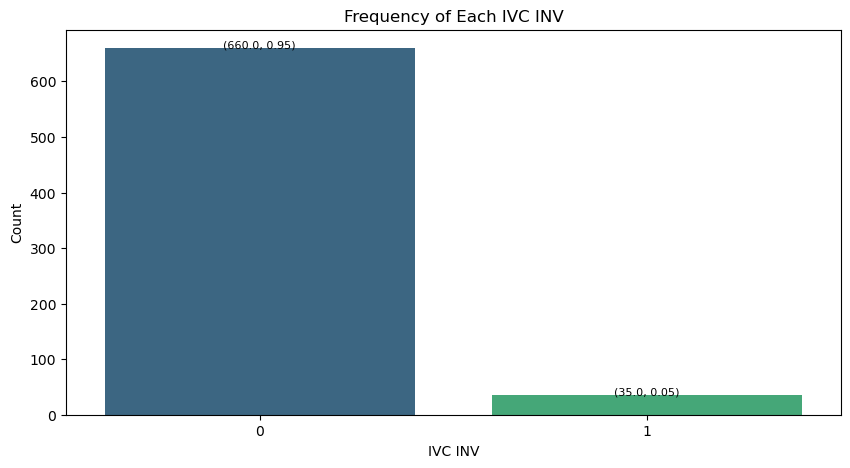

C:\Users\aniru\AppData\Local\Temp\ipykernel_7360\2545943831.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=col, data=data, palette='viridis')


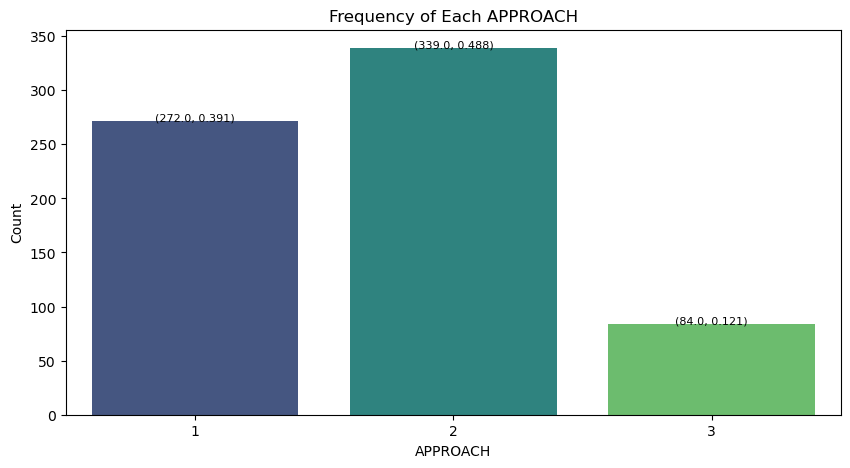

C:\Users\aniru\AppData\Local\Temp\ipykernel_7360\2545943831.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=col, data=data, palette='viridis')


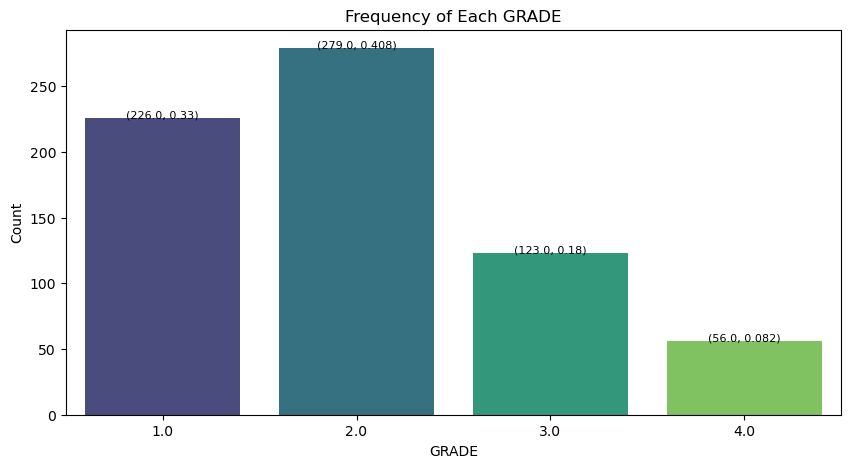

C:\Users\aniru\AppData\Local\Temp\ipykernel_7360\2545943831.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=col, data=data, palette='viridis')


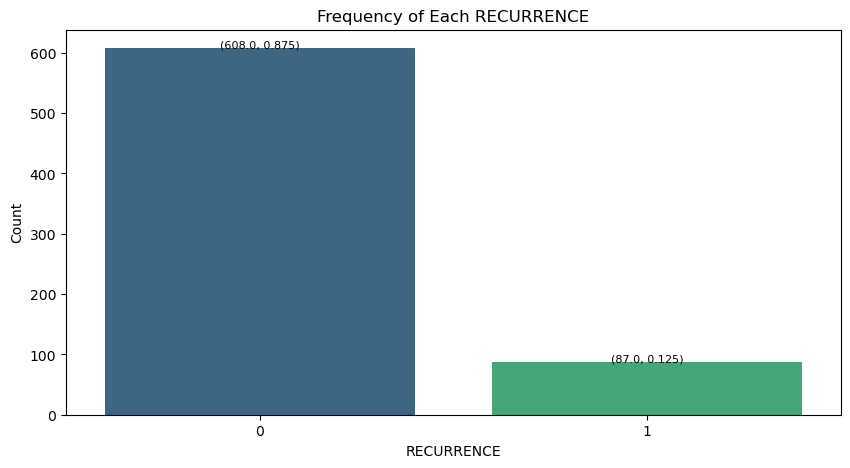

In [15]:
for col in num_cat_cols:
    bar_plot(col)

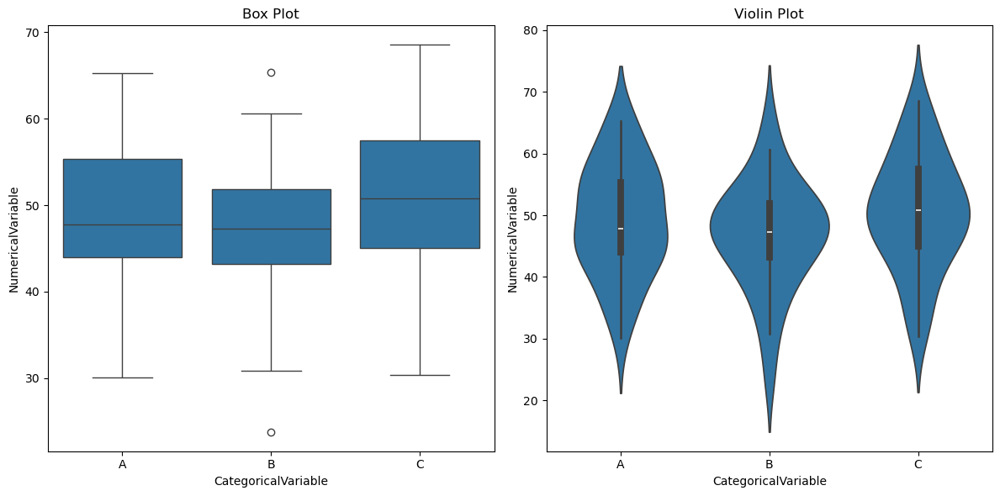

In [16]:
# Create a toy dataset
np.random.seed(42)

# Numerical variable
numerical_data = np.random.normal(loc=50, scale=10, size=100)

# Categorical variable
categories = np.random.choice(['A', 'B', 'C'], size=100)

# Combine into a DataFrame
toy_data = pd.DataFrame({'NumericalVariable': numerical_data, 'CategoricalVariable': categories})

# Create a box plot
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.boxplot(x='CategoricalVariable', y='NumericalVariable', data=toy_data)
plt.title('Box Plot')

# Create a violin plot
plt.subplot(1, 2, 2)
sns.violinplot(x='CategoricalVariable', y='NumericalVariable', data=toy_data)
plt.title('Violin Plot')

# Show the plots
plt.tight_layout()
plt.show()

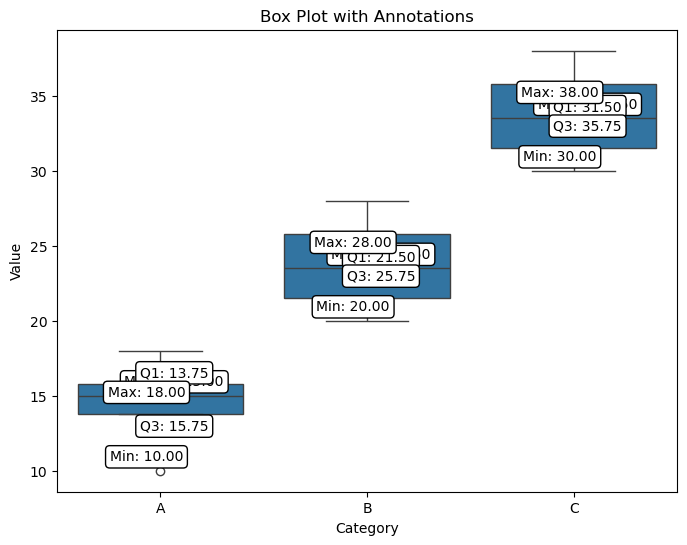

In [17]:
# Create a sample dataset
toy_data = {
    'Category': ['A', 'A', 'B', 'B', 'C', 'C', 'A', 'B', 'C', 'A', 'B', 'C'],
    'Value': [10, 15, 20, 25, 30, 35, 15, 22, 32, 18, 28, 38]
}

df = pd.DataFrame(toy_data)

# Create a box plot for the categorical variable 'Category' and numerical variable 'Value'
plt.figure(figsize=(8, 6))
sns.boxplot(x='Category', y='Value', data=df)

# Annotate the box plot with numerical values
for category in df['Category'].unique():
    subset = df[df['Category'] == category]
    median = subset['Value'].median()
    q1 = subset['Value'].quantile(0.25)
    q3 = subset['Value'].quantile(0.75)
    minimum = subset['Value'].min()
    maximum = subset['Value'].max()

    # Convert category to numerical position
    x_pos = df['Category'].unique().tolist().index(category)

    plt.annotate(f'Median: {median:.2f}', xy=(x_pos, median), xytext=(10, 10),
                 textcoords='offset points', ha='center', va='center', bbox=dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='white'))

    plt.annotate(f'Q1: {q1:.2f}', xy=(x_pos, q1), xytext=(10, 30),
                 textcoords='offset points', ha='center', va='center', bbox=dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='white'))

    plt.annotate(f'Q3: {q3:.2f}', xy=(x_pos, q3), xytext=(10, -30),
                 textcoords='offset points', ha='center', va='center', bbox=dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='white'))

    plt.annotate(f'Min: {minimum:.2f}', xy=(x_pos, minimum), xytext=(-10, 10),
                 textcoords='offset points', ha='center', va='center', bbox=dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='white'))

    plt.annotate(f'Max: {maximum:.2f}', xy=(x_pos, maximum), xytext=(-10, -30),
                 textcoords='offset points', ha='center', va='center', bbox=dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='white'))

plt.title('Box Plot with Annotations')
plt.show()

  Category  Median     Q1     Q3 Min Max Outliers
0        A    16.5  15.00  42.00  10  70       []
1        B    26.5  22.75  48.25  20  75       []
2        C    36.5  32.75  54.50  30  80       []


C:\Users\aniru\AppData\Local\Temp\ipykernel_7360\3929808456.py:36: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  annotation_table = pd.concat([annotation_table, pd.DataFrame({


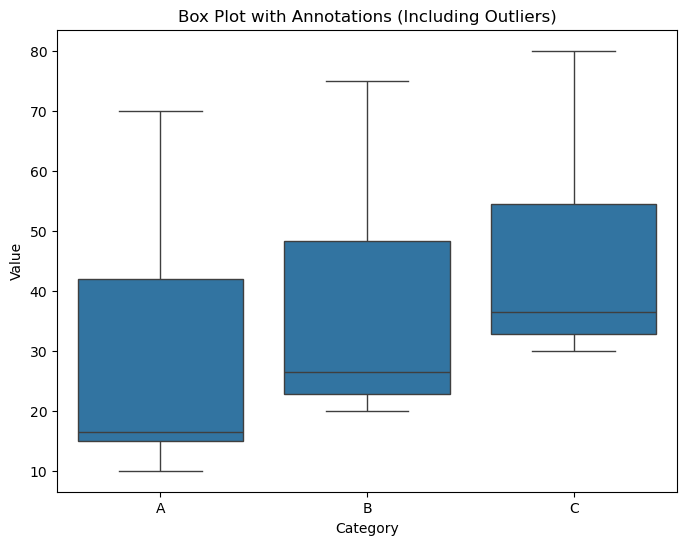

In [18]:
# Create a sample dataset
toy_data = {
    'Category': ['A', 'A', 'B', 'B', 'C', 'C', 'A', 'B', 'C', 'A', 'B', 'C', 'A', 'B', 'C', 'A', 'B', 'C'],
    'Value': [10, 15, 20, 25, 30, 35, 15, 22, 32, 18, 28, 38, 50, 55, 60, 70, 75, 80]
}

df = pd.DataFrame(toy_data)

# Create a box plot for the categorical variable 'Category' and numerical variable 'Value'
plt.figure(figsize=(8, 6))

# Get numerical positions for each category
category_positions = {category: i for i, category in enumerate(df['Category'].unique())}

sns.boxplot(x='Category', y='Value', data=df)

# Create a table for annotations
annotation_table = pd.DataFrame(columns=['Category', 'Median', 'Q1', 'Q3', 'Min', 'Max', 'Outliers'])

# Annotate the box plot with numerical values and outliers, and update the table
for category in df['Category'].unique():
    subset = df[df['Category'] == category]
    median = subset['Value'].median()
    q1 = subset['Value'].quantile(0.25)
    q3 = subset['Value'].quantile(0.75)
    minimum = subset['Value'].min()
    maximum = subset['Value'].max()

    # Identify outliers using 1.5*IQR criterion
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers = subset[(subset['Value'] < lower_bound) | (subset['Value'] > upper_bound)]['Value'].tolist()

    # Add data to the table
    annotation_table = pd.concat([annotation_table, pd.DataFrame({
        'Category': [category],
        'Median': [median],
        'Q1': [q1],
        'Q3': [q3],
        'Min': [minimum],
        'Max': [maximum],
        'Outliers': [outliers]
    })], ignore_index=True)

    # # Create a temporary dataframe for each category
    # temp_df = pd.DataFrame({
    #     'Category': [category],
    #     'Median': [median],
    #     'Q1': [q1],
    #     'Q3': [q3],
    #     'Min': [minimum],
    #     'Max': [maximum],
    #     'Outliers': [outliers]
    # })

    # # Concatenate the temporary dataframe with the existing annotation_table
    # annotation_table = pd.concat([annotation_table, temp_df], ignore_index=True)

    # Annotate outliers on the plot
    for outlier in outliers:
        plt.annotate(f'Outlier: {outlier:.2f}', xy=(category_positions[category], outlier), xytext=(-10, 10),
                     textcoords='offset points', ha='center', va='center', color='red',
                     bbox=dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='white'))

# Display the table
print(annotation_table)

plt.title('Box Plot with Annotations (Including Outliers)')
plt.show()

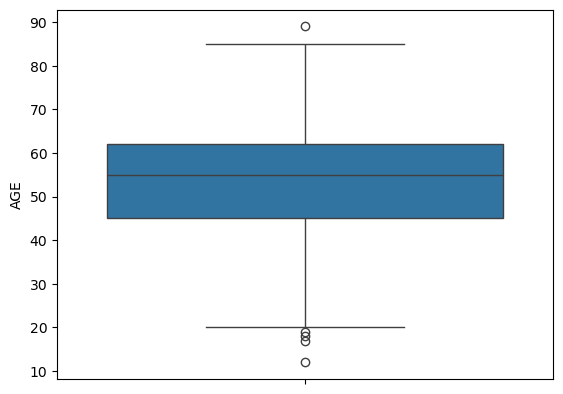

In [19]:
sns.boxplot(y = 'AGE', data = data)
plt.show()

C:\Users\aniru\AppData\Local\Temp\ipykernel_7360\3208525384.py:35: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  annotation_table = pd.concat([annotation_table, pd.DataFrame({


  RECURRENCE Count       Mean        Std  Median    Q1    Q3 Min Max  Outliers
0          0   608  53.860197  13.214310    55.0  45.0  63.0  12  89  [12, 17]
1          1    87  55.655172   9.947335    55.0  49.5  60.0  26  78  [26, 78]


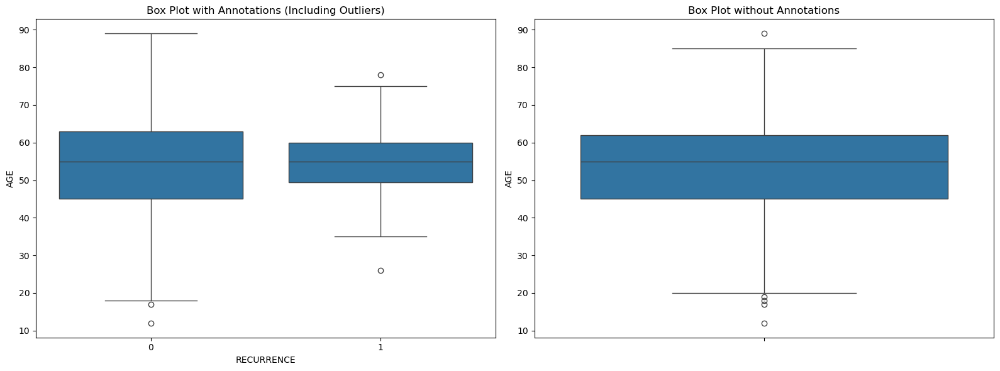

  Statistic         AGE
0     count  695.000000
1      mean   54.084892
2       std   12.858574
3       min   12.000000
4       25%   45.000000
5       50%   55.000000
6       75%   62.000000
7       max   89.000000


In [20]:
# Create a box plot for the categorical variable 'Category' and numerical variable 'Value'
plt.figure(figsize=(16, 6))

# Subplot 1: Box plot with annotations
plt.subplot(1, 2, 1)

# Get numerical positions for each category
category_positions = {category: i for i, category in enumerate(data['RECURRENCE'].unique())}

sns.boxplot(x='RECURRENCE', y='AGE', data=data)

# Create a table for annotations
annotation_table = pd.DataFrame(columns=['RECURRENCE', 'Count', 'Mean', 'Std', 'Median', 'Q1', 'Q3', 'Min', 'Max', 'Outliers'])

# Annotate the box plot with numerical values and outliers, and update the table
for category in data['RECURRENCE'].unique():
    subset = data[data['RECURRENCE'] == category]
    count = subset['AGE'].count()
    mean = subset['AGE'].mean()
    std = subset['AGE'].std()
    median = subset['AGE'].median()
    q1 = subset['AGE'].quantile(0.25)
    q3 = subset['AGE'].quantile(0.75)
    minimum = subset['AGE'].min()
    maximum = subset['AGE'].max()

    # Identify outliers using 1.5*IQR criterion
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers = subset[(subset['AGE'] < lower_bound) | (subset['AGE'] > upper_bound)]['AGE'].tolist()
    outliers.sort()

    # Add data to the table
    annotation_table = pd.concat([annotation_table, pd.DataFrame({
        'RECURRENCE': [category],
        'Count': [count],
        'Mean': [mean],
        'Std': [std],
        'Median': [median],
        'Q1': [q1],
        'Q3': [q3],
        'Min': [minimum],
        'Max': [maximum],
        'Outliers': [outliers]
    })], ignore_index=True)

    # Annotate outliers on the plot
#     for outlier in outliers:
#         plt.annotate(f'Outlier: {outlier:.2f}', xy=(category_positions[category], outlier), xytext=(-10, 10),
#                      textcoords='offset points', ha='center', va='center', color='red',
#                      bbox=dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='white'))

# Display the table
print(annotation_table)

plt.title('Box Plot with Annotations (Including Outliers)')

# Subplot 2: Box plot for comparison
plt.subplot(1, 2, 2)
sns.boxplot(y='AGE', data=data)
plt.title('Box Plot without Annotations')

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()

# Table for 'AGE' variable without 'RECURRENCE'
age_table = data['AGE'].describe().reset_index().rename(columns={'index': 'Statistic'})
print(age_table)
# age_table = data['AGE'].describe().reset_index().rename(columns={'index': 'Statistic'}).T
# outliers = data[(data['AGE'] < lower_bound) | (data['AGE'] > upper_bound)]['AGE'].tolist()
# age_table['Outliers'] = ', '.join(map(str, outliers))
# print(age_table)

C:\Users\aniru\AppData\Local\Temp\ipykernel_7360\2131982510.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  annotation_table = pd.concat([annotation_table, pd.DataFrame({


,RECURRENCE,Count,Mean,Std,Median,Q1,Q3,Min,Max,Outliers
0,0,608,6.512336,3.263739,6.0,4.0,8.2,0.8,29.0,"[15.0, 15.0, 15.0, 15.0, 15.0, 16.0, 17.0, 17.0, 19.0, 29.0]"
1,1,87,7.742529,3.699486,7.0,5.0,10.0,2.0,19.0,"[18.2, 19.0]"


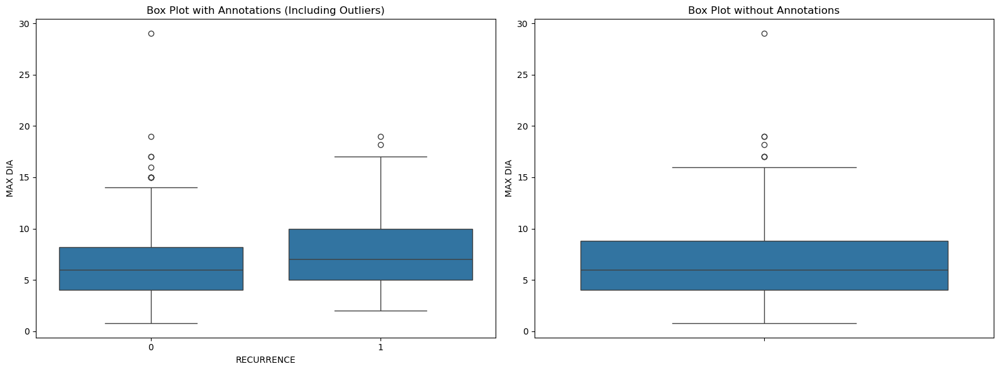

  Statistic     MAX DIA
0     count  695.000000
1      mean    6.666331
2       std    3.343442
3       min    0.800000
4       25%    4.000000
5       50%    6.000000
6       75%    8.800000
7       max   29.000000


In [21]:
# Create a box plot for the categorical variable 'Category' and numerical variable 'Value'
plt.figure(figsize=(16, 6))

# Set pandas display options to show more content in each cell
pd.set_option('display.max_colwidth', None)

# Subplot 1: Box plot with annotations
plt.subplot(1, 2, 1)

# Get numerical positions for each category
category_positions = {category: i for i, category in enumerate(data['RECURRENCE'].unique())}

sns.boxplot(x='RECURRENCE', y='MAX DIA', data=data)

# Create a table for annotations
annotation_table = pd.DataFrame(columns=['RECURRENCE', 'Count', 'Mean', 'Std', 'Median', 'Q1', 'Q3', 'Min', 'Max', 'Outliers'])

# Annotate the box plot with numerical values and outliers, and update the table
for category in data['RECURRENCE'].unique():
    subset = data[data['RECURRENCE'] == category]
    count = subset['MAX DIA'].count()
    mean = subset['MAX DIA'].mean()
    std = subset['MAX DIA'].std()
    median = subset['MAX DIA'].median()
    q1 = subset['MAX DIA'].quantile(0.25)
    q3 = subset['MAX DIA'].quantile(0.75)
    minimum = subset['MAX DIA'].min()
    maximum = subset['MAX DIA'].max()

    # Identify outliers using 1.5*IQR criterion
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers = subset[(subset['MAX DIA'] < lower_bound) | (subset['MAX DIA'] > upper_bound)]['MAX DIA'].tolist()
    outliers.sort()

    # Add data to the table
    annotation_table = pd.concat([annotation_table, pd.DataFrame({
        'RECURRENCE': [category],
        'Count': [count],
        'Mean': [mean],
        'Std': [std],
        'Median': [median],
        'Q1': [q1],
        'Q3': [q3],
        'Min': [minimum],
        'Max': [maximum],
        'Outliers': [outliers]
    })], ignore_index=True)

    # Annotate outliers on the plot
#     for outlier in outliers:
#         plt.annotate(f'Outlier: {outlier:.2f}', xy=(category_positions[category], outlier), xytext=(-10, 10),
#                      textcoords='offset points', ha='center', va='center', color='red',
#                      bbox=dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='white'))

# Display the table
display(annotation_table)

plt.title('Box Plot with Annotations (Including Outliers)')

# Subplot 2: Box plot for comparison
plt.subplot(1, 2, 2)
sns.boxplot(y='MAX DIA', data=data)
plt.title('Box Plot without Annotations')

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()

# Table for 'MAX DIA' variable without 'RECURRENCE'
age_table = data['MAX DIA'].describe().reset_index().rename(columns={'index': 'Statistic'})
print(age_table)

C:\Users\aniru\AppData\Local\Temp\ipykernel_7360\2125889981.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  annotation_table = pd.concat([annotation_table, pd.DataFrame({


,RECURRENCE,Count,Mean,Std,Median,Q1,Q3,Min,Max,Outliers
0,0,608,52.506579,21.156745,52.0,34.0,68.0,18,95,[]
1,1,87,53.724138,16.369064,51.0,42.0,65.0,30,95,[]


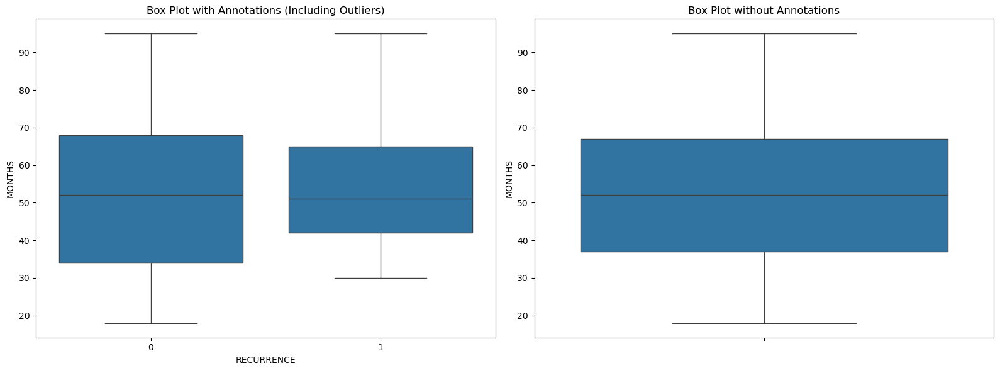

  Statistic      MONTHS
0     count  695.000000
1      mean   52.658993
2       std   20.612179
3       min   18.000000
4       25%   37.000000
5       50%   52.000000
6       75%   67.000000
7       max   95.000000


In [22]:
# Create a box plot for the categorical variable 'Category' and numerical variable 'Value'
plt.figure(figsize=(16, 6))

# Set pandas display options to show more content in each cell
pd.set_option('display.max_colwidth', None)

# Subplot 1: Box plot with annotations
plt.subplot(1, 2, 1)

# Get numerical positions for each category
category_positions = {category: i for i, category in enumerate(data['RECURRENCE'].unique())}

sns.boxplot(x='RECURRENCE', y='MONTHS', data=data)

# Create a table for annotations
annotation_table = pd.DataFrame(columns=['RECURRENCE', 'Count', 'Mean', 'Std', 'Median', 'Q1', 'Q3', 'Min', 'Max', 'Outliers'])

# Annotate the box plot with numerical values and outliers, and update the table
for category in data['RECURRENCE'].unique():
    subset = data[data['RECURRENCE'] == category]
    count = subset['MONTHS'].count()
    mean = subset['MONTHS'].mean()
    std = subset['MONTHS'].std()
    median = subset['MONTHS'].median()
    q1 = subset['MONTHS'].quantile(0.25)
    q3 = subset['MONTHS'].quantile(0.75)
    minimum = subset['MONTHS'].min()
    maximum = subset['MONTHS'].max()

    # Identify outliers using 1.5*IQR criterion
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers = subset[(subset['MONTHS'] < lower_bound) | (subset['MONTHS'] > upper_bound)]['MONTHS'].tolist()
    outliers.sort()

    # Add data to the table
    annotation_table = pd.concat([annotation_table, pd.DataFrame({
        'RECURRENCE': [category],
        'Count': [count],
        'Mean': [mean],
        'Std': [std],
        'Median': [median],
        'Q1': [q1],
        'Q3': [q3],
        'Min': [minimum],
        'Max': [maximum],
        'Outliers': [outliers]
    })], ignore_index=True)

    # Annotate outliers on the plot
#     for outlier in outliers:
#         plt.annotate(f'Outlier: {outlier:.2f}', xy=(category_positions[category], outlier), xytext=(-10, 10),
#                      textcoords='offset points', ha='center', va='center', color='red',
#                      bbox=dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='white'))

# Display the table
display(annotation_table)

plt.title('Box Plot with Annotations (Including Outliers)')

# Subplot 2: Box plot for comparison
plt.subplot(1, 2, 2)
sns.boxplot(y='MONTHS', data=data)
plt.title('Box Plot without Annotations')

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()

# Table for 'MONTHS' variable without 'RECURRENCE'
age_table = data['MONTHS'].describe().reset_index().rename(columns={'index': 'Statistic'})
print(age_table)

In [23]:
# Set pandas display options to show more content in each cell
pd.reset_option('display.max_colwidth')

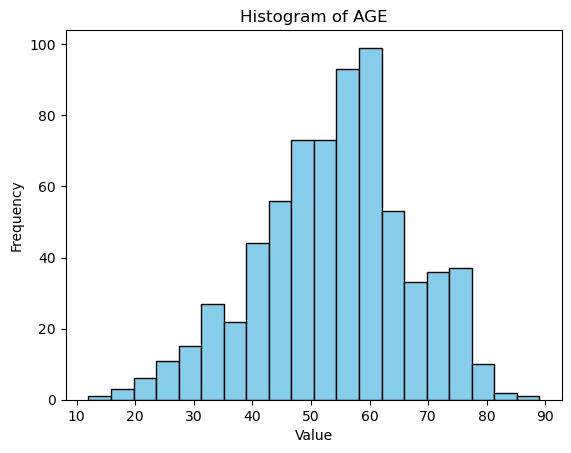

In [24]:
# Create a histogram
plt.hist(data['AGE'], bins=20, color='skyblue', edgecolor='black')
# sns.kdeplot(data['AGE'], fill=True, color='skyblue')

# Add labels and title
plt.title('Histogram of AGE')
plt.xlabel('Value')
plt.ylabel('Frequency')

# Show the plot
plt.show()

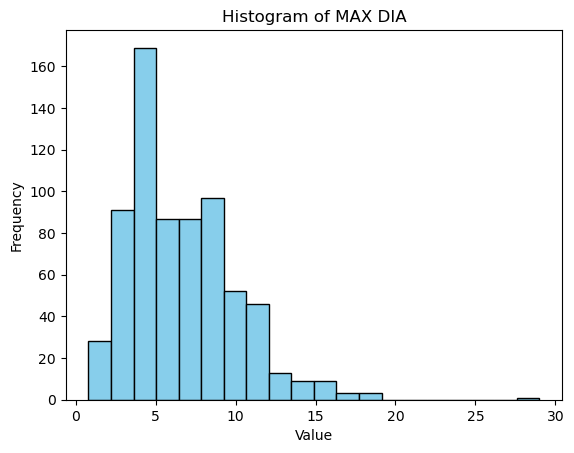

In [25]:
# Create a histogram
plt.hist(data['MAX DIA'], bins=20, color='skyblue', edgecolor='black')
# sns.kdeplot(data['AGE'], fill=True, color='skyblue')

# Add labels and title
plt.title('Histogram of MAX DIA')
plt.xlabel('Value')
plt.ylabel('Frequency')

# Show the plot
plt.show()

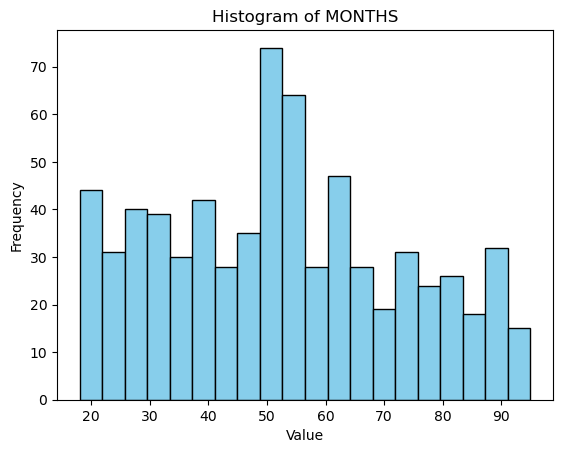

In [26]:
# Create a histogram
plt.hist(data['MONTHS'], bins=20, color='skyblue', edgecolor='black')
# sns.kdeplot(data['AGE'], fill=True, color='skyblue')

# Add labels and title
plt.title('Histogram of MONTHS')
plt.xlabel('Value')
plt.ylabel('Frequency')

# Show the plot
plt.show()

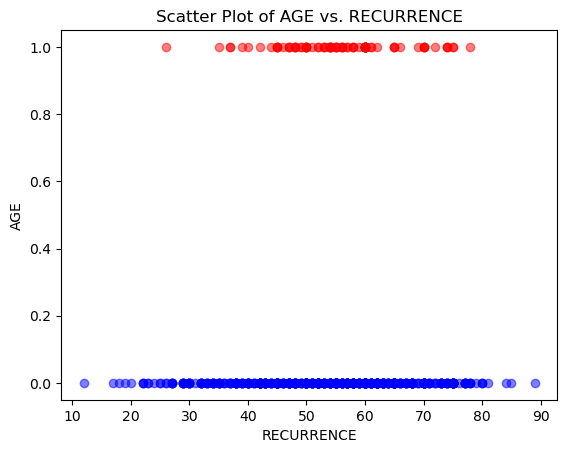

In [27]:
# Separate data based on the binary variable
REC_0 = data[data['RECURRENCE'] == 0]
REC_1 = data[data['RECURRENCE'] == 1]

# Create a scatter plot with different colors for 0-markers and 1-markers
plt.scatter(REC_0['AGE'], REC_0['RECURRENCE'], alpha=0.5, color='blue', label='RECURRENCE = 0')
plt.scatter(REC_1['AGE'], REC_1['RECURRENCE'], alpha=0.5, color='red', label='RECURRENCE = 1')

# Add labels and title
plt.title('Scatter Plot of AGE vs. RECURRENCE')
plt.xlabel('RECURRENCE')
plt.ylabel('AGE')

# Show the plot
plt.show()

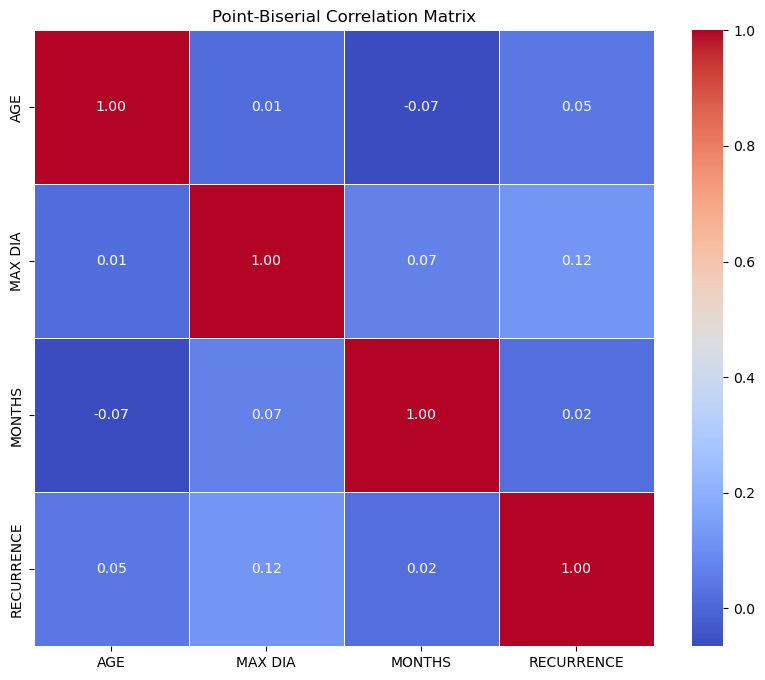

RECURRENCE    1.000000
MAX DIA       0.121848
AGE           0.046228
MONTHS        0.019562
Name: RECURRENCE, dtype: float64


In [28]:
# Assuming df is your DataFrame and 'target' is the binary target column
temp_df = data[num_cont_cols + ['RECURRENCE']]
correlation_matrix = temp_df.corr(method='pearson')
correlation_with_target = correlation_matrix['RECURRENCE'].sort_values(ascending=False)

# Plotting a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=True, fmt=".2f", linewidths=0.5)
plt.title('Point-Biserial Correlation Matrix')
plt.show()

# Display correlation with the target
print(correlation_with_target)

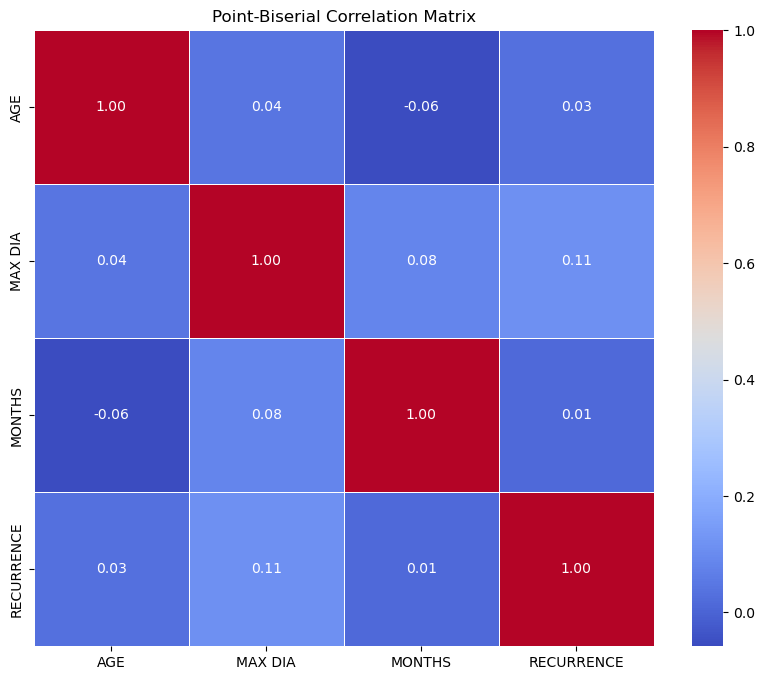

RECURRENCE    1.000000
MAX DIA       0.114908
AGE           0.032286
MONTHS        0.014089
Name: RECURRENCE, dtype: float64


In [29]:
# Assuming df is your DataFrame and 'target' is the binary target column
temp_df = data[num_cont_cols + ['RECURRENCE']]
correlation_matrix = temp_df.corr(method='spearman')
correlation_with_target = correlation_matrix['RECURRENCE'].sort_values(ascending=False)

# Plotting a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=True, fmt=".2f", linewidths=0.5)
plt.title('Point-Biserial Correlation Matrix')
plt.show()

# Display correlation with the target
print(correlation_with_target)

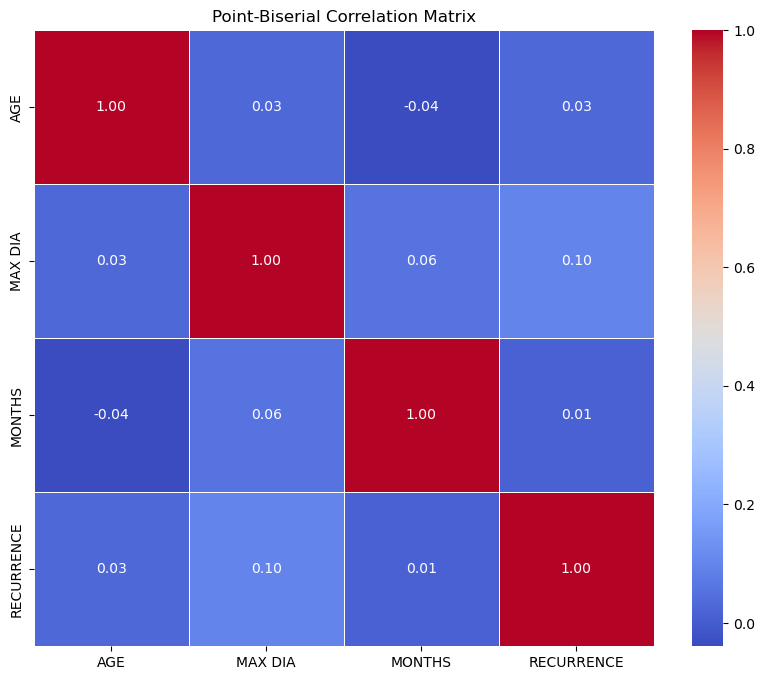

RECURRENCE    1.000000
MAX DIA       0.095668
AGE           0.026724
MONTHS        0.011597
Name: RECURRENCE, dtype: float64


In [30]:
# Assuming df is your DataFrame and 'target' is the binary target column
temp_df = data[num_cont_cols + ['RECURRENCE']]
correlation_matrix = temp_df.corr(method='kendall')
correlation_with_target = correlation_matrix['RECURRENCE'].sort_values(ascending=False)

# Plotting a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=True, fmt=".2f", linewidths=0.5)
plt.title('Point-Biserial Correlation Matrix')
plt.show()

# Display correlation with the target
print(correlation_with_target)

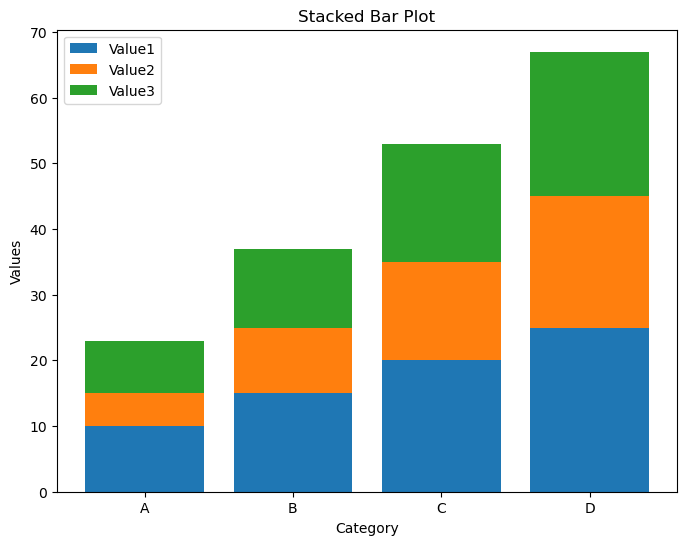

In [31]:
# Create a DataFrame (replace this with your actual data)
toy_data = pd.DataFrame({
    'Category': ['A', 'B', 'C', 'D'],
    'Value1': [10, 15, 20, 25],
    'Value2': [5, 10, 15, 20],
    'Value3': [8, 12, 18, 22]
})

# Set the figure size
plt.figure(figsize=(8, 6))

# Create stacked bar plot
plt.bar(toy_data['Category'], toy_data['Value1'], label='Value1')
plt.bar(toy_data['Category'], toy_data['Value2'], bottom=toy_data['Value1'], label='Value2')
plt.bar(toy_data['Category'], toy_data['Value3'], bottom=toy_data['Value1'] + toy_data['Value2'], label='Value3')

# Add labels and title
plt.title('Stacked Bar Plot')
plt.xlabel('Category')
plt.ylabel('Values')
plt.legend()

# Show the plot
plt.show()

<Figure size 800x600 with 0 Axes>

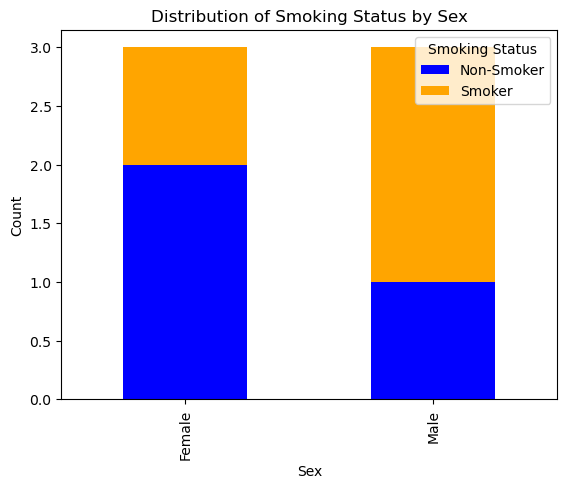

Smoking Status  Non-Smoker  Smoker
Sex                               
Female                   2       1
Male                     1       2


In [32]:
# Create a DataFrame (replace this with your actual data)
health_data = pd.DataFrame({
    'Sex': ['Male', 'Female', 'Male', 'Female', 'Male', 'Female'],
    'Smoking Status': ['Smoker', 'Non-Smoker', 'Non-Smoker', 'Smoker', 'Smoker', 'Non-Smoker']
})

# Set the figure size before creating the plot
plt.figure(figsize=(8, 6))

# Create stacked bar plot
grouped_data = health_data.groupby(['Sex', 'Smoking Status']).size().unstack(fill_value=0)
grouped_data.plot(kind='bar', stacked=True, color=['blue', 'orange'])

# Add labels and title
plt.title('Distribution of Smoking Status by Sex')
plt.xlabel('Sex')
plt.ylabel('Count')
plt.legend(title='Smoking Status')

# Show the plot
plt.show()

# Create a contingency matrix
contingency_matrix = pd.crosstab(health_data['Sex'], health_data['Smoking Status'])

print(contingency_matrix)

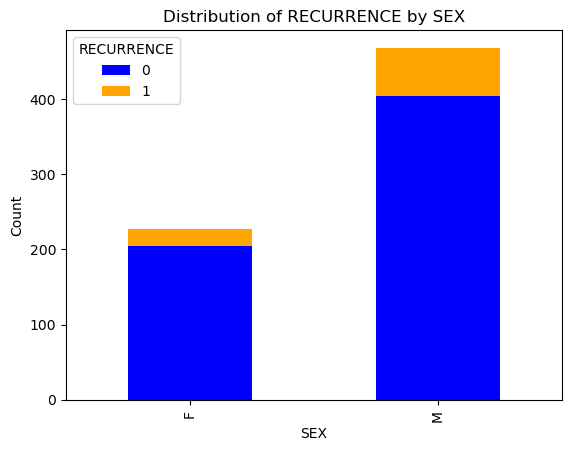

RECURRENCE  0  1
AGE             
12          1  0
17          1  0
18          1  0
19          1  0
20          1  0
..         .. ..
80          3  0
81          1  0
84          1  0
85          1  0
89          1  0

[67 rows x 2 columns]


In [33]:
grouped_data = data.groupby(['SEX', 'RECURRENCE']).size().unstack(fill_value=0)
grouped_data.plot(kind='bar', stacked=True, color=['blue', 'orange'])

# Add labels and title
plt.title('Distribution of RECURRENCE by SEX')
plt.xlabel('SEX')
plt.ylabel('Count')
plt.legend(title='RECURRENCE')

# Show the plot
plt.show()

# Create a contingency matrix
contingency_matrix = pd.crosstab(data['AGE'], data['RECURRENCE'])

print(contingency_matrix)

In [34]:
def data_chi_square_test(cat_col_1, cat_col_2 = 'RECURRENCE'):
    # Create a contingency table
    contingency_table = pd.crosstab(data[cat_col_1], data[cat_col_2])

    # Display the contingency table
    print(contingency_table)

    # Perform the chi-square test
    chi2, p, _, _ = stats.chi2_contingency(contingency_table)

    # Display the results
    print(f"\nChi-Square Statistic: {chi2}")
    print(f"P-value: {p}")

In [35]:
for col in obj_cols:
    data_chi_square_test(col)
    print()

RECURRENCE    0   1
SEX                
F           204  23
M           404  64

Chi-Square Statistic: 1.443620739195524
P-value: 0.22955432366717518

RECURRENCE    0   1
SITE               
b/l           3   1
left        290  34
right       315  52

Chi-Square Statistic: 2.694745155398651
P-value: 0.25992228988500443

RECURRENCE    0   1
T                  
1a          166  10
1b          160  18
2             1   0
2a           80   8
2b           21   3
3a          137  36
3b           21   5
3c            3   3
4            19   4

Chi-Square Statistic: 29.664469532975705
P-value: 0.00024227069643930068

RECURRENCE        0   1
HISTOPATHOLOGY         
clear cell      604  87
papillary         4   0

Chi-Square Statistic: 1.1884035560479189e-06
P-value: 0.9991301949059519



In [36]:
for col in num_cat_cols:
    data_chi_square_test(col)
    print()

RECURRENCE    0   1
DM                 
0           529  77
1            79  10

Chi-Square Statistic: 0.048349808536658864
P-value: 0.8259600186103393

RECURRENCE    0   1
HTN                
0           459  74
1           149  13

Chi-Square Statistic: 3.3778327338703624
P-value: 0.0660788933490444

RECURRENCE    0   1
CKD                
0           591  84
1            17   3

Chi-Square Statistic: 0.0
P-value: 1.0

RECURRENCE    0   1
INCIDENTAL         
0           401  67
1           207  20

Chi-Square Statistic: 3.743281578673961
P-value: 0.05302021946297545

RECURRENCE    0   1
PAIN               
0           370  60
1           238  27

Chi-Square Statistic: 1.7922188764039975
P-value: 0.18065604854582384

RECURRENCE    0   1
HEMATURIA          
0           474  57
1           134  30

Chi-Square Statistic: 5.864444250989486
P-value: 0.01544973580463219

RECURRENCE    0   1
MASS               
0           594  85
1            14   2

Chi-Square Statistic: 0.0
P-value: 1.0



In [37]:
# Calculate correlation for each pair of numerical variables
def correlation_func(dataFrame, method):
    correlation_results = {}
    col_pairs = []
    for col1 in num_cont_cols:
        for col2 in num_cont_cols:
            if col1 != col2:
                if sorted([col1, col2]) not in col_pairs:
                    col_pairs.append([col1, col2])
                    correlation = dataFrame[col1].corr(dataFrame[col2], method = method)
                    correlation_results[f'{col1} vs {col2}'] = correlation

    # Display the results
    for pair, correlation in correlation_results.items():
        print(f'{pair}: {correlation}')

for method in ['pearson', 'spearman', 'kendall']:
    print(f"method = {method}")
    correlation_func(data, method)
    print()

method = pearson
AGE vs MAX DIA: 0.014160112903617813
AGE vs MONTHS: -0.0654609128931886
MAX DIA vs MONTHS: 0.06889810517969931

method = spearman
AGE vs MAX DIA: 0.04397823155147264
AGE vs MONTHS: -0.0582124556106778
MAX DIA vs MONTHS: 0.08446675259396054

method = kendall
AGE vs MAX DIA: 0.029529305928602017
AGE vs MONTHS: -0.03925232619274304
MAX DIA vs MONTHS: 0.057920889152433784



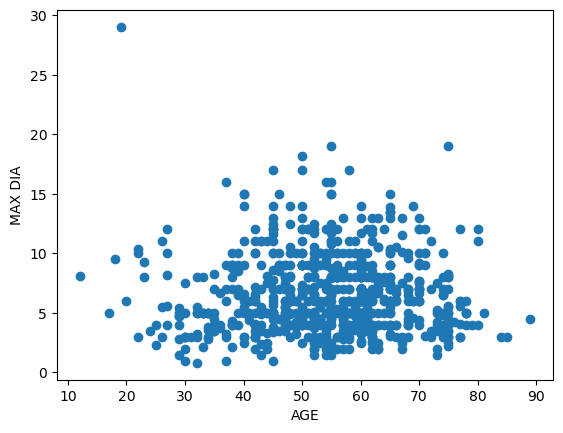

In [38]:
plt.scatter(data['AGE'], data['MAX DIA'])
plt.xlabel('AGE')
plt.ylabel('MAX DIA')
plt.show()

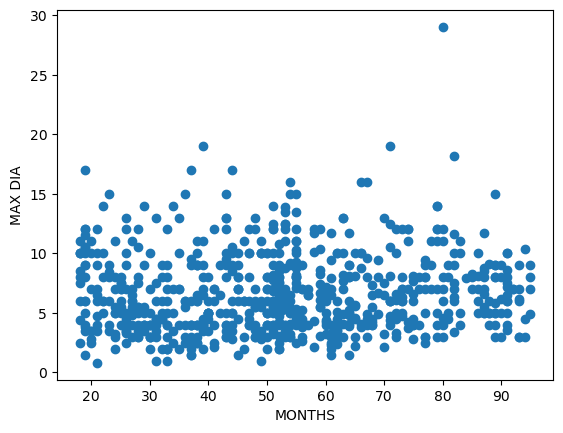

In [39]:
plt.scatter(data['MONTHS'], data['MAX DIA'])
plt.xlabel('MONTHS')
plt.ylabel('MAX DIA')
plt.show()

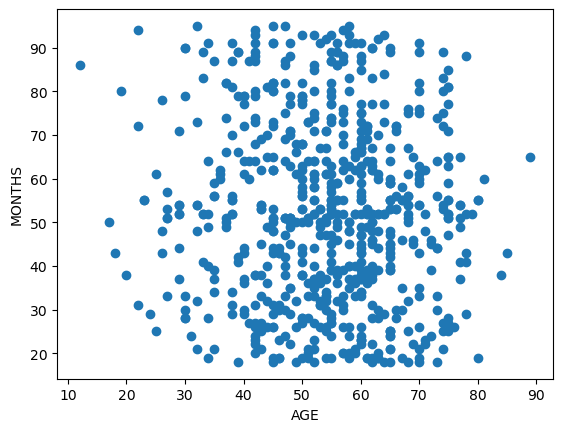

In [40]:
plt.scatter(data['AGE'], data['MONTHS'])
plt.xlabel('AGE')
plt.ylabel('MONTHS')
plt.show()

In [41]:
def pearson_func(var1, var2):
    # Using scipy.stats.pearsonr
    r, p_value = stats.pearsonr(data[var1], data[var2])

    # Print the results
    print(f'Correlation Coefficient for {var1} and {var2}: {r}')
    print(f'P-Value: {p_value}')
    print()

pearson_func('AGE', 'MAX DIA')
pearson_func('AGE', 'MONTHS')
pearson_func('MAX DIA', 'MONTHS')

Correlation Coefficient for AGE and MAX DIA: 0.014160112903617737
P-Value: 0.709410672125959

Correlation Coefficient for AGE and MONTHS: -0.06546091289318853
P-Value: 0.08462123916922115

Correlation Coefficient for MAX DIA and MONTHS: 0.06889810517969906
P-Value: 0.06948726069377295



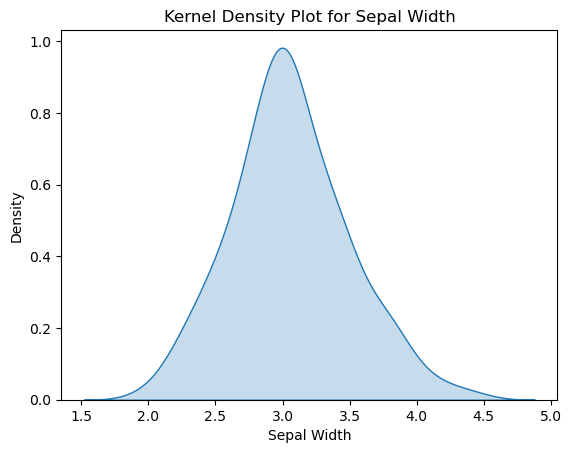

In [47]:
# Generate example data
iris_data = sns.load_dataset("iris")

# Create a kernel density plot for the 'sepal_width' column
sns.kdeplot(data=iris_data['sepal_width'], fill=True)

# Display the plot
plt.title('Kernel Density Plot for Sepal Width')
plt.xlabel('Sepal Width')
plt.ylabel('Density')
plt.show()

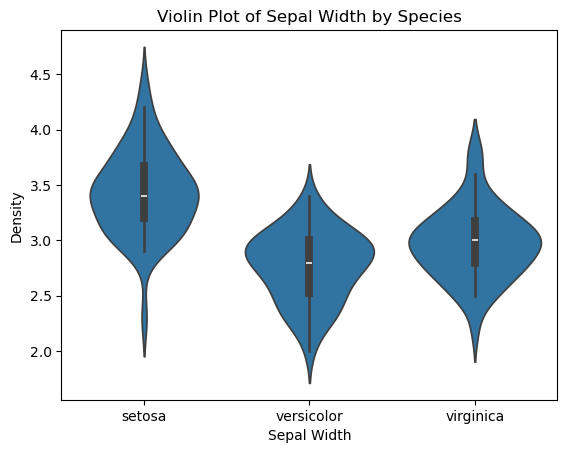

In [48]:
# Generate example data
iris_data = sns.load_dataset("iris")

# Create a violin plot for the 'species' categories and 'sepal_width' variable
sns.violinplot(x='species', y='sepal_width', data=iris_data)

# Display the plot
plt.title('Violin Plot of Sepal Width by Species')
plt.xlabel('Sepal Width')
plt.ylabel('Density')
plt.show()

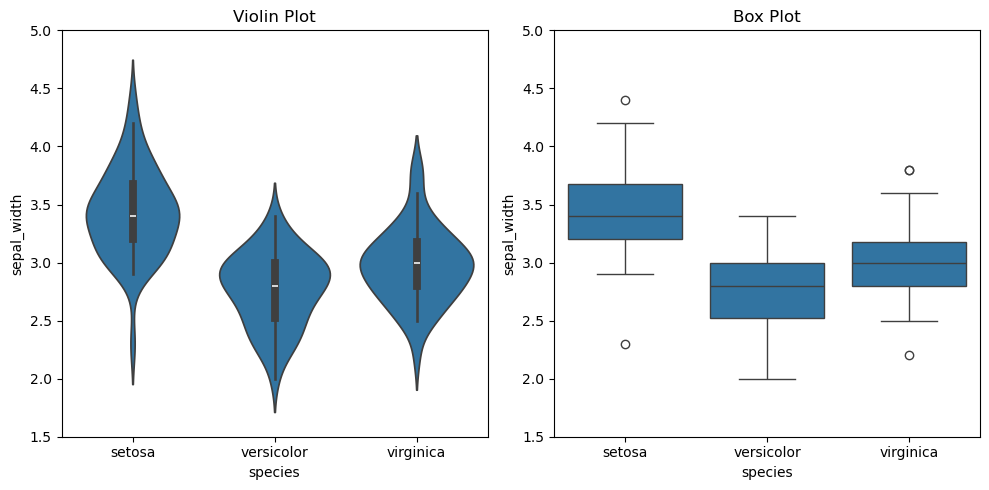

In [49]:
# Load example data
iris_data = sns.load_dataset("iris")

# Set up the figure with two subplots
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

# Violin plot
sns.violinplot(x='species', y='sepal_width', data=iris_data, ax=axes[0])
axes[0].set_title('Violin Plot')
axes[0].set_ylim(1.5, 5)
# xlim_violin, ylim_violin = axes[0].get_xlim(), axes[0].get_ylim()
# print(f'Violin Plot - X-axis limits: {xlim_violin}, Y-axis limits: {ylim_violin}')

# Box plot
sns.boxplot(x='species', y='sepal_width', data=iris_data, ax=axes[1])
axes[1].set_title('Box Plot')
axes[1].set_ylim(1.5, 5)
# xlim_box, ylim_box = axes[1].get_xlim(), axes[1].get_ylim()
# print(f'Box Plot - X-axis limits: {xlim_box}, Y-axis limits: {ylim_box}')

# Adjust layout
plt.tight_layout()
plt.show()

In [50]:
def box_violin_plotter(num, cat):
    # Set up the figure with two subplots
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

    # Violin plot
    sns.violinplot(x=cat, y=num, data=data, ax=axes[0], order = sorted(data[col].unique()))
    axes[0].set_title(f'Violin Plot of {num} by {cat}')
    # axes[0].set_ylim(1.5, 5)
    # xlim_violin, ylim_violin = axes[0].get_xlim(), axes[0].get_ylim()
    # print(f'Violin Plot - X-axis limits: {xlim_violin}, Y-axis limits: {ylim_violin}')

    # Box plot
    sns.boxplot(x=cat, y=num, data=data, ax=axes[1], order = sorted(data[col].unique()))
    axes[1].set_title(f'Box Plot of {num} by {cat}')
    
    bottom_value, top_value = axes[0].get_ylim()  # Get ylim from the first subplot
    axes[1].set_ylim(bottom_value, top_value)  # Set ylim for the second subplot

    # xlim_box, ylim_box = axes[1].get_xlim(), axes[1].get_ylim()
    # print(f'Box Plot - X-axis limits: {xlim_box}, Y-axis limits: {ylim_box}')

    # Adjust layout
    plt.tight_layout()
    plt.show()

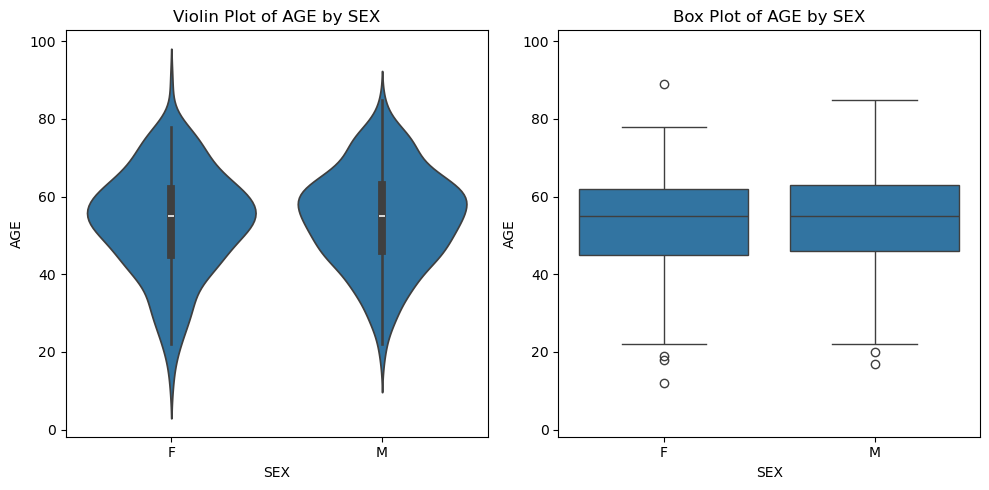

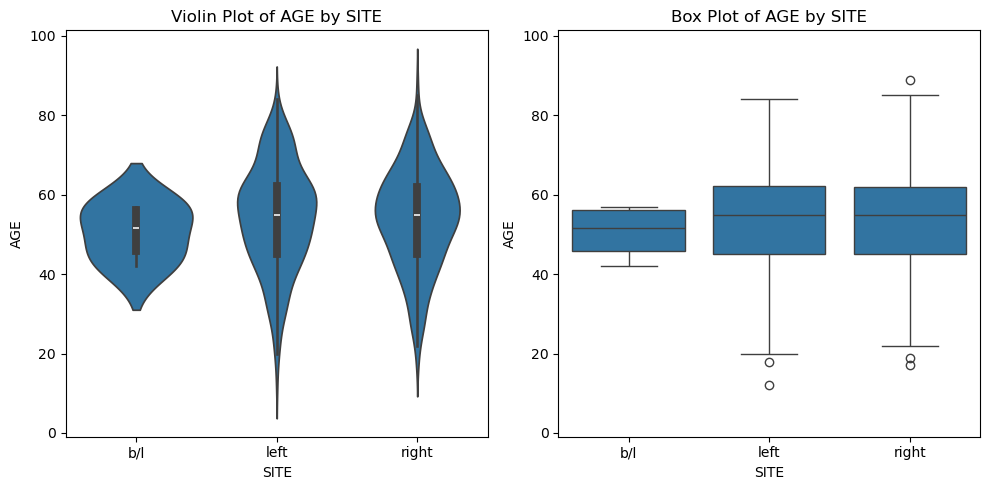

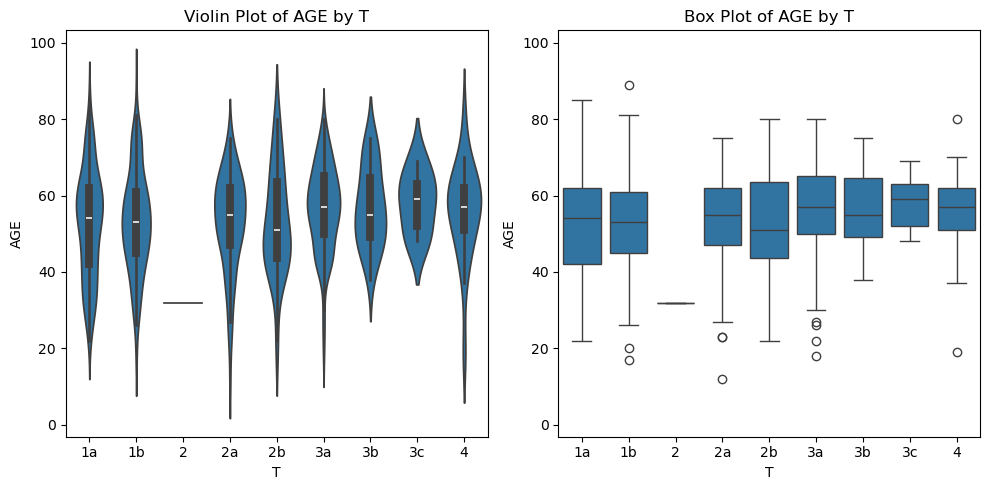

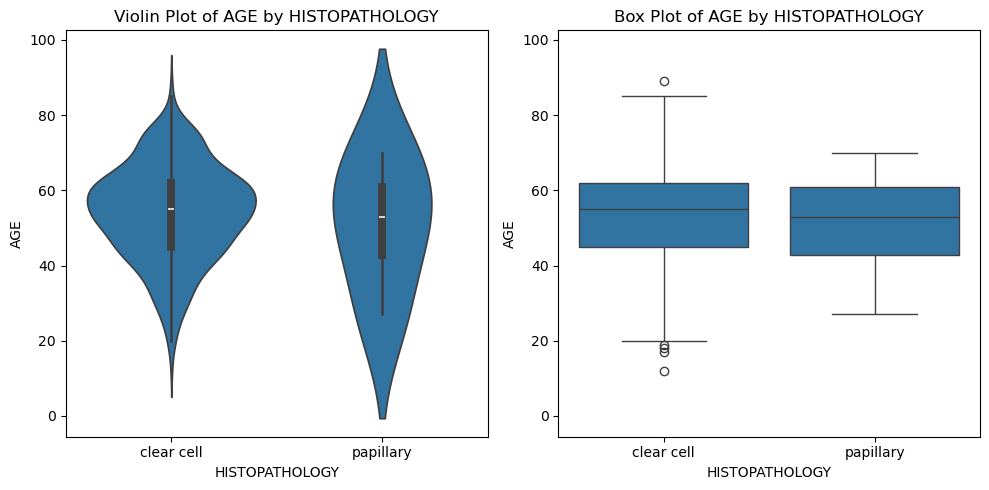

In [51]:
for col in obj_cols:
    box_violin_plotter('AGE', col)

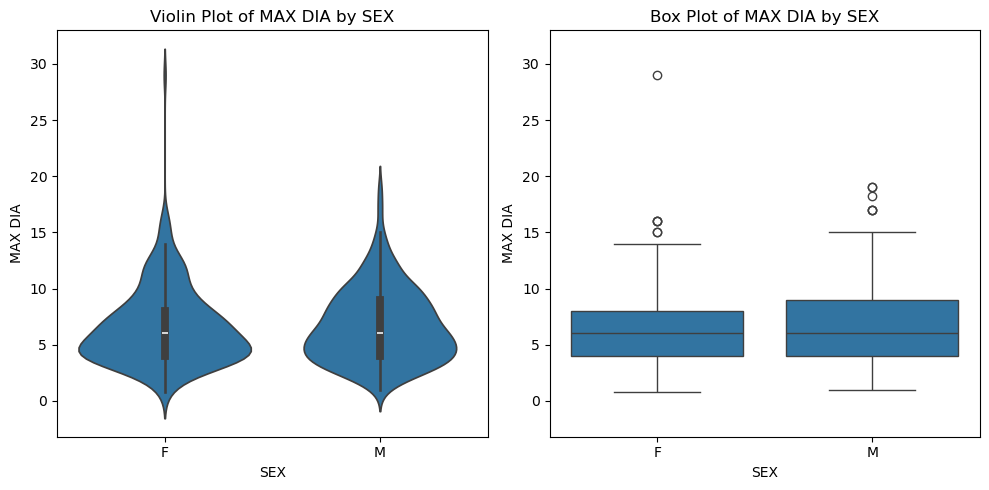

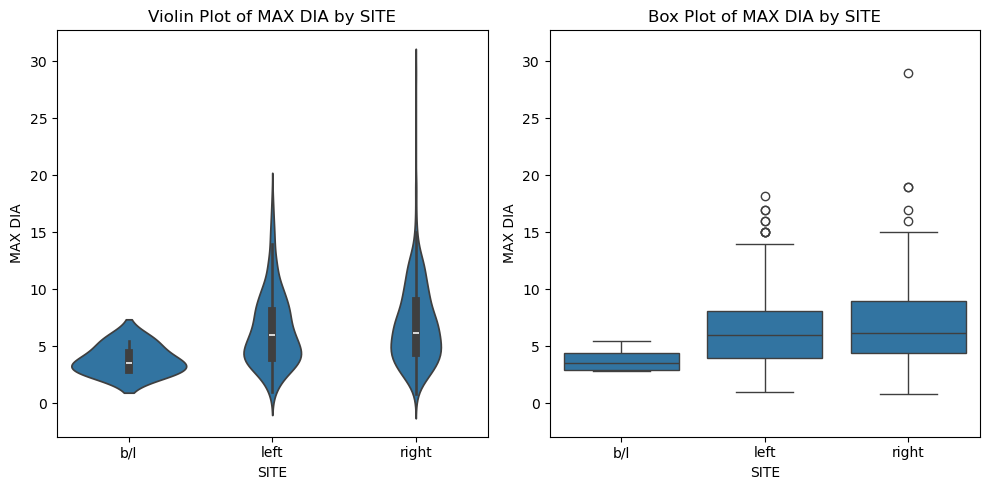

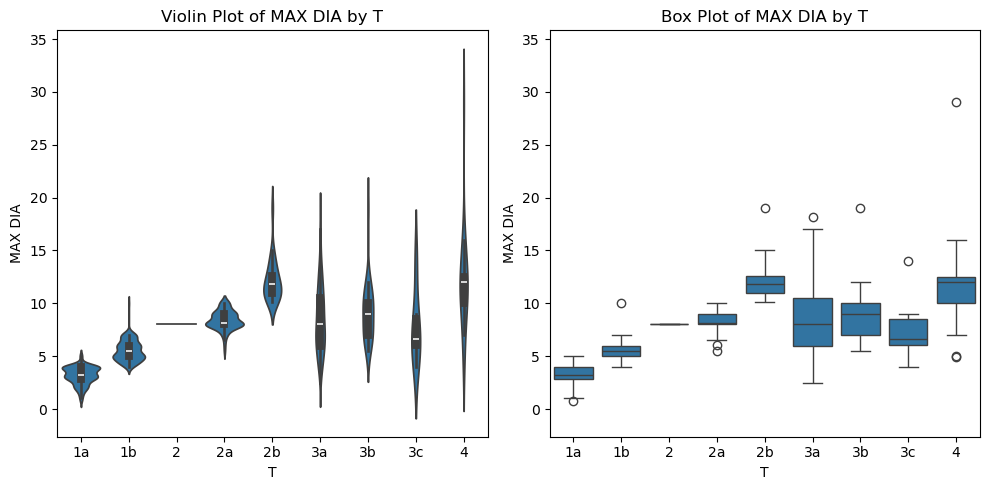

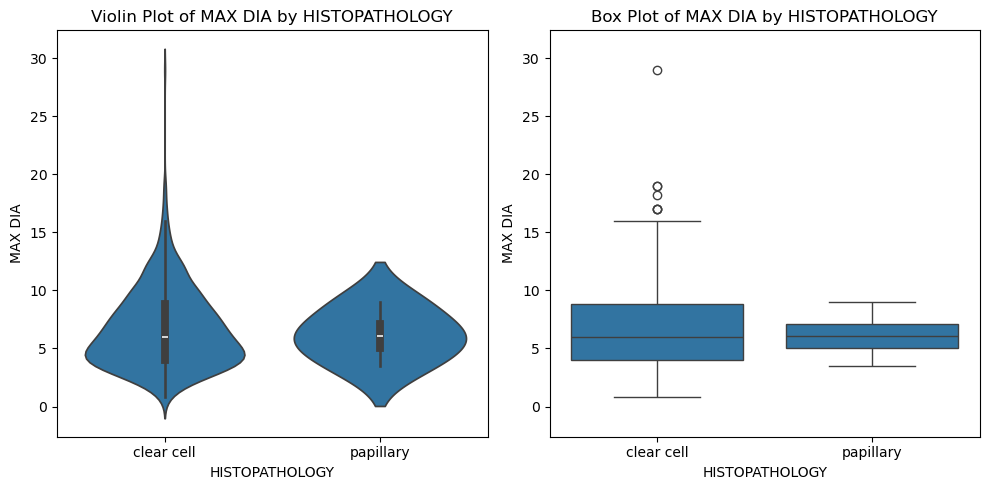

In [52]:
for col in obj_cols:
    box_violin_plotter('MAX DIA', col)

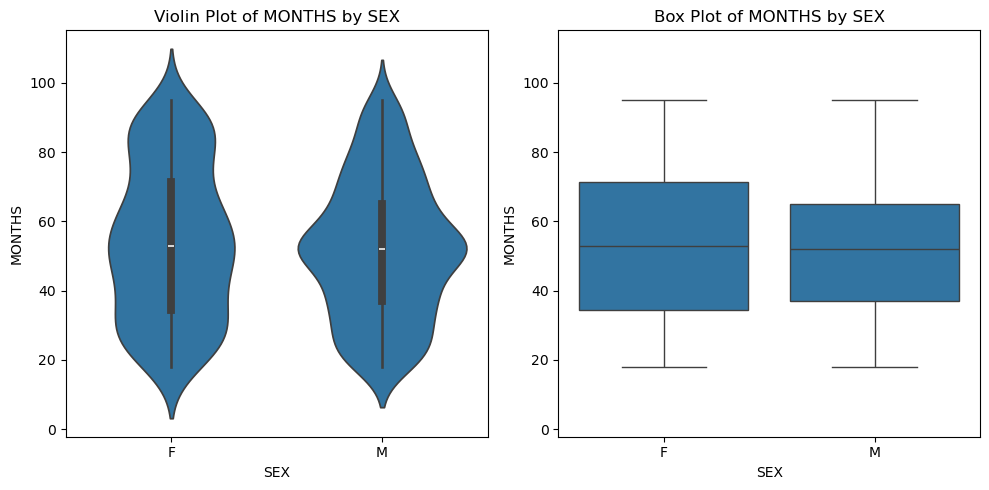

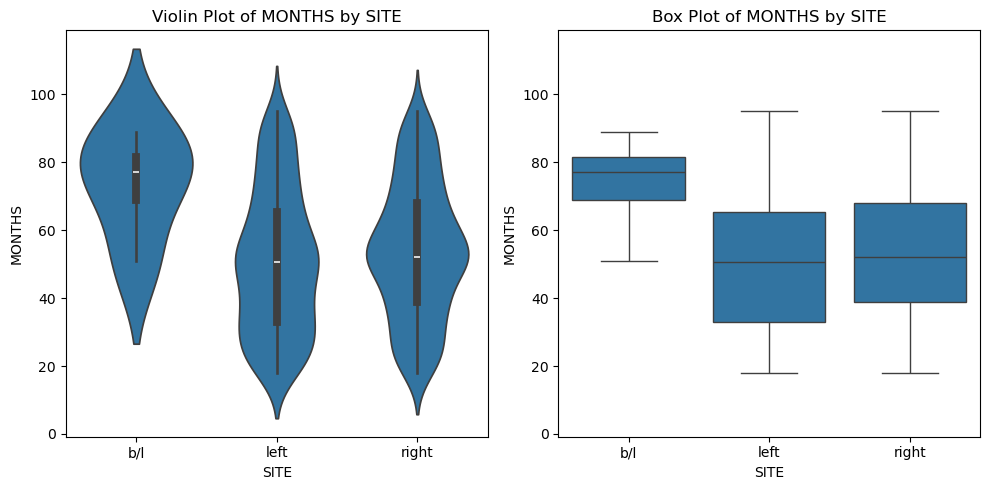

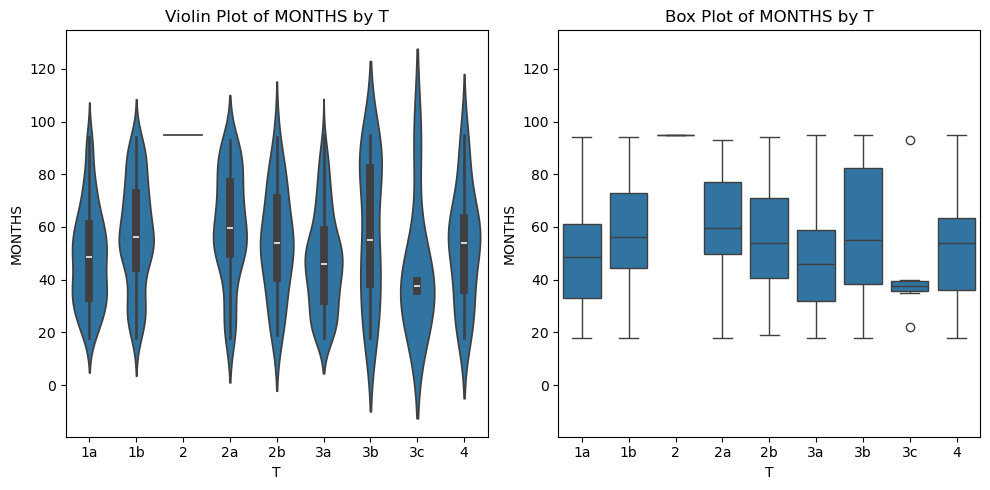

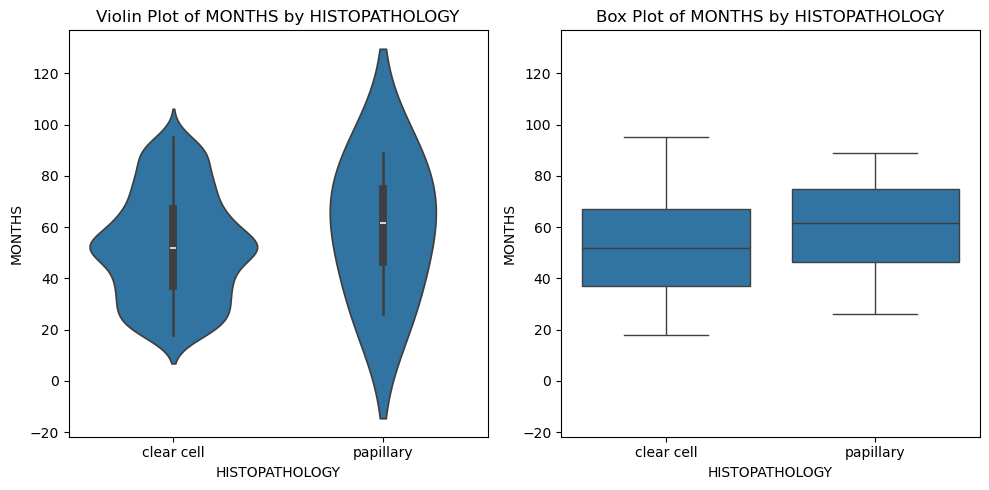

In [53]:
for col in obj_cols:
    box_violin_plotter('MONTHS', col)

C:\Users\aniru\AppData\Local\Temp\ipykernel_7360\2212858045.py:5: FutureWarning: 

The `bw` parameter is deprecated in favor of `bw_method`/`bw_adjust`.
Setting `bw_method=0.2`, but please see docs for the new parameters
and update your code. This will become an error in seaborn v0.15.0.

  sns.violinplot(x="day", y="total_bill", data=toy_data, bw=0.2)


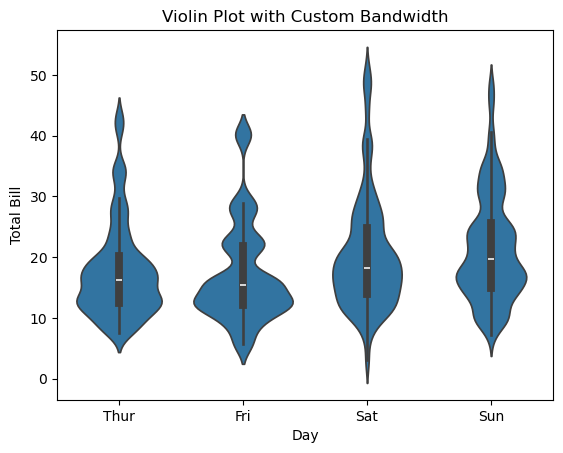

In [54]:
# Example data
toy_data = sns.load_dataset("tips")

# Create a violin plot with a specific bandwidth
sns.violinplot(x="day", y="total_bill", data=toy_data, bw=0.2)

# Add labels and title
plt.xlabel("Day")
plt.ylabel("Total Bill")
plt.title("Violin Plot with Custom Bandwidth")

# Show the plot
plt.show()

In [55]:
import scipy.stats as stats
import pandas as pd

# Create a sample dataset
np.random.seed(42)  # For reproducibility

# Generate random numerical data for two categories
category_a_data = np.random.normal(loc=10, scale=2, size=50)
category_b_data = np.random.normal(loc=12, scale=2, size=50)

# Combine data into a DataFrame
toy_data = pd.DataFrame({
    'Category': ['A'] * 50 + ['B'] * 50,
    'NumericData': np.concatenate([category_a_data, category_b_data])
})

# Separate data into two groups based on the categories
group_a = toy_data[toy_data['Category'] == 'A']['NumericData']
group_b = toy_data[toy_data['Category'] == 'B']['NumericData']

# Perform t-test
t_statistic, p_value = stats.ttest_ind(group_a, group_b)

# Print results
print("T-statistic:", t_statistic)
print("P-value:", p_value)

# Interpret the results
alpha = 0.05  # Set your significance level
if p_value < alpha:
    print("The difference in means is statistically significant.")
else:
    print("There is not enough evidence to reject the null hypothesis.")

T-statistic: -6.872731683285841
P-value: 5.877565294167719e-10
The difference in means is statistically significant.


In [56]:
def t_test(num, cat):
    print(f't-test with {num} and {cat}')
    # Separate data into two groups based on the categories
    a, b = data[cat].unique()
    group_a = data[data[cat] == a][num]
    group_b = data[data[cat] == b][num]

    # Perform t-test
    t_statistic, p_value = stats.ttest_ind(group_a, group_b)

    # Print results
    print("T-statistic:", t_statistic)
    print("P-value:", p_value)

    # Interpret the results
    alpha = 0.05  # Set your significance level
    if p_value < alpha:
        print("The difference in means is statistically significant.")
        return 1
    else:
        print("There is not enough evidence to reject the null hypothesis.")
        return 0

In [57]:
for num in num_cont_cols:
    for obj in obj_cols:
        if (data[obj].nunique() == 2):
            t_test(num, obj)
            print()
    print('-----------------------------------------------------------')

t-test with AGE and SEX
T-statistic: 1.1089584356657467
P-value: 0.2678328064520461
There is not enough evidence to reject the null hypothesis.

t-test with AGE and HISTOPATHOLOGY
T-statistic: 0.5199288533163513
P-value: 0.6032792018155052
There is not enough evidence to reject the null hypothesis.

-----------------------------------------------------------
t-test with MAX DIA and SEX
T-statistic: 0.327756103827544
P-value: 0.7431950714146998
There is not enough evidence to reject the null hypothesis.

t-test with MAX DIA and HISTOPATHOLOGY
T-statistic: 0.30955271173096244
P-value: 0.7569941743428403
There is not enough evidence to reject the null hypothesis.

-----------------------------------------------------------
t-test with MONTHS and SEX
T-statistic: -1.2145451795855993
P-value: 0.22495329342484036
There is not enough evidence to reject the null hypothesis.

t-test with MONTHS and HISTOPATHOLOGY
T-statistic: -0.6654341705322224
P-value: 0.5059942421189751
There is not enough e

In [58]:
cont_cat_sig = {}
for num in num_cont_cols:
    cont_cat_sig[num] = []
    for cat in num_cat_cols:
        if (data[cat].nunique() == 2 and data[cat].isna().sum() == 0):
            t = t_test(num, cat)
            print()
            if t == 1:
                cont_cat_sig[num].append(cat)
    print('-----------------------------------------------------------')

print(cont_cat_sig)

t-test with AGE and DM
T-statistic: -7.320085512467436
P-value: 6.887735724665636e-13
The difference in means is statistically significant.

t-test with AGE and HTN
T-statistic: -10.810031284124785
P-value: 2.810484785107514e-25
The difference in means is statistically significant.

t-test with AGE and CKD
T-statistic: -0.9051317203042956
P-value: 0.3657101723584689
There is not enough evidence to reject the null hypothesis.

t-test with AGE and INCIDENTAL
T-statistic: -2.5304579492749264
P-value: 0.011611646070903422
The difference in means is statistically significant.

t-test with AGE and PAIN
T-statistic: -4.7263803090159655
P-value: 2.768923875535605e-06
The difference in means is statistically significant.

t-test with AGE and HEMATURIA
T-statistic: -1.5514090267497231
P-value: 0.12126023234613198
There is not enough evidence to reject the null hypothesis.

t-test with AGE and MASS
T-statistic: 1.7009841651783022
P-value: 0.08939456615105662
There is not enough evidence to reject

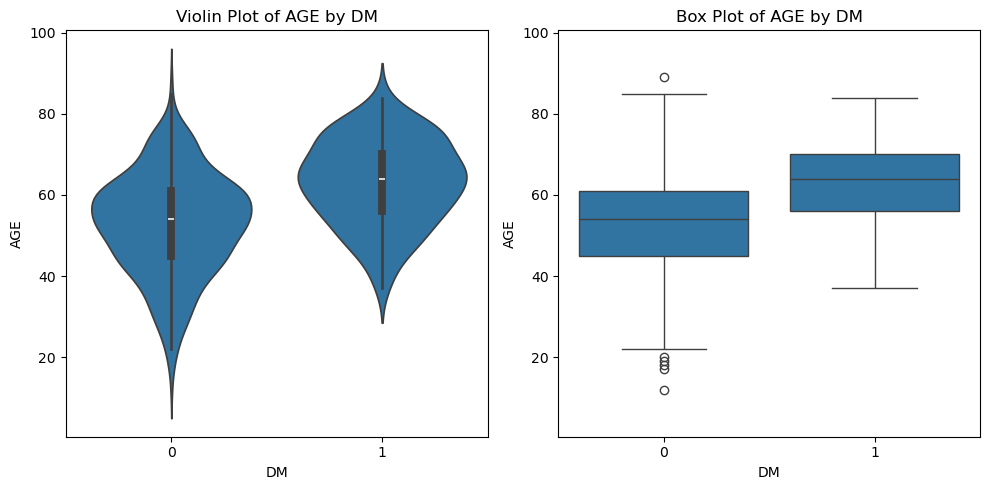

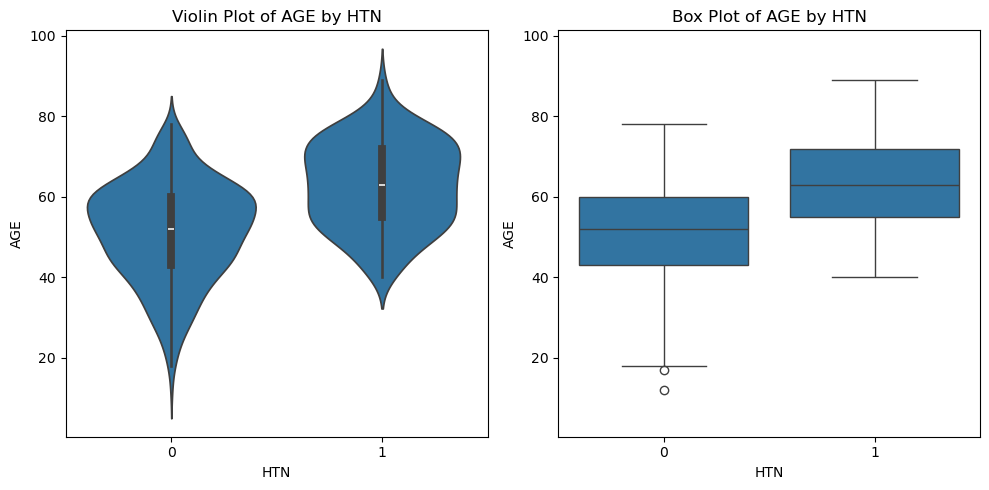

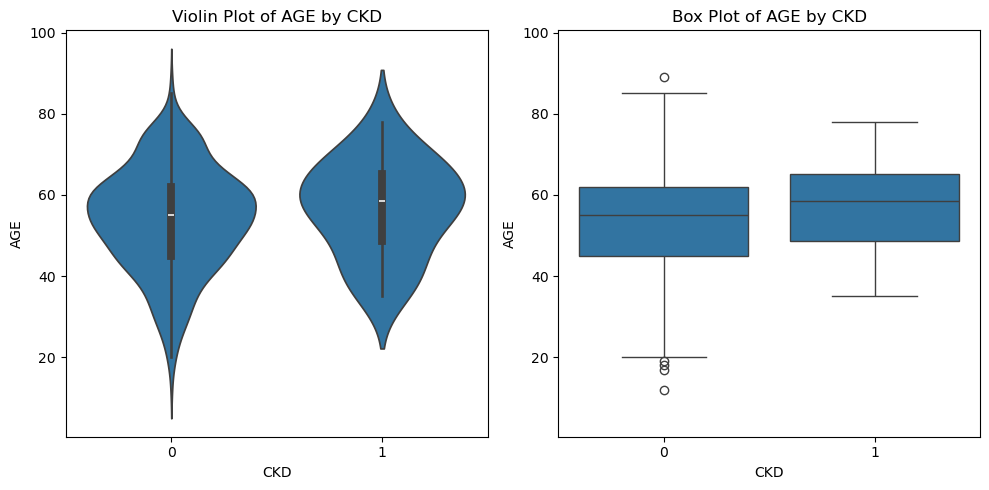

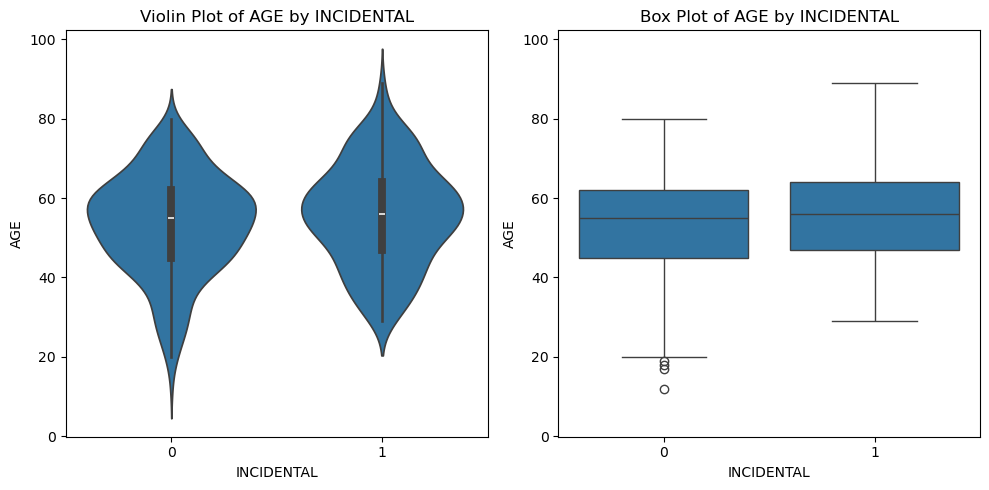

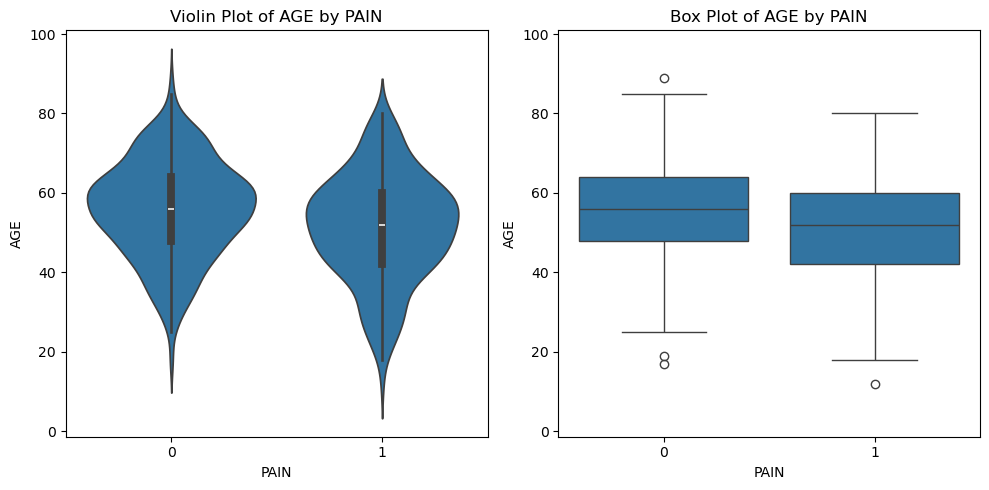

...

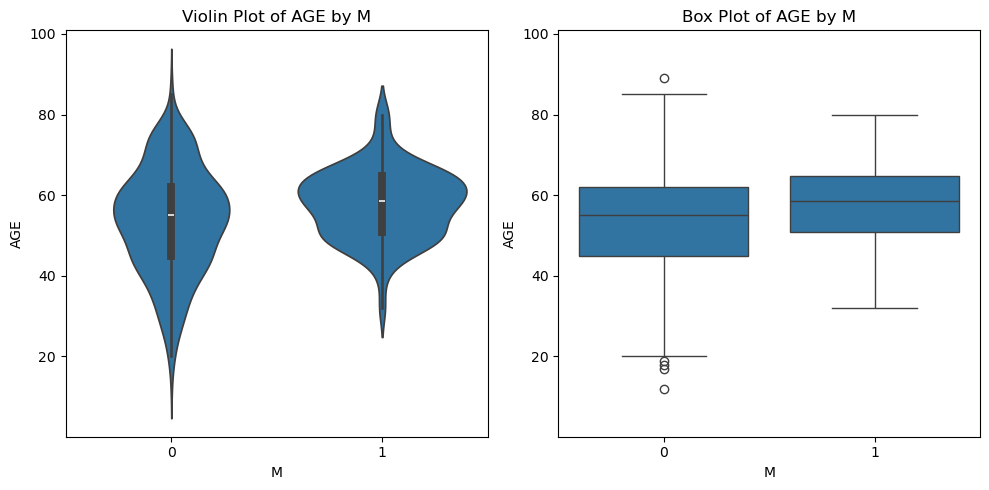

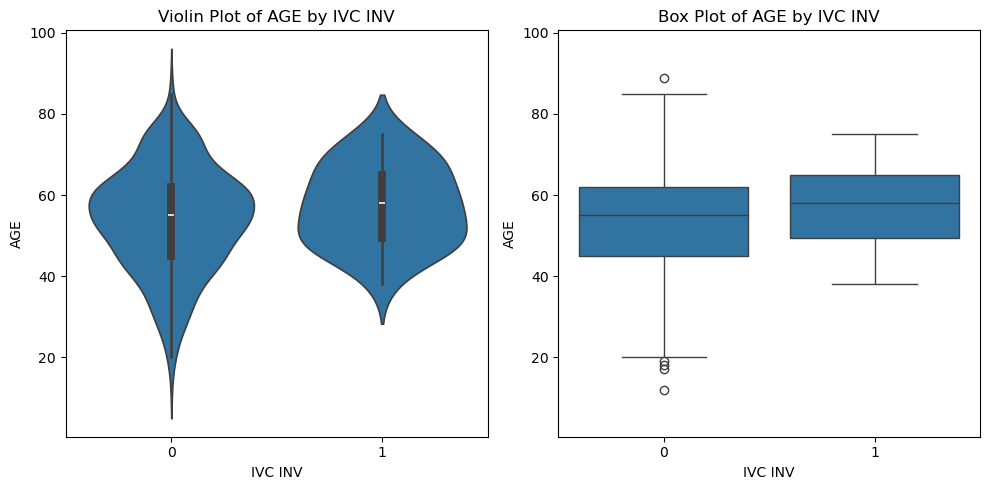

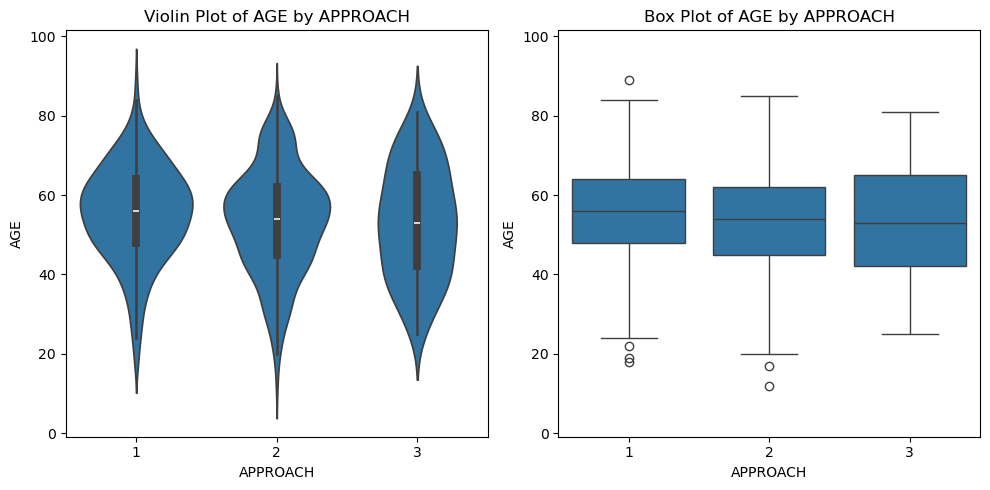

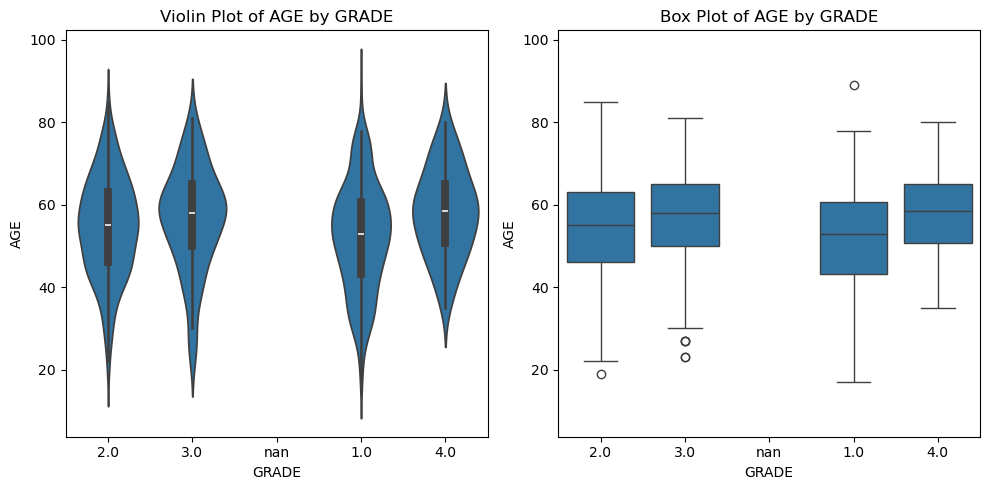

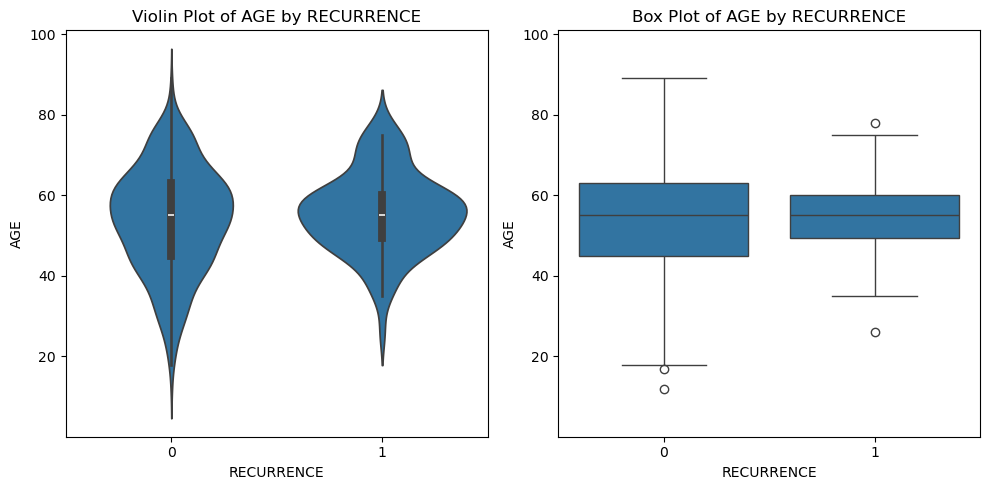

In [59]:
for col in num_cat_cols:
    box_violin_plotter('AGE', col)

In [60]:
temp1 = []
for col1 in obj_cols:
    for col2 in obj_cols:
        if col1 != col2:
            if sorted([col1, col2]) not in temp1:
                temp1.append([col1, col2])
                data_chi_square_test(col1, col2)
                print('-------------------------------------------------')

SITE  b/l  left  right
SEX                   
F       1   102    124
M       3   222    243

Chi-Square Statistic: 0.5234309151890577
P-value: 0.7697300133797447
-------------------------------------------------
T     1a   1b  2  2a  2b   3a  3b  3c   4
SEX                                      
F     54   66  0  31   6   52   5   2  11
M    122  112  1  57  18  121  21   4  12

Chi-Square Statistic: 8.35337772392193
P-value: 0.39973412472505176
-------------------------------------------------
HISTOPATHOLOGY  clear cell  papillary
SEX                                  
F                      225          2
M                      466          2

Chi-Square Statistic: 0.04281733416042452
P-value: 0.8360696046429997
-------------------------------------------------
T      1a  1b  2  2a  2b  3a  3b  3c   4
SITE                                    
b/l     3   1  0   0   0   0   0   0   0
left   88  83  1  42   8  89   2   1  10
right  85  94  0  46  16  84  24   5  13

Chi-Square Statistic: 

In [61]:
for col1 in num_cat_cols:
    for col2 in obj_cols:
        data_chi_square_test(col1, col2)
        print()
    print('-------------------------------------------------')

SEX    F    M
DM           
0    197  409
1     30   59

Chi-Square Statistic: 0.010880381340125256
P-value: 0.9169240831914441

SITE  b/l  left  right
DM                    
0       3   288    315
1       1    36     52

Chi-Square Statistic: 1.976781731612832
P-value: 0.3721750891033951

T    1a   1b  2  2a  2b   3a  3b  3c   4
DM                                      
0   155  154  1  74  23  154  20   4  21
1    21   24  0  14   1   19   6   2   2

Chi-Square Statistic: 8.287337171162996
P-value: 0.4059174325877162

HISTOPATHOLOGY  clear cell  papillary
DM                                   
0                      602          4
1                       89          0

Chi-Square Statistic: 0.00033683870305760785
P-value: 0.985357114241674

-------------------------------------------------
SEX    F    M
HTN          
0    178  355
1     49  113

Chi-Square Statistic: 0.4261054890040204
P-value: 0.5139061393125774

SITE  b/l  left  right
HTN                   
0       3   252    278
1  

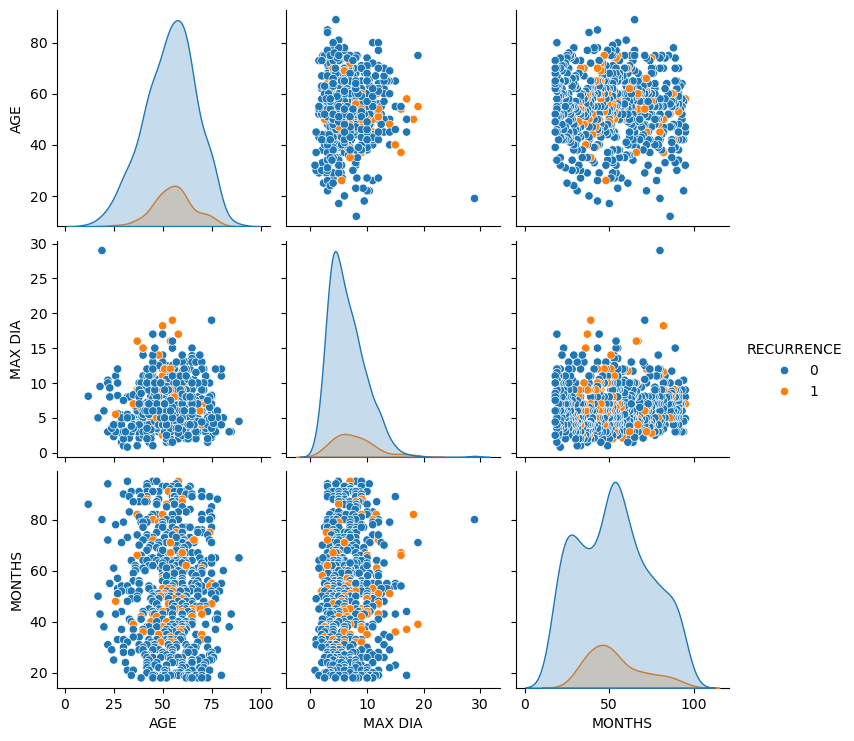

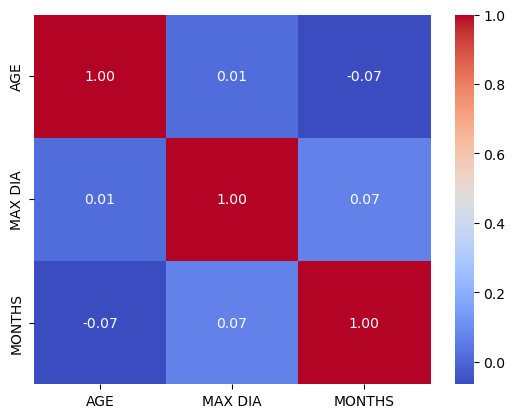

In [62]:
sns.pairplot(data[num_cont_cols + ['RECURRENCE']], hue = 'RECURRENCE')
plt.show()

correlation_matrix = data[num_cont_cols].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.show()

In [63]:
# Generate a toy dataset
X, y = make_classification(n_samples=300, n_features=10, n_classes=2, random_state=42)

# Create a DataFrame
df = pd.DataFrame(X, columns=[f'feature_{i}' for i in range(1, 11)])
df['target_variable'] = y

# Display the first few rows of the DataFrame
display(df.head())

,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,target_variable
0,-0.025435,1.452468,-1.203192,1.248099,-0.508140,0.923225,0.300474,-0.453248,-0.147780,0.326745,1
1,0.749972,0.097983,0.663984,-0.679773,0.253740,-0.338745,-0.391649,1.085786,0.467693,0.308051,0
2,-1.235592,-0.839210,-0.903206,0.922051,0.538296,0.410811,-1.966357,-0.364953,1.072507,-1.044809,1
3,-1.614818,-0.755745,-0.721757,0.729149,-0.668090,0.182711,-0.898468,-0.174960,0.992042,0.536510,1
4,-0.723893,0.632932,0.952203,-0.996834,-0.832356,-0.903253,-1.515744,-0.552223,0.471416,0.202923,0


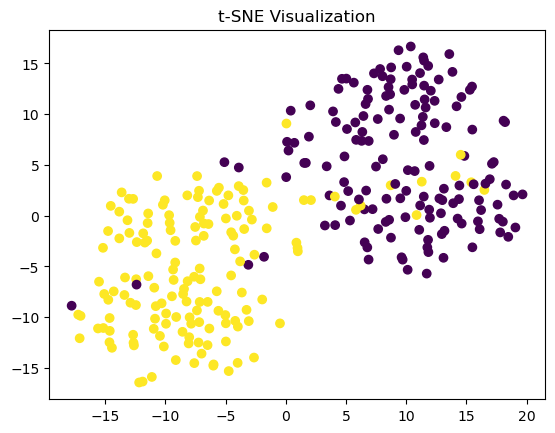

In [64]:
# Perform t-SNE on the feature matrix X
X_tsne = TSNE(n_components=2, random_state=42).fit_transform(X)

# Scatter plot the t-SNE visualization
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=df['target_variable'], cmap='viridis')
plt.title('t-SNE Visualization')
plt.show()

In [65]:
# Create a toy DataFrame with categorical variables
toy_data = {
    'Categorical_Variable1': np.random.choice(['A', 'B', 'C'], size=100),
    'Categorical_Variable2': np.random.choice(['X', 'Y', 'Z'], size=100),
}

df = pd.DataFrame(toy_data)

# Display the first few rows of the DataFrame
display(df.head())

,Categorical_Variable1,Categorical_Variable2
0,A,Y
1,B,X
2,A,Z
3,A,X
4,C,X


In [66]:
def mosaic_heatmap(cat1, cat2):
    fig, axes = plt.subplots(figsize=(10, 8))
    # Mosaic Plot
    props = {'color': 'gray', 'edgecolor': 'white'}
    mosaic(data, [cat1, cat2], title='Mosaic Plot', properties=props, ax=axes)
    plt.show()

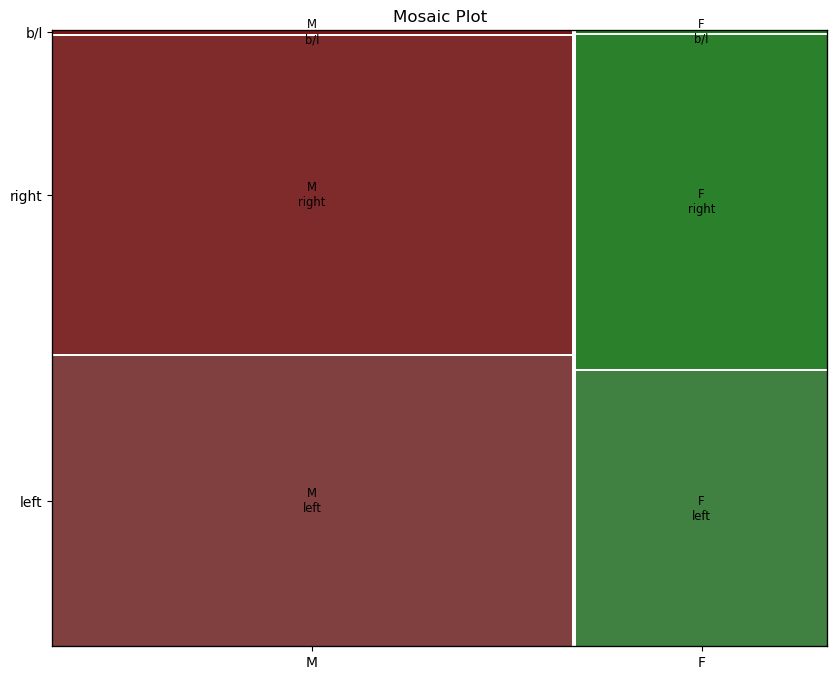

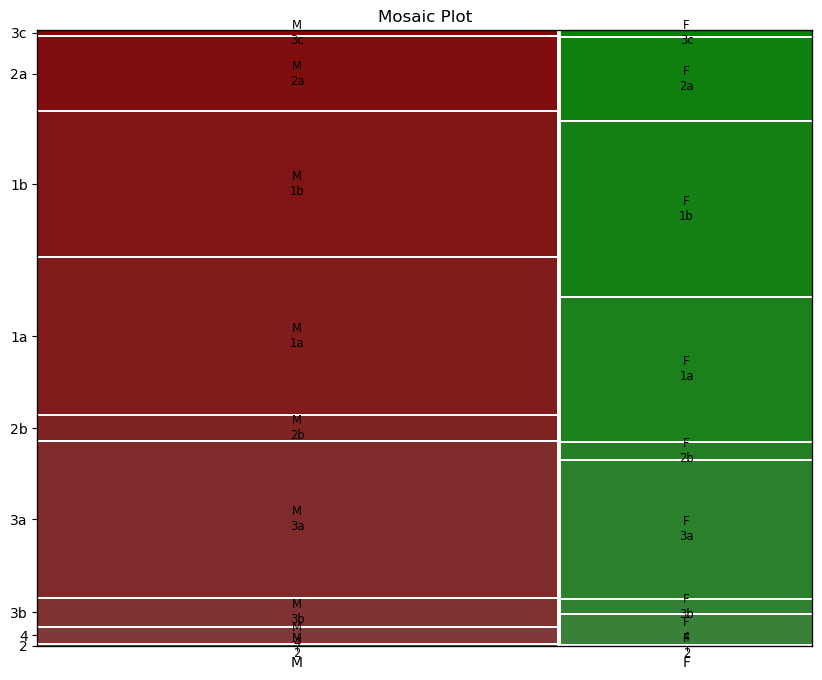

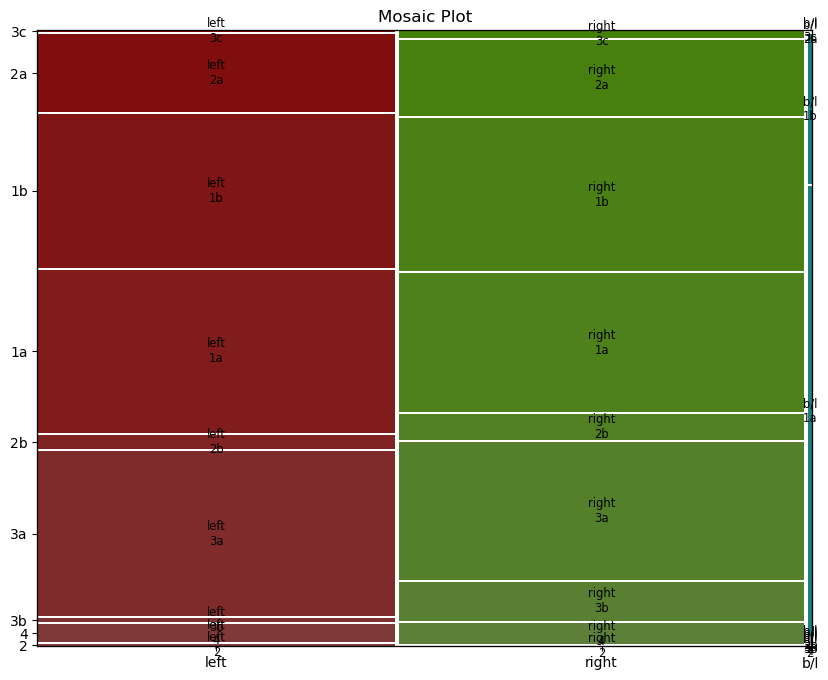

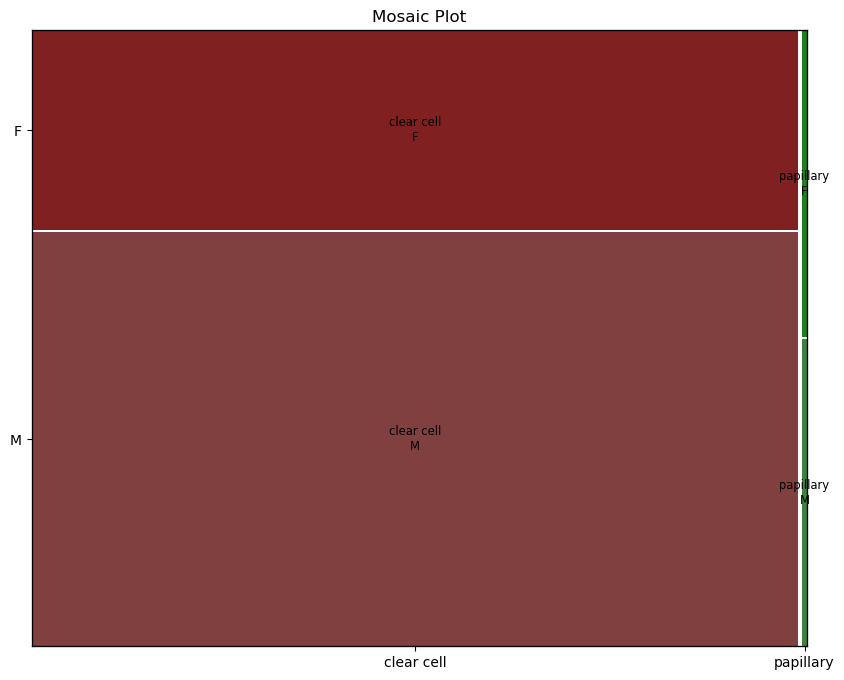

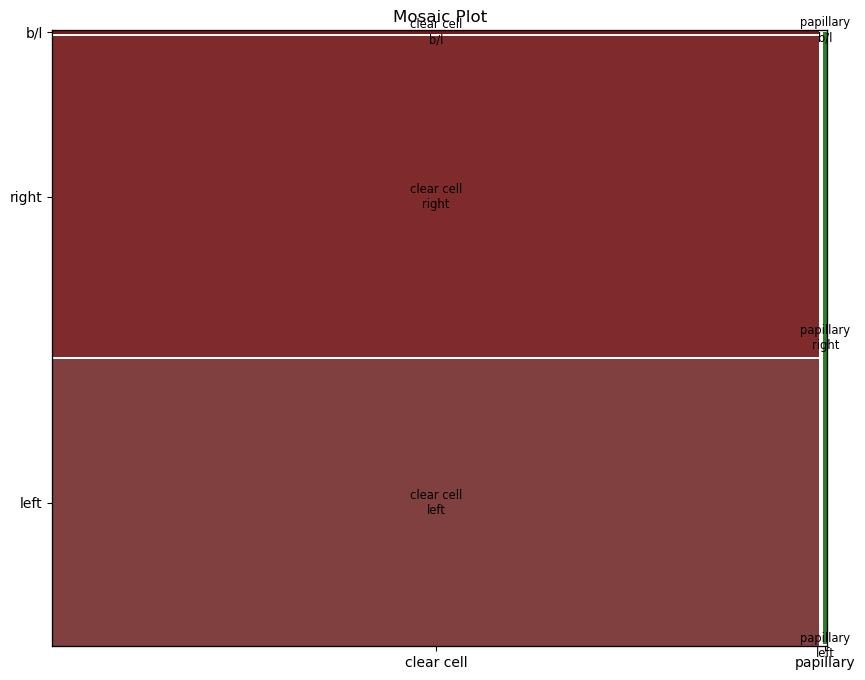

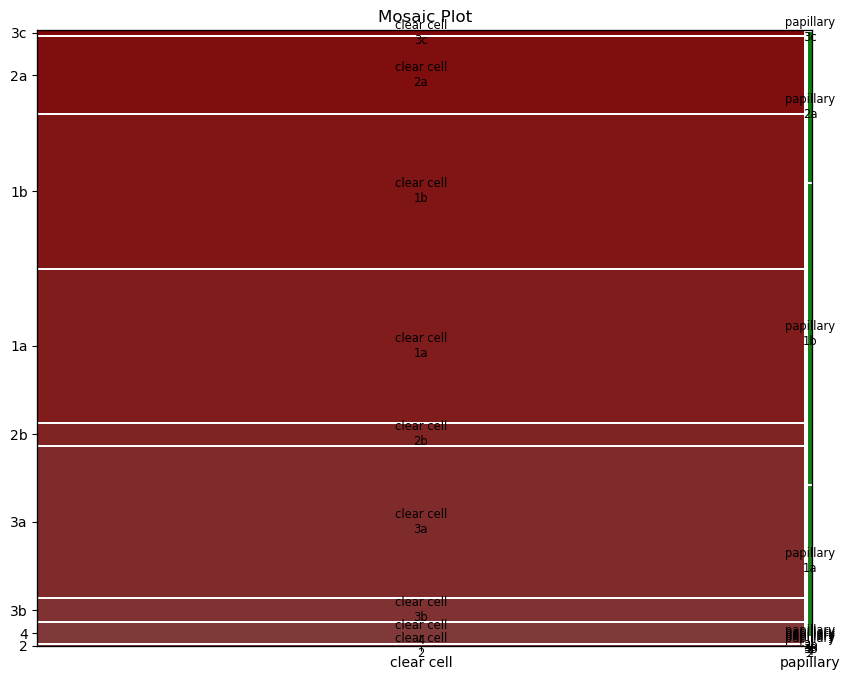

In [67]:
for col1 in obj_cols:
    for col2 in obj_cols:
        if col1 != col2:
            if [col1, col2] == sorted([col1, col2]):
                mosaic_heatmap(col1, col2)

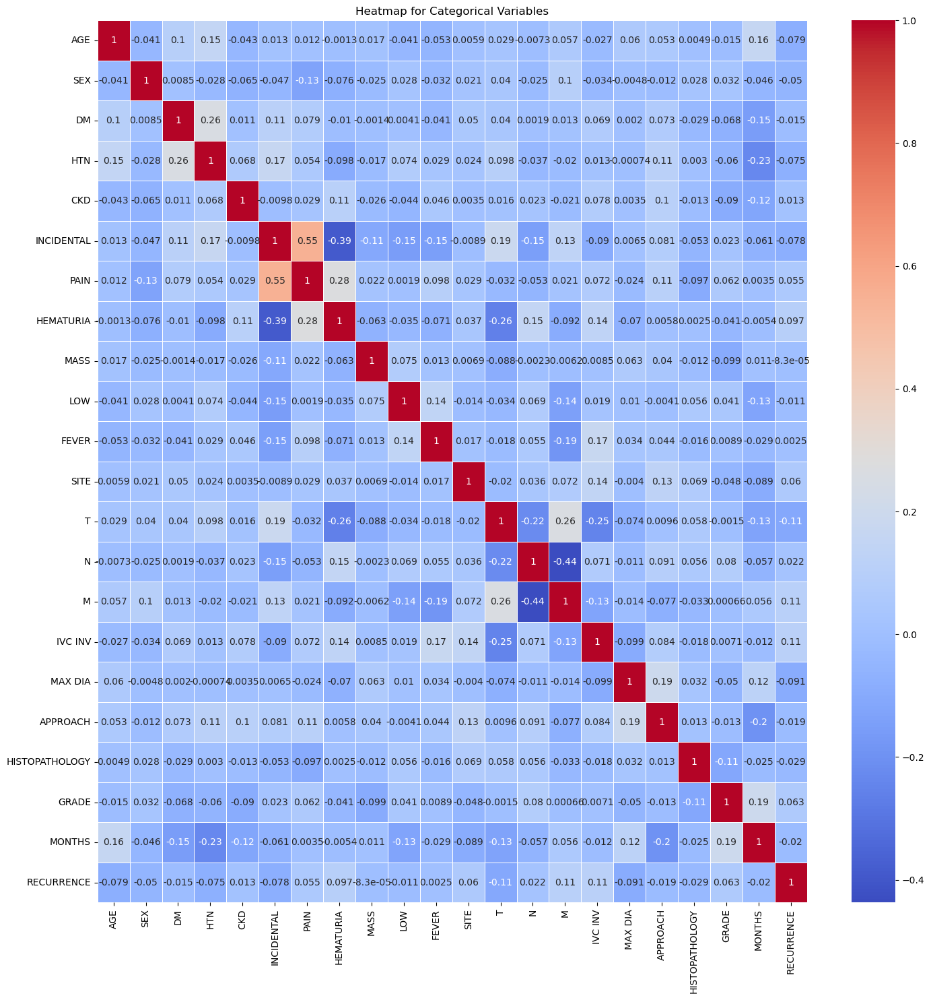

In [68]:
# Heatmap for Categorical Variables
plt.figure(figsize = (17, 17))
categorical_corr_matrix = data.apply(lambda x: pd.factorize(x)[0]).corr(method='pearson')
sns.heatmap(categorical_corr_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Heatmap for Categorical Variables')
plt.show()

In [69]:
X = data.copy()
y = X.pop('RECURRENCE')
X.loc[64, 'LOW'] = 0
X.loc[X.GRADE.isna(), 'GRADE'] = 2 # mean imputation
X.loc[0, 'T'] = '2a'
X = pd.get_dummies(X, columns = ['SEX', 'SITE', 'HISTOPATHOLOGY'])
ordinal_T_mapping = {'1a':1, '1b':2, '2a':3, '2b':4, '3a':5, '3b':6, '3c':7, '4':8}
X['T_ENCODED'] = X['T'].replace(ordinal_T_mapping)
X.pop('T')

0      2a
1       4
2      3b
3      3a
4      2b
       ..
690    3a
691    2a
692    3b
693    3a
694    3a
Name: T, Length: 695, dtype: object

In [70]:
X.rename(columns = {'SITE_b/l':'SITE_B_L', 'SITE_left':'SITE_LEFT', 'SITE_right':'SITE_RIGHT', 
                    'HISTOPATHOLOGY_clear cell':'HISTOPATHOLOGY_CLEAR_CELL',
                    'HISTOPATHOLOGY_papillary':'HISTOPATHOLOGY_PAPILLARY'}, inplace = True)

In [71]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [72]:
pca_cont = PCA(n_components = 3)
X_pca_cont = pca_cont.fit_transform(X[num_cont_cols])

In [73]:
explained_variance_ratios = pca_cont.explained_variance_ratio_
explained_variance_ratios

array([0.70848289, 0.27302664, 0.01849047])

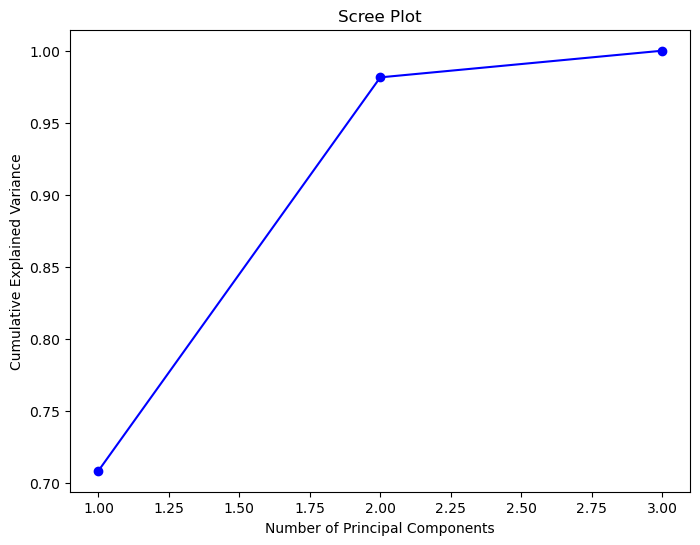

In [74]:
# Calculate the cumulative explained variance
cumulative_variance = np.cumsum(explained_variance_ratios)

# Plot the scree plot
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(explained_variance_ratios) + 1), cumulative_variance, marker='o', linestyle='-', color='b')
plt.title('Scree Plot')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.show()

In [75]:
# Create a toy DataFrame with 20 features and 100 samples
np.random.seed(42)
toy_X, _ = make_classification(n_samples=100, n_features=20, n_informative=10, n_redundant=5)

columns = [f"Feature_{i+1}" for i in range(toy_X.shape[1])]
toy_df = pd.DataFrame(toy_X, columns=columns)

# Display the original DataFrame
print("Original DataFrame:")
display(toy_df.head())

# a) PCA with n_components = 10
pca_10 = PCA(n_components=10)
toy_X_pca_10 = pca_10.fit_transform(toy_df)
toy_exp_10 = pca_10.explained_variance_ratio_

# b) PCA with n_components = 0.95
pca_95 = PCA(n_components=0.95)
toy_X_pca_95 = pca_95.fit_transform(toy_df)
toy_exp_95 = pca_10.explained_variance_ratio_

# Display the results
print("\nResults for PCA with n_components = 10:")
display(pd.DataFrame(toy_X_pca_10, columns=[f"PC_{i+1}" for i in range(toy_X_pca_10.shape[1])]).head())

print("\nResults for PCA with n_components = 0.95:")
display(pd.DataFrame(toy_X_pca_95, columns=[f"PC_{i+1}" for i in range(toy_X_pca_95.shape[1])]).head())

Original DataFrame:


,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8,Feature_9,Feature_10,Feature_11,Feature_12,Feature_13,Feature_14,Feature_15,Feature_16,Feature_17,Feature_18,Feature_19,Feature_20
0,6.304906,0.034349,-3.387938,2.056207,2.941466,1.382517,4.616747,-0.947949,1.162520,-1.966357,-3.012262,-1.044809,-1.363915,-0.955303,0.660895,-1.103208,-0.839210,-1.741938,-1.592160,-1.089363
1,-0.063685,-3.294023,-0.571786,0.742127,-1.621519,0.272906,1.255334,0.338912,3.003377,1.639965,-0.977231,1.314914,0.842028,-0.267202,3.003704,0.075434,1.612278,0.017512,-2.549438,0.826585
2,0.579031,0.938669,-0.899203,-0.447322,2.826579,0.459925,0.707251,0.647983,1.876378,1.080048,-3.332660,1.873298,1.993781,-1.189857,0.094436,1.281016,-0.668144,2.265312,5.638523,-0.921926
3,-0.985726,-0.820114,-1.206066,1.392465,-0.904089,-3.658349,1.125556,3.684038,8.138848,-0.670620,-0.098847,1.000582,0.085260,-3.174892,0.363610,-0.250047,0.919154,-0.404722,0.417512,4.576543
4,8.666308,-1.916369,-1.514110,0.556230,2.885892,1.639189,3.084616,1.192908,-0.786709,1.328194,-2.574346,-0.250833,-2.697134,0.782610,1.598312,0.455888,-0.322680,-1.052825,-0.146292,-1.420012



Results for PCA with n_components = 10:


,PC_1,PC_2,PC_3,PC_4,PC_5,PC_6,PC_7,PC_8,PC_9,PC_10
0,5.276307,-0.051209,-5.627402,2.587639,-2.952051,0.279158,-0.119904,2.292314,0.055408,-1.482670
1,-1.206841,-0.169124,-3.239301,-1.288964,2.945922,1.459114,-1.668593,0.653996,-0.012746,1.953459
2,1.984030,0.261523,4.017954,-2.367850,-4.429521,-0.228269,-3.183571,2.696102,-0.300804,-0.355403
3,-1.462640,4.498810,-1.855227,-7.068096,0.915908,-1.911004,3.492289,0.065307,-0.975261,2.273382
4,6.790582,-4.610049,-4.655456,2.427974,-3.675592,0.965748,0.233993,1.377269,1.404619,0.476069



Results for PCA with n_components = 0.95:


,PC_1,PC_2,PC_3,PC_4,PC_5,PC_6,PC_7,PC_8,PC_9
0,5.276307,-0.051209,-5.627402,2.587639,-2.952051,0.279158,-0.119904,2.292314,0.055408
1,-1.206841,-0.169124,-3.239301,-1.288964,2.945922,1.459114,-1.668593,0.653996,-0.012746
2,1.984030,0.261523,4.017954,-2.367850,-4.429521,-0.228269,-3.183571,2.696102,-0.300804
3,-1.462640,4.498810,-1.855227,-7.068096,0.915908,-1.911004,3.492289,0.065307,-0.975261
4,6.790582,-4.610049,-4.655456,2.427974,-3.675592,0.965748,0.233993,1.377269,1.404619


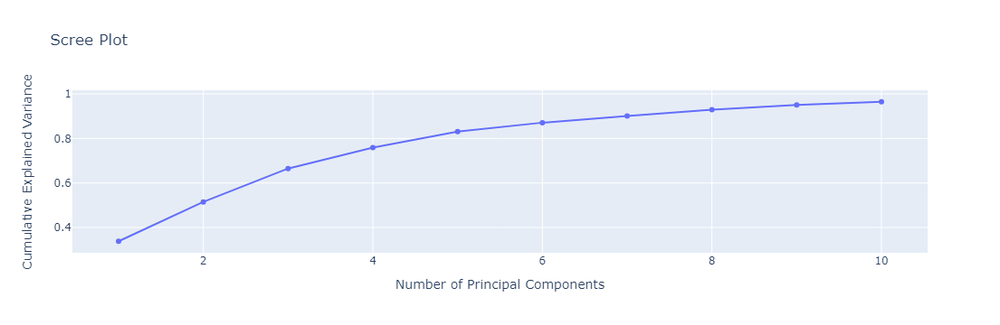

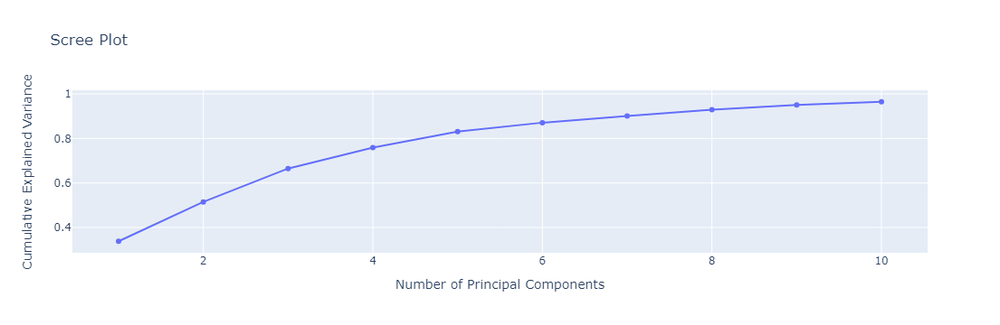

In [76]:
# Create a scree plot using Plotly Express
cum_var_10 = np.cumsum(toy_exp_10)
cum_var_95 = np.cumsum(toy_exp_95)

fig = px.line(x=range(1, len(toy_exp_10) + 1), y=cum_var_10, 
              markers=True, title='Scree Plot',
              labels={'x': 'Number of Principal Components', 'y': 'Cumulative Explained Variance'})

fig.show()

fig = px.line(x=range(1, len(toy_exp_95) + 1), y=cum_var_95, 
              markers=True, title='Scree Plot',
              labels={'x': 'Number of Principal Components', 'y': 'Cumulative Explained Variance'})

fig.show()

In [77]:
# b) PCA with n_components = 0.95
pca_all = PCA(n_components=20)
toy_X_pca_all = pca_all.fit_transform(toy_df)
toy_exp_all = pca_all.explained_variance_ratio_

# Display the results
print("\nResults for PCA with n_components = 20:")
display(pd.DataFrame(toy_X_pca_all, columns=[f"PC_{i+1}" for i in range(toy_X_pca_all.shape[1])]).head())


Results for PCA with n_components = 20:


,PC_1,PC_2,PC_3,PC_4,PC_5,PC_6,PC_7,PC_8,PC_9,PC_10,PC_11,PC_12,PC_13,PC_14,PC_15,PC_16,PC_17,PC_18,PC_19,PC_20
0,5.276307,-0.051209,-5.627402,2.587639,-2.952051,0.279158,-0.119904,2.292314,0.055408,-1.482670,2.941364,-1.225590,0.022428,-1.983973,0.385136,1.479760e-15,1.697053e-15,2.711103e-15,-2.969679e-16,-3.819789e-16
1,-1.206841,-0.169124,-3.239301,-1.288964,2.945922,1.459114,-1.668593,0.653996,-0.012746,1.953459,-0.482215,1.420854,1.377877,1.362346,-0.456055,7.766020e-15,1.092996e-15,-1.009401e-15,-3.318793e-16,-2.834199e-16
2,1.984030,0.261523,4.017954,-2.367850,-4.429521,-0.228269,-3.183571,2.696102,-0.300804,-0.355403,-0.940049,1.781885,-0.123572,-0.315227,0.651963,-2.340107e-15,4.805611e-15,-1.301327e-15,3.304160e-16,2.201361e-17
3,-1.462640,4.498810,-1.855227,-7.068096,0.915908,-1.911004,3.492289,0.065307,-0.975261,2.273382,0.382612,0.989215,-0.313183,0.541886,0.977918,-6.783654e-16,7.173596e-16,1.513309e-16,-4.519397e-16,-7.874677e-16
4,6.790582,-4.610049,-4.655456,2.427974,-3.675592,0.965748,0.233993,1.377269,1.404619,0.476069,-0.074131,0.412133,0.108797,0.138641,-0.462180,2.053477e-15,4.435890e-16,1.969640e-15,-2.307714e-16,9.959290e-16


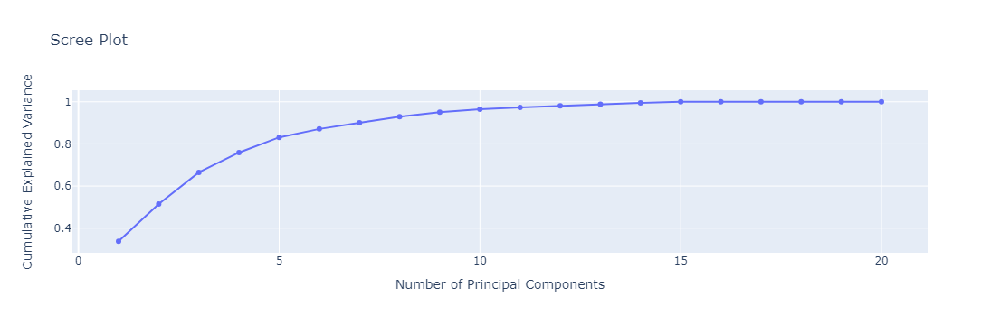

In [78]:
# Create a scree plot using Plotly Express
cum_var_all = np.cumsum(toy_exp_all)

fig = px.line(x=range(1, len(toy_exp_all) + 1), y=cum_var_all, 
              markers=True, title='Scree Plot',
              labels={'x': 'Number of Principal Components', 'y': 'Cumulative Explained Variance'})

fig.show()

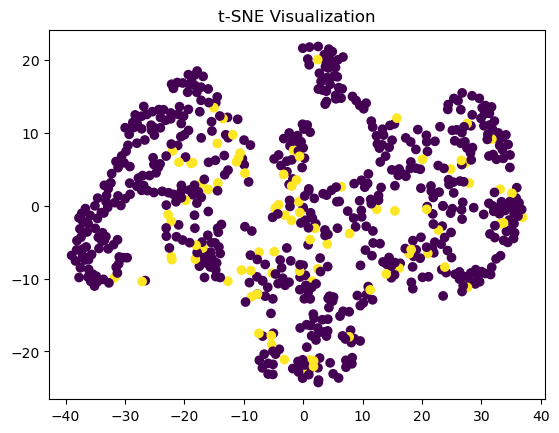

In [79]:
# Perform t-SNE on the feature matrix X
X_tsne = TSNE(n_components=2, random_state=42).fit_transform(X[num_cont_cols])

# Scatter plot the t-SNE visualization
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=data['RECURRENCE'], cmap='viridis')
plt.title('t-SNE Visualization')
plt.show()

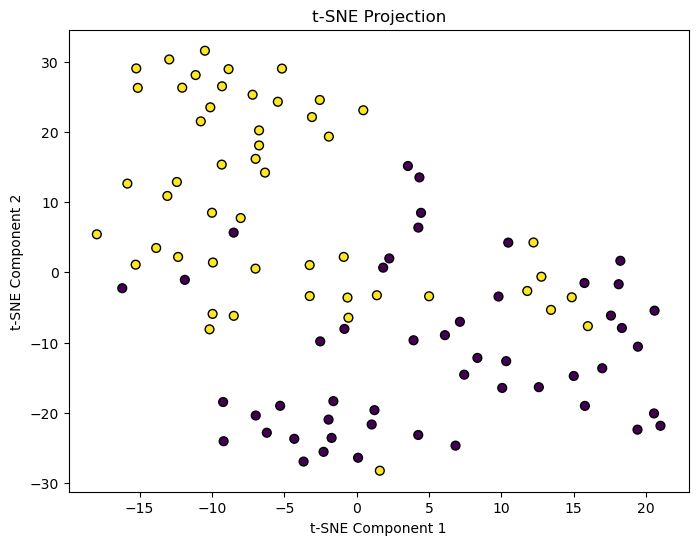

In [80]:
# Create a toy dataset
toy_X, toy_y = make_classification(n_samples=100, n_features=20, n_informative=10, n_redundant=5, random_state=42)

# t-SNE dimensionality reduction
tsne_model = TSNE(random_state=42, perplexity = 10)
toy_X_tsne = tsne_model.fit_transform(toy_X)

# Plot the t-SNE result
plt.figure(figsize=(8, 6))
plt.scatter(toy_X_tsne[:, 0], toy_X_tsne[:, 1], c=toy_y, cmap='viridis', edgecolor='k', s=40)
plt.title('t-SNE Projection')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



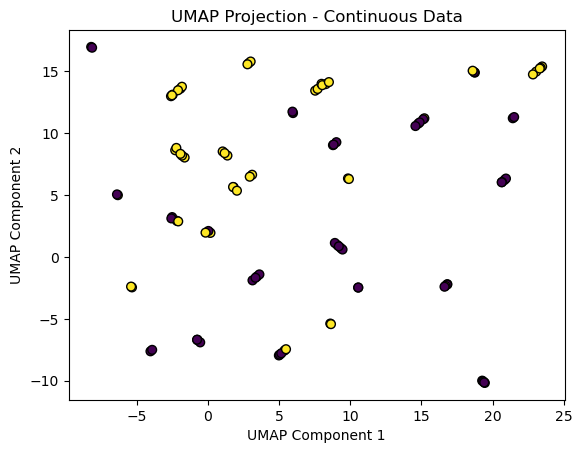

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



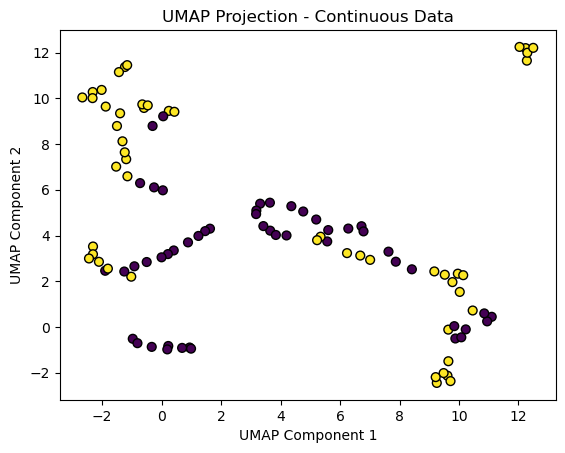

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



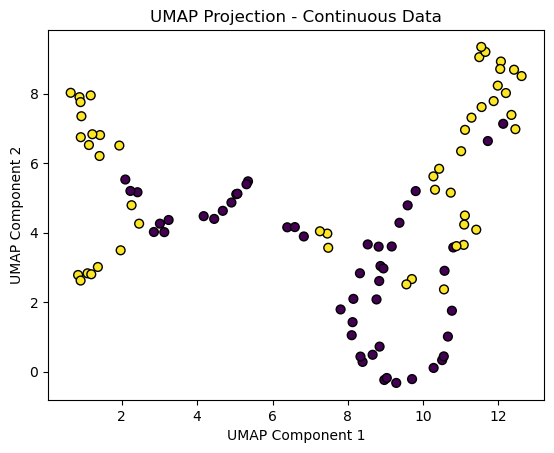

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



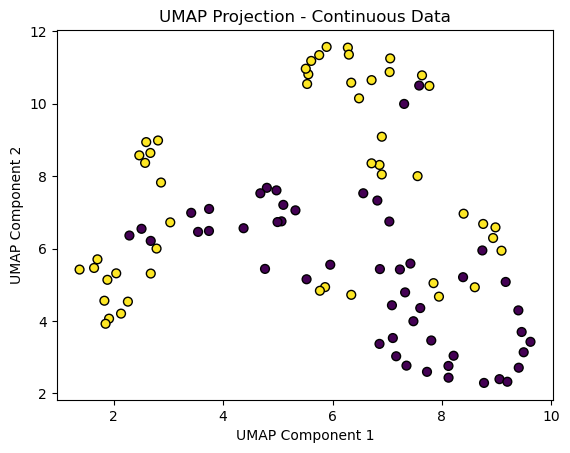

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



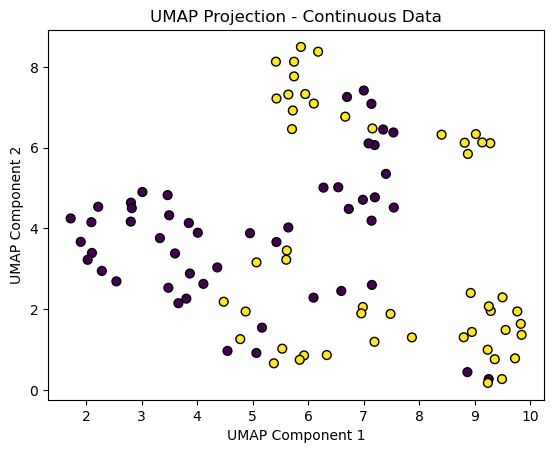

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



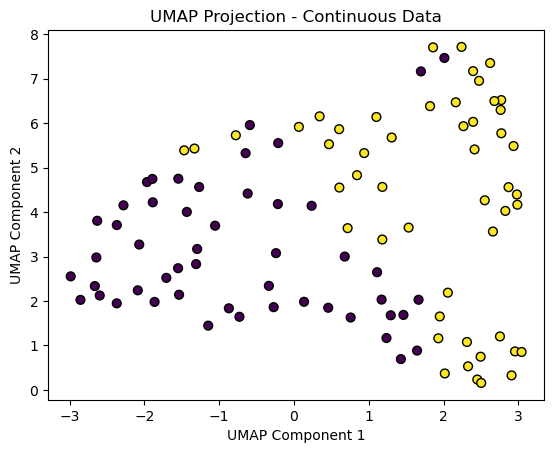

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



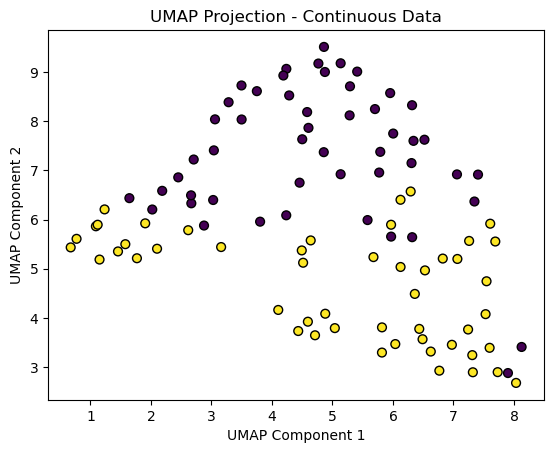

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



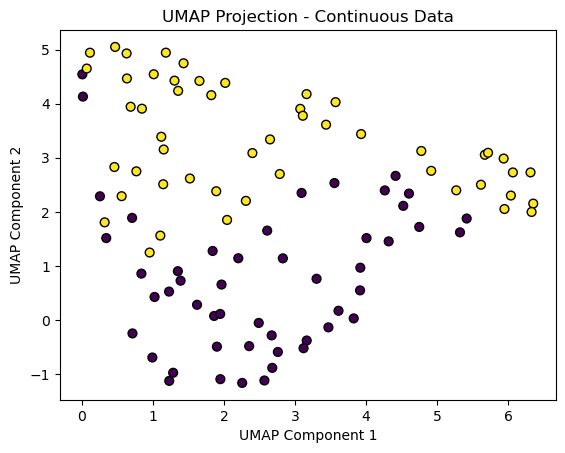

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



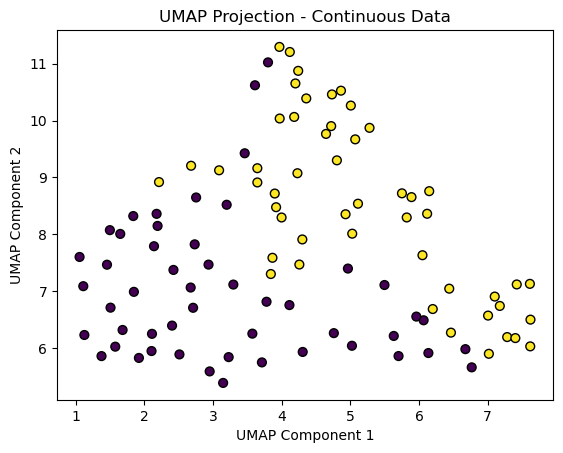

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



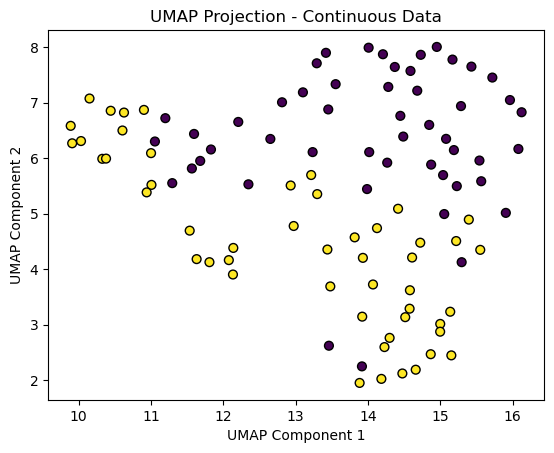

In [81]:
# Create a synthetic dataset with continuous features
for i in [2, 3, 4, 5, 7, 10, 12, 15, 18, 20]:
    # Create a synthetic dataset with continuous features and target labels
    X_continuous, y_continuous = make_classification(n_samples=100, n_features=5, n_informative=3, n_redundant=1, random_state=42)
    
    # Apply UMAP
    umap_model = UMAP(n_neighbors=i, min_dist=0.3, random_state=42)
    X_umap_continuous = umap_model.fit_transform(X_continuous)
    
    # Visualize the UMAP result
    plt.scatter(X_umap_continuous[:, 0], X_umap_continuous[:, 1], edgecolor='k', s=40, c = y_continuous)
    plt.title('UMAP Projection - Continuous Data')
    plt.xlabel('UMAP Component 1')
    plt.ylabel('UMAP Component 2')
    plt.show()

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.

C:\Users\aniru\anaconda3\lib\site-packages\sklearn\manifold\_spectral_embedding.py:392: UserWarning:

Exited at iteration 2000 with accuracies 
[1.93520871e-15 7.63475696e-07 6.82533768e-07 7.86390432e-06]
not reaching the requested tolerance 3.0249357223510742e-06.
Use iteration 1596 instead with accuracy 
1.3672977715755298e-06.


C:\Users\aniru\anaconda3\lib\site-packages\sklearn\manifold\_spectral_embedding.py:392: UserWarning:

Exited postprocessing with accuracies 
[5.46816813e-15 5.87723420e-07 8.17714711e-07 4.06375420e-06]
not reaching the requested tolerance 3.0249357223510742e-06.



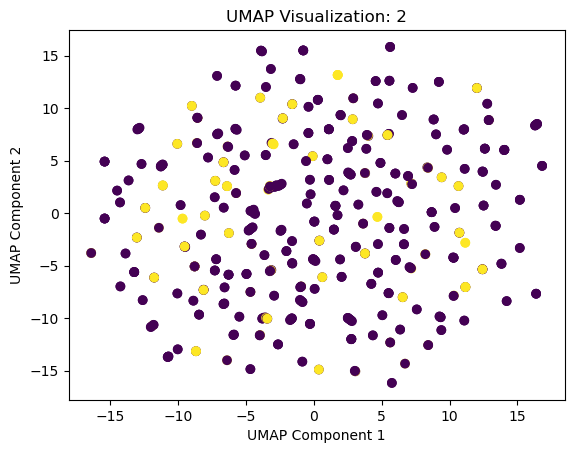

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



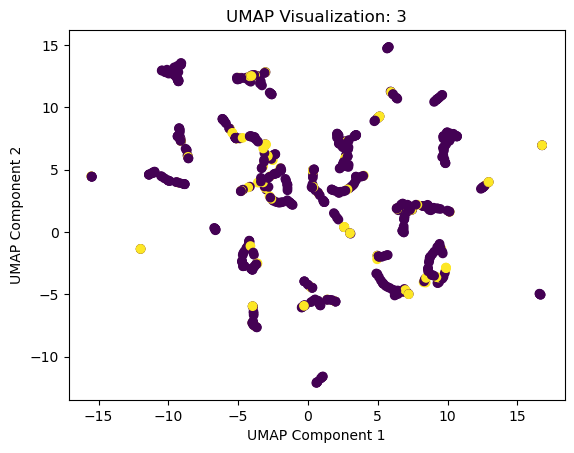

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



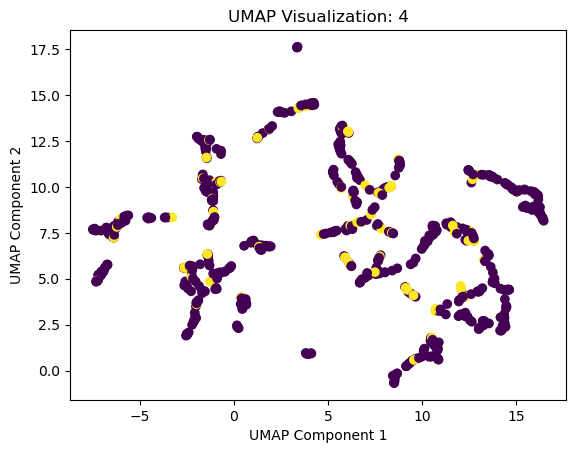

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



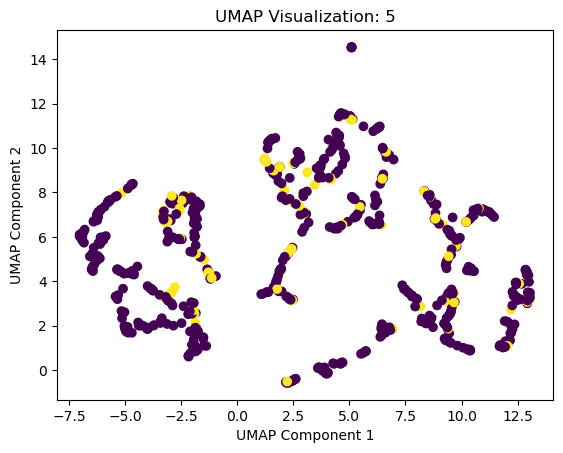

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



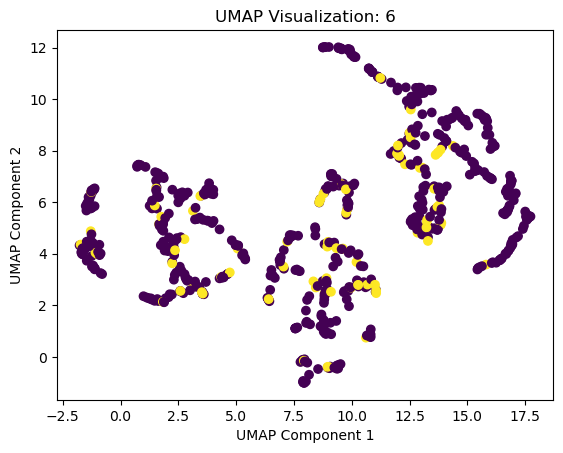

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



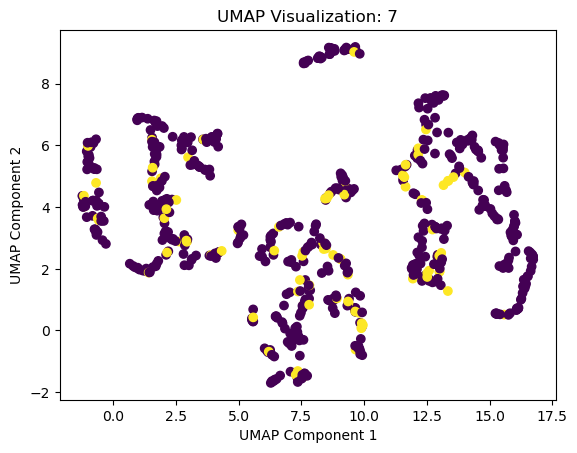

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



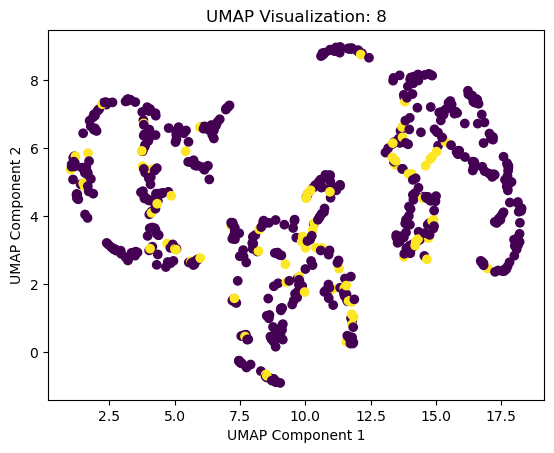

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



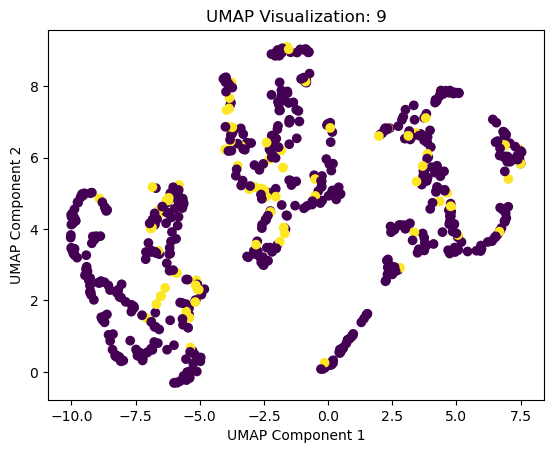

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



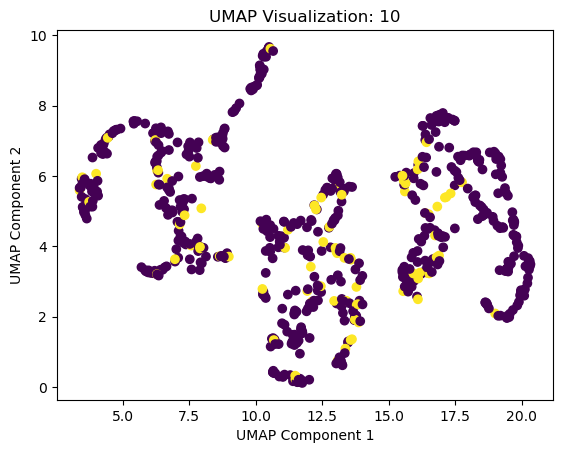

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



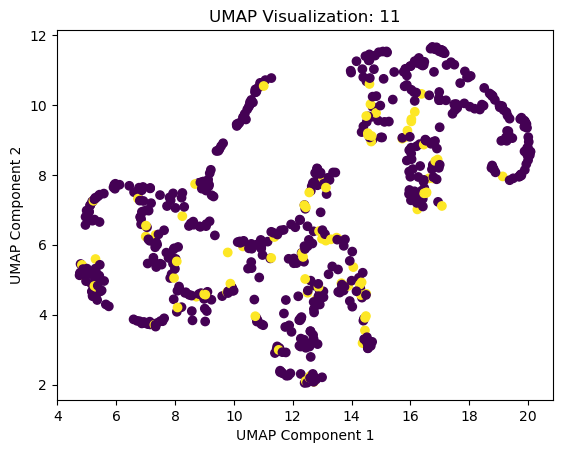

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



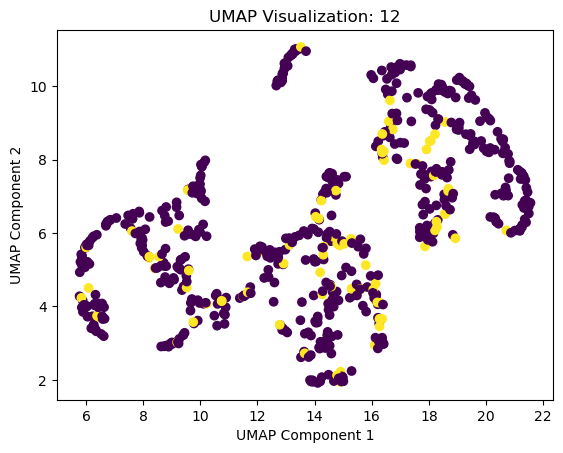

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



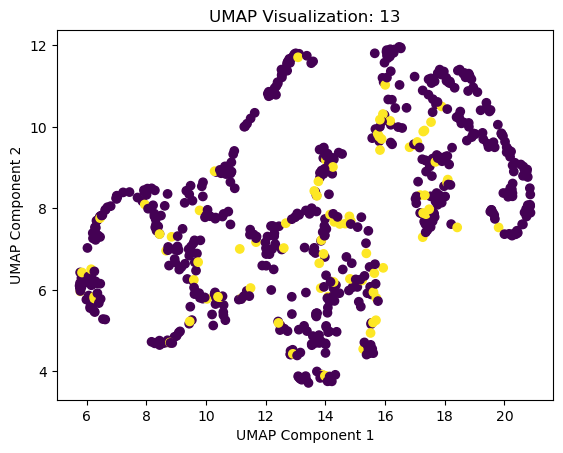

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



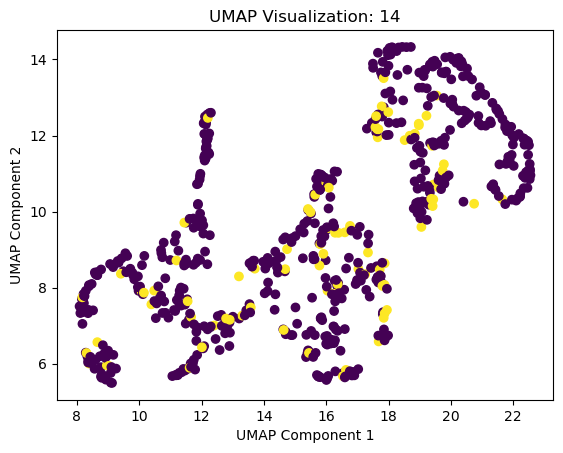

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



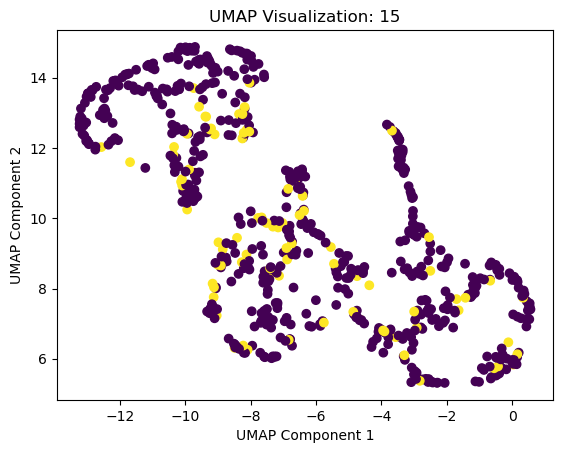

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



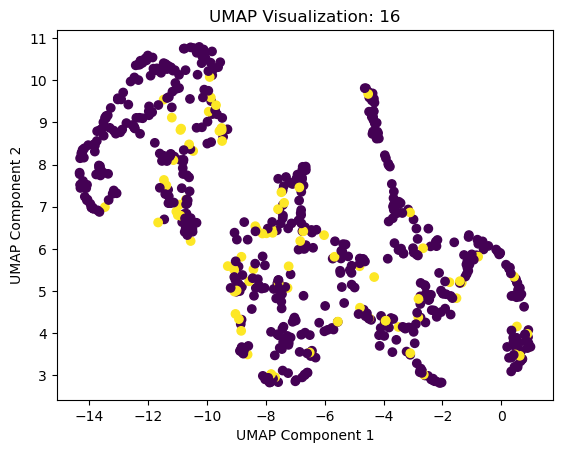

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



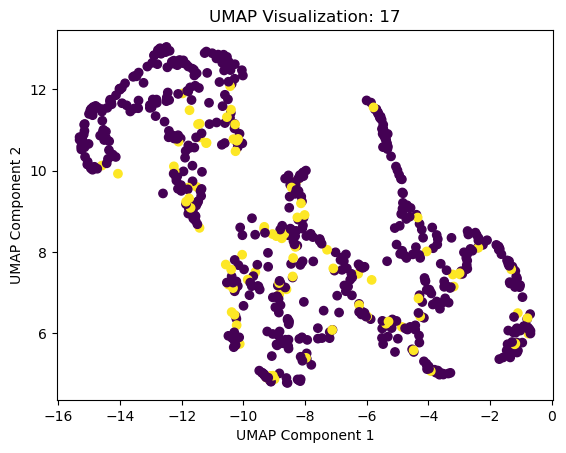

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



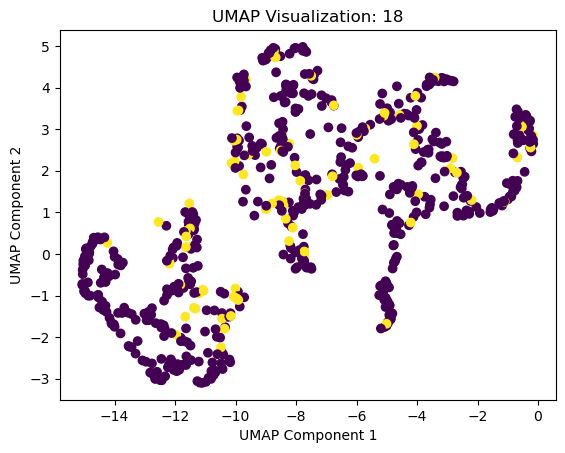

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



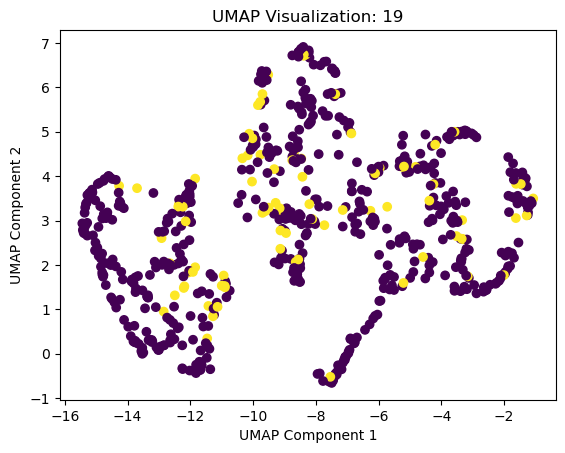

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



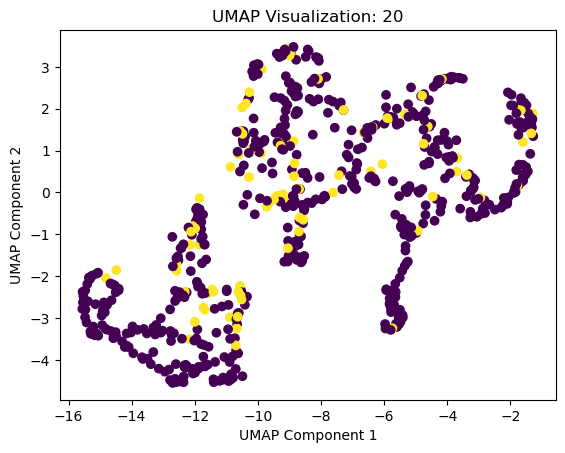

In [82]:
for i in range(2, 21):
    umap_model = UMAP(n_neighbors = i, n_components = 2, random_state = 42)
    umap_result = umap_model.fit_transform(X)
    plt.scatter(umap_result[:, 0], umap_result[:, 1], c=y, cmap='viridis')
    plt.title(f'UMAP Visualization: {i}')
    plt.xlabel('UMAP Component 1')
    plt.ylabel('UMAP Component 2')
    plt.show()